In [1]:
from statsmodels.tsa.arima_process import ArmaProcess 
from statsmodels.tsa.stattools import pacf, acf
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
import matplotlib.pyplot as plt
import numpy as np
import math
import pandas as pd
from pandas import Series
import random
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy import eye, asarray, dot, sum, diag
from scipy.linalg import svd
from mpl_toolkits.basemap import Basemap
import matplotlib as mpl
from matplotlib import cm
from colorspacious import cspace_converter
from collections import OrderedDict
from netCDF4 import Dataset
from numpy import linspace
from numpy import meshgrid
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.stattools import grangercausalitytests

from climate_indices import indices,compute
from climate_indices.indices import Distribution

import PCA_functions as pf

from tigramite import plotting as tp
from tigramite.pcmci import PCMCI
from tigramite.independence_tests import ParCorr, CMIknn
import tigramite.data_processing as pp

from statsmodels.tsa.stattools import adfuller
from Data import Data
from datetime import datetime

from sklearn.manifold import TSNE, MDS, Isomap
from sklearn.cluster import AgglomerativeClustering, DBSCAN, KMeans
from sklearn.metrics import adjusted_mutual_info_score
from mpl_toolkits.mplot3d import Axes3D

from scipy.cluster.hierarchy import dendrogram, linkage

from sklearn.cluster import KMeans

import itertools
from collections import Counter
import pickle

from numpy import linalg as LA

from scipy import stats
from scipy.special import inv_boxcox

import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from sklearn import metrics

import pulp as p
import re

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import pairwise_distances

/home/mathsys2/anaconda3/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
def deseasonalize(data,freq=12):
    """
    The shape of data should be (time, index) 
    """
    n  = data.shape[1]
    N  = data.shape[0]
    data_deseasonal = np.zeros(data.shape)
    Avgs = np.zeros((n,freq))
    Stds = np.zeros((n,freq))
    for i in range(n):
        temp = np.copy(data[:,i])
        temp = np.ravel(temp)
        r = np.zeros((N))
        for j in range(freq):
            Idx = np.arange(j,N,freq)
            if temp[Idx].std() == 0:
                r[Idx] = 0
            else:
                r[Idx] = (temp[Idx] - temp[Idx].mean())/temp[Idx].std()
            Avgs[i,j] = temp[Idx].mean()
            Stds[i,j] = temp[Idx].std()
        data_deseasonal[:,i] = np.copy(r)       
    return(data_deseasonal)

In [3]:
def deseasonalize_avg_std(data,freq=12):
    """
    The shape of data should be (time, index) 
    """
    n  = data.shape[1]
    N  = data.shape[0]
    data_deseasonal = np.zeros(data.shape)
    Avgs = np.zeros((n,freq))
    Stds = np.zeros((n,freq))
    for i in range(n):
        temp = np.copy(data[:,i])
        temp = np.ravel(temp)
        r = np.zeros((N))
        for j in range(freq):
            Idx = np.arange(j,N,freq)
            if temp[Idx].std() == 0:
                r[Idx] = 0
            else:
                r[Idx] = (temp[Idx] - temp[Idx].mean())/temp[Idx].std()
            Avgs[i,j] = temp[Idx].mean()
            Stds[i,j] = temp[Idx].std()
        data_deseasonal[:,i] = np.copy(r)       
    return(data_deseasonal, Avgs, Stds)

In [4]:
def load_obj(name):
    with open(name + '.pkl', 'rb') as f:
        return pickle.load(f)
class_dic = load_obj("class_dic")

def neighbour_vote(df,lat,lon):
    shift = [[-0.25,0,0.25],[-0.25,0,0.25]]
    shift_list = []
    for element in itertools.product(*shift):
        shift_list.append(element)
    shift_list.remove((0,0))
    result = []
    for x,y in shift_list:
        if not df[(df.lats == (lat + y)) & (df.lons == (lon + x))].clusters.values.size == 0:           
            result.append(np.asscalar(df[(df.lats == (lat + y)) & (df.lons == (lon + x))].clusters.values))
        else:
            result.append(-1)   
            
    return(np.array(result))

def neighbour_average(pre_list,result,lon,lat):
    shift = [[-0.25,0,0.25],[-0.25,0,0.25]]
    shift_list = []
    for element in itertools.product(*shift):
        shift_list.append(element)
    shift_list.remove((0,0))
    r = []
    for x,y in shift_list:
        if (lon + x,lat + y) in pre_list:
            j = pre_list.index((lon + x,lat + y))
            r.append(result.iloc[:,j].values)
        #else:
         #   print("NO")
          #  print(lon + x,lat + y)
           # r.append(np.zeros(817))   
    r = np.array(r)        
    return(np.average(r, axis=0))
    #return(r)

def neighbour_vote_class(dic,lat,lon):
    shift = [[-0.25,0.25],[-0.25,0.25]]
    shift_list = []
    for element in itertools.product(*shift):
        shift_list.append(element)
    #shift_list.remove((0,0))
    result = []
    for x,y in shift_list:
        if lon > 180: lon -= 360
        if (lat + y, lon + x) in class_dic.keys():
            result.append(class_dic[(lat + y, lon + x)])   
    return(np.array(result))

def fuzzify(x):
  # Add some "measurement error"" to each data point
    zero_idx = x==0
    x[zero_idx]+=0.005*np.random.uniform(0,1,1)[0]
    x[~zero_idx]+=0.005*np.random.uniform(-1,1,1)[0]
    return(x)
    
def transform(data):
    lambda_list = []
    n  = data.shape[1]
    N  = data.shape[0]
    data_transformed = np.zeros(data.shape)
    for i in range(n):
        x = fuzzify(pd.DataFrame(result[:,i]))[0].values
        data_transformed[:,i], lambda_ = stats.boxcox(x)
        lambda_list.append(lambda_)
    return(data_transformed, lambda_list)

In [5]:
def southern_season(data,s_index,n=6):
    data = pd.DataFrame(data)
    n_index = ~s_index
    data_south = pd.concat([data.iloc[s_index,n:].transpose(),data.iloc[s_index,:n].transpose()],ignore_index=True,sort=False, axis=0)
    data_north = data.iloc[n_index,:]
    data_south = data_south.transpose()
    d = pd.concat([data_north,data_south],ignore_index=False,sort=False, axis=1)
    d.iloc[s_index,:n*2] = d.iloc[s_index,n*2:]
    d.columns = list(np.arange(n*4))
    d = d.drop(d.columns[list(np.arange(n*2,n*4))], axis = 1)
    return(d)

In [6]:
start_year = 1901
end_year = 2020
n_components = 6
level = 12
temporal_limits = {"time_min":datetime(start_year, 1, 16, 0, 0),"time_max":datetime(end_year, 12, 16, 0, 0)}
spatial_limits={"lon_min":-23.75,"lon_max":58.75,"lat_min":-38.75,"lat_max":38.75}


d = Data('./nc/cru_ts4.05.1901.2020.pre.dat.nc','pre',temporal_limits,spatial_limits, missing_value=9.96921e+36)

result_pre = d.get_data()
lon_list = d.get_lon_list()
lat_list = d.get_lat_list()
lon = d.get_lon()
lat = d.get_lat()

index = np.where(result_pre[0,:] != 9.96921e+36)[1]

result_pre = result_pre[:,index]
lon_list = np.array(lon_list)[index]
lat_list = np.array(lat_list)[index]

d = Data('./nc/cru_ts4.05.1901.2020.tmp.dat.nc','tmp',temporal_limits,spatial_limits, missing_value=9.96921e+36)

result_air = d.get_data()
lon_list_air = d.get_lon_list()
lat_list_air = d.get_lat_list()
lon_air = d.get_lon()
lat_air = d.get_lat()

index = np.where(result_air[0,:] != 9.96921e+36)[1]

result_air = result_air[:,index]
lon_list_air = np.array(lon_list_air)[index]
lat_list_air = np.array(lat_list_air)[index]

In [7]:
precipitation = result_pre.copy()
temperature = result_air.copy()

#precipitation = precipitation/precipitation.std()
#temperature = temperature/temperature.std()

precipitation, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
temperature, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)

avgs_pre = pd.DataFrame(avgs_pre)
avgs_temp = pd.DataFrame(avgs_temp)
#stds_pre = pd.DataFrame(stds_pre)
#stds_temp = pd.DataFrame(stds_temp)

df = pd.DataFrame({"lons":lon_list,"lats":lat_list})

lon_temp = df["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df["lons"] = lon_temp


s_index = (df["lats"] <= 0).values
n_index = (df["lats"] > 0).values

avgs_pre = southern_season(avgs_pre,s_index)
avgs_temp = southern_season(avgs_temp,s_index)

In [8]:
data = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)

In [27]:
n_components = 15
clustering = KMeans(n_clusters=n_components).fit(np.transpose(data))

In [28]:
df["clusters"] = clustering.labels_

In [29]:
col_index = np.array([False, False, True])
index = (df.lats > 36) & (df.lons < -0.4).values
df.loc[index, col_index] = np.nan

index = (df.lats > 12) & (df.lons > 44) &(df.lons < 49).values
df.loc[index, col_index] = np.nan

index = (df.lats > 34) & (df.lons > 11.55).values
df.loc[index, col_index] = np.nan

index = (df.lats > 18) & (df.lons > 40).values
df.loc[index, col_index] = np.nan

index = (df.lats > 19) & (df.lons > 38).values
df.loc[index, col_index] = np.nan

index = (df.lats > 24) & (df.lons > 35.5).values
df.loc[index, col_index] = np.nan

index = (df.lats > 15) & (df.lons > 41.5).values
df.loc[index, col_index] = np.nan

index = (df.lats > 13.5) & (df.lons > 43).values
df.loc[index, col_index] = np.nan

index = (df.lats > 27) & (df.lons > 34.97).values
df.loc[index, col_index] = np.nan

index = (df.lats > 27.7) & (df.lons > 33.68).values
df.loc[index, col_index] = np.nan

index = df.clusters == 'nan'
df.loc[index, col_index] = np.nan

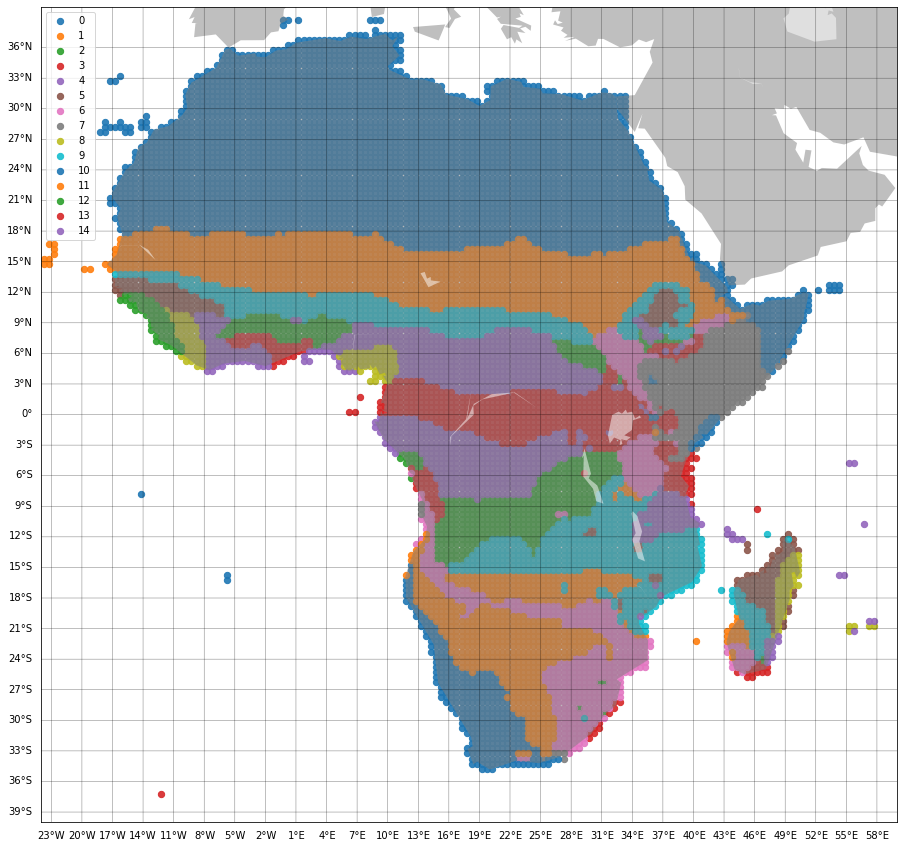

In [30]:
df_list = []
for j in range(n_components):
    df_list.append(pd.DataFrame(columns=df.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)

#colors = pf.random_color_1(n_components)

for i in range(n_components):
    values = df["clusters"].values  
    Idx = np.where(values == i)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=40, label = i)

    
plt.legend()
plt.show()

In [98]:
BWh_m = np.ones(data.T.shape)*BWh.T

In [117]:
np.sqrt(((BWh_m-np.array(data).T) ** 2).sum(1))

array([145.10204112, 133.02427299, 153.72967164, ...,  83.83537238,
        59.98815173,  56.22499259])

In [133]:
def load_obj(name):
    with open(name + '.pkl', 'rb') as f:
        return pickle.load(f)
class_dic = load_obj("class_dic")

In [134]:
class_list = []
for i in range(len(lon_list)):
    lon, lat = lon_list[i], lat_list[i]
    if lon > 180: lon -= 360
    if (lat, lon) in class_dic.keys(): 
        class_list.append(class_dic[(lat, lon)])
    else:
        class_list.append(np.nan)

In [108]:
df['class'] = class_list

In [61]:
c = Counter(class_list)

#n_most_common = 3
most_common = c.most_common()

In [62]:
most_common

[('BWh', 5499),
 ('Aw', 2776),
 ('BSh', 1793),
 ('Csa', 588),
 ('Am', 409),
 ('Cwa', 393),
 ('BSk', 378),
 ('BWk', 215),
 ('Af', 205),
 ('Cwb', 189),
 ('Cfb', 137),
 ('As', 96),
 ('Cfa', 65),
 ('Csb', 62),
 (nan, 58),
 ('Dsa', 50),
 ('Dsb', 37),
 ('Dfa', 2)]

In [135]:
class_list = np.array(class_list)

In [136]:
class_name = 'Af'

In [137]:
index = (class_list == class_name)

In [138]:
class_data = data.iloc[:,index].mean(1).values

In [139]:
class_data

array([ 90.91331047, 111.44233832, 139.48139137, 161.77624166,
       164.99899363, 152.51850119, 150.09176429, 165.5529407 ,
       192.73468077, 193.88271283, 155.69731404, 107.62763519,
        23.69637822,  24.02100425,  24.37669922,  24.61587007,
        24.74739453,  24.5164391 ,  24.35063427,  24.50393092,
        24.70862608,  24.6411748 ,  24.46455703,  23.91369115])

In [140]:
start_year = np.arange(1901,1996,5)
end_year = np.arange(1930,2025,5)
n_components = 6
level = 12
spatial_limits={"lon_min":-23.75,"lon_max":58.75,"lat_min":-38.75,"lat_max":38.75}
cluster_letter = {0:'A', 1:'B', 2:'C', 3:'D', 4:'E', 5:'F'}
letters = ['A','B','C','D','E','F']

dist = []

In [141]:
for xyz in range(len(start_year)):
    temporal_limits = {"time_min":datetime(start_year[xyz], 1, 16, 0, 0),"time_max":datetime(end_year[xyz], 12, 16, 0, 0)}
    d = Data('./nc/cru_ts4.05.1901.2020.pre.dat.nc','pre',temporal_limits,spatial_limits, missing_value=9.96921e+36)

    result = d.get_data()
    lon_list = d.get_lon_list()
    lat_list = d.get_lat_list()
    lon = d.get_lon()
    lat = d.get_lat()

    index = np.where(result[0,:] != 9.96921e+36)[1]

    result = result[:,index]
    lon_list = np.array(lon_list)[index]
    lat_list = np.array(lat_list)[index]

    d = Data('./nc/cru_ts4.05.1901.2020.tmp.dat.nc','tmp',temporal_limits,spatial_limits, missing_value=9.96921e+36)

    result_air = d.get_data()
    lon_list_air = d.get_lon_list()
    lat_list_air = d.get_lat_list()
    lon_air = d.get_lon()
    lat_air = d.get_lat()

    index = np.where(result_air[0,:] != 9.96921e+36)[1]

    result_air = result_air[:,index]
    lon_list_air = np.array(lon_list_air)[index]
    lat_list_air = np.array(lat_list_air)[index]

    pre_list = list(zip(lon_list,lat_list))
    air_list = list(zip(lon_list_air,lat_list_air))

    precipitation = result.copy()
    temperature = result_air.copy()

    #precipitation = precipitation/precipitation.std()
    #temperature = temperature/temperature.std()

    precipitation, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
    temperature, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)

    avgs_pre = pd.DataFrame(avgs_pre)
    avgs_temp = pd.DataFrame(avgs_temp)
    #stds_pre = pd.DataFrame(stds_pre)
    #stds_temp = pd.DataFrame(stds_temp)

    df = pd.DataFrame({"lons":lon_list,"lats":lat_list})

    lon_temp = df["lons"].values
    lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
    df["lons"] = lon_temp

    s_index = (df["lats"] <= 0).values
    n_index = (df["lats"] > 0).values

    avgs_pre = southern_season(avgs_pre,s_index)
    avgs_temp = southern_season(avgs_temp,s_index)

    data = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)
    
    class_m = np.ones(data.T.shape)*class_data.T
    dist.append(np.sqrt(((class_m-np.array(data).T) ** 2).sum(1)))
    
    

In [142]:
dist = np.array(dist)

In [143]:
np.save("dist_{}.npy".format(class_name),dist)

In [144]:
class_name

'Af'

In [10]:
dist = np.load("dist_{}.npy".format(class_names[0]))

In [11]:
class_names = ['BWh','Aw','BSh','Csa','Am','Cwa','BSk','BWk','Af']

In [12]:
data = np.zeros((dist.shape[0], dist.shape[1], 9))

In [13]:
for i in range(len(class_names)):
    dist = np.load("dist_{}.npy".format(class_names[i]))
    data[:,:,i] = dist

In [14]:
results = []
for i in range(19):
    result = []
    for j in range(12952):
        result.append(class_names[np.argmin(data[i,j,:])])
    results.append(result)

In [15]:
results = np.array(results)

In [153]:
np.where(results == "BSh")

(array([ 0,  0,  0, ..., 18, 18, 18]),
 array([    0,     1,     2, ..., 11369, 11370, 11371]))

In [238]:
results

array([['BSh', 'BSh', 'BSh', ..., 'BSk', 'BWk', 'BWk'],
       ['BSh', 'BSh', 'BSh', ..., 'BSk', 'BWk', 'BWk'],
       ['BSh', 'BSh', 'BSh', ..., 'BSk', 'BWk', 'BWk'],
       ...,
       ['BSh', 'BSh', 'BSh', ..., 'BSk', 'BWk', 'BWk'],
       ['BSh', 'BSh', 'BSh', ..., 'BSk', 'BWk', 'BWk'],
       ['BSh', 'BSh', 'BSh', ..., 'BSk', 'BWk', 'BWk']], dtype='<U3')

In [16]:
results.shape

(19, 12952)

In [17]:
diff = np.zeros(results.shape[1])
old_clusters = results[0,:].copy()
for i in range(1,results.shape[0]):
    new_clusters = results[i,:].copy()
    for j in range(len(new_clusters)):
        if not old_clusters[j] == new_clusters[j]:
            diff[j] = diff[j]+1
    old_clusters = results[i,:].copy()

In [18]:
diff

array([0., 4., 0., ..., 0., 0., 0.])

In [19]:
index = np.where(diff == 1)[0]

In [20]:
a = results[0,index[0]]

In [21]:
b = results[-1,index[0]]

In [22]:
dic={}

In [23]:
dic[(a,b)]=1

In [24]:
if (a,b) in dic.keys():
    dic[(a,b)]=dic[(a,b)]+1

In [25]:
dic={}
for i in range(len(index)):
    a = results[0,index[i]]
    b = results[-1,index[i]]
    if (a,b) in dic.keys():
        dic[(a,b)]=dic[(a,b)]+1
    else:
        dic[(a,b)]=1

In [35]:
dic

{('Af', 'Am'): 11,
 ('Af', 'Aw'): 4,
 ('Am', 'Af'): 2,
 ('Am', 'Aw'): 55,
 ('Am', 'Cwa'): 1,
 ('Aw', 'Af'): 5,
 ('Aw', 'Am'): 15,
 ('Aw', 'BSh'): 3,
 ('Aw', 'Cwa'): 35,
 ('BSh', 'Aw'): 15,
 ('BSh', 'BWh'): 19,
 ('BSh', 'Cwa'): 2,
 ('BSk', 'BSh'): 5,
 ('BSk', 'BWk'): 35,
 ('BSk', 'Csa'): 6,
 ('BWh', 'BWk'): 2,
 ('BWk', 'BSh'): 3,
 ('BWk', 'BSk'): 1,
 ('BWk', 'BWh'): 105,
 ('Csa', 'Af'): 5,
 ('Csa', 'BSk'): 47,
 ('Cwa', 'Aw'): 5,
 ('Cwa', 'BSh'): 81}

In [52]:
np.array(matrix)

array([[  0.,   0.,   0.,   0.,   0.,   0.,   0.,   2.,   0.],
       [  0.,   0.,   3.,   0.,  15.,  35.,   0.,   0.,   5.],
       [ 19.,  15.,   0.,   0.,   0.,   2.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,  47.,   0.,   5.],
       [  0.,  55.,   0.,   0.,   0.,   1.,   0.,   0.,   2.],
       [  0.,   5.,  81.,   0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   5.,   6.,   0.,   0.,   0.,  35.,   0.],
       [105.,   0.,   3.,   0.,   0.,   0.,   1.,   0.,   0.],
       [  0.,   4.,   0.,   0.,  11.,   0.,   0.,   0.,   0.]])

In [53]:
np.array(matrix).ravel()

array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   2.,   0.,   0.,   0.,
         3.,   0.,  15.,  35.,   0.,   0.,   5.,  19.,  15.,   0.,   0.,
         0.,   2.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
        47.,   0.,   5.,   0.,  55.,   0.,   0.,   0.,   1.,   0.,   0.,
         2.,   0.,   5.,  81.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   5.,   6.,   0.,   0.,   0.,  35.,   0., 105.,   0.,   3.,
         0.,   0.,   0.,   1.,   0.,   0.,   0.,   4.,   0.,   0.,  11.,
         0.,   0.,   0.,   0.])

In [26]:
class_names

['BWh', 'Aw', 'BSh', 'Csa', 'Am', 'Cwa', 'BSk', 'BWk', 'Af']

In [31]:
matrix = np.zeros((len(class_names), len(class_names)))

In [32]:
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if (class_names[i],class_names[j]) in dic.keys():
            matrix[i,j] = dic[(class_names[i],class_names[j])]
    

In [46]:
matrix = matrix.tolist()


In [41]:
from chord import Chord

In [47]:
Chord(matrix, class_names).show()

In [ ]:
results[:,11099]

In [251]:
df

,lons,lats,clusters
0,-23.75,14.75,0.0
1,-23.75,15.25,4.0
2,-23.25,14.75,0.0
3,-23.25,15.25,2.0
4,-23.25,16.75,4.0
...,...,...,...
12947,58.75,36.75,0.0
12948,58.75,37.25,0.0
12949,58.75,37.75,0.0
12950,58.75,38.25,0.0


In [245]:
df["clusters"] = diff

deg = np.zeros((len(lat),len(lon)))

lat_number = deg.shape[0]
lon_number = deg.shape[1]

for i in range(lat_number):
    for j in range(lon_number):
        if not df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values.size == 0:
            if df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values == 1:
                deg[i,j] = 1
            else:
                deg[i,j] = np.nan
        else:
            deg[i,j]=np.nan


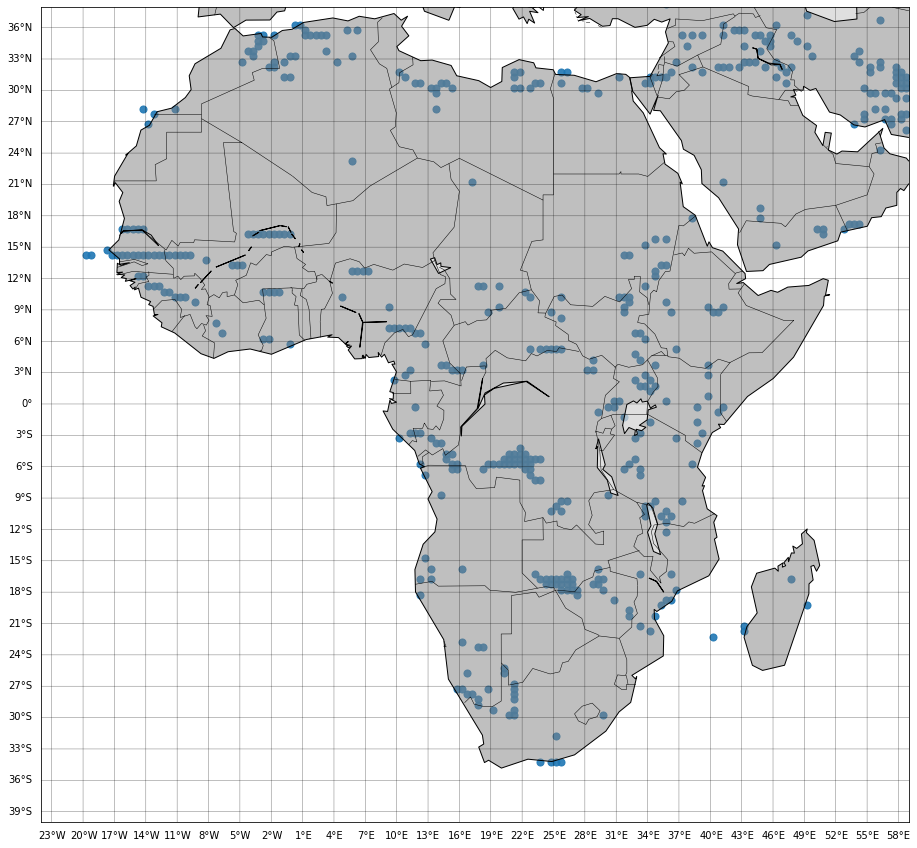

In [247]:
fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


values = df["clusters"].values  
Idx = np.where(values == 1)[0]
#df_list[i] = df.iloc[Idx,:]
#df_list[i]["values"] = values[Idx]

lons = df.iloc[Idx,0].values
lats = df.iloc[Idx,1].values
x,y = m(lons, lats)
ax.scatter(x, y, alpha=0.9, s=50, label = i)

    
#plt.title("Clustering, {} - {}".format(start_year, end_year), fontsize = 20)     
#plt.legend()
plt.savefig("once change.png")
plt.show()

In [17]:
classes = np.zeros

(19, 12952)

In [77]:
class_name = "Af"

In [78]:
dist = np.load("dist_{}.npy".format(class_name))

In [22]:
delta = np.diff(dist,axis=0)

In [23]:
slope = []
for i in range(dist.shape[1]):
    slope = list(slope)
    y = delta[:,i]
    slope.append(abs(sum(y[y<0]))/sum(y[y>0]))
    slope = np.array(slope)
    I = np.isinf(slope)
    slope[I] = slope[~I].max()

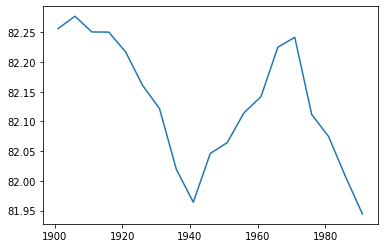

In [19]:
plt.plot(start_year,dist[:,31])

In [282]:
slope = np.array(slope)

In [296]:
I = np.isinf(slope)

(array([], dtype=int64),)

array([False, False, False, ..., False, False, False])

In [161]:
result = []
for i in range(delta.shape[1]):
    result.append(np.all(delta[:,i] > 0))

In [162]:
index_change = np.array(result)

In [130]:
delta[:,0]

array([ 0.00666162,  0.03759291, -0.00408925,  0.00619422, -0.07174979,
       -0.00364872, -0.03571279, -0.04130091,  0.04897021,  0.0048834 ,
        0.08430533,  0.01715238,  0.04064888,  0.04444544, -0.04984859,
       -0.00563814, -0.03105981, -0.02142889])

In [163]:
df['clusters'] = index_change

In [164]:
np.where(index_change == True)

(array([], dtype=int64),)

In [222]:
df[clus]

,lons,lats,change,clusters
0,-23.75,14.75,False,False
1,-23.75,15.25,False,False
2,-23.25,14.75,False,False
3,-23.25,15.25,False,False
4,-23.25,16.75,False,False
...,...,...,...,...
12947,58.75,36.75,False,False
12948,58.75,37.25,False,False
12949,58.75,37.75,False,False
12950,58.75,38.25,False,False


In [151]:
deg = np.zeros((len(lat),len(lon)))

lat_number = deg.shape[0]
lon_number = deg.shape[1]

for i in range(lat_number):
    for j in range(lon_number):
        if not df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values.size == 0:
            if df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values == True:
                deg[i,j] = 1
            else:
                deg[i,j] = np.nan
        else:
            deg[i,j]=np.nan


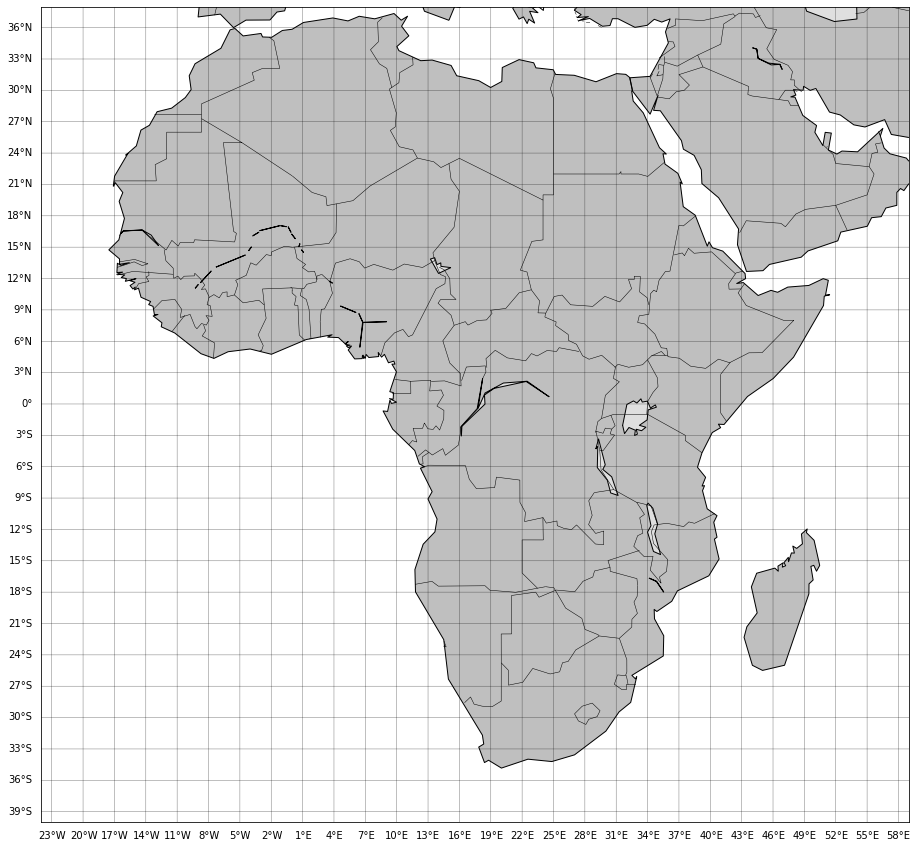

In [153]:
fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


values = df["clusters"].values  
Idx = np.where(values == 1)[0]
#df_list[i] = df.iloc[Idx,:]
#df_list[i]["values"] = values[Idx]

lons = df.iloc[Idx,0].values
lats = df.iloc[Idx,1].values
x,y = m(lons, lats)
ax.scatter(x, y, alpha=0.9, s=50, label = i)

    
#plt.title("Clustering, {} - {}".format(start_year, end_year), fontsize = 20)     
#plt.legend()
#plt.savefig("start end diff.png")
plt.show()

In [28]:
df = pd.DataFrame({"lons":lon_list,"lats":lat_list})

lon_temp = df["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df["lons"] = lon_temp

In [168]:
class_names = ['BWh','Aw','BSh','Csa','Am','Cwa','BSk','BWk','Af']

In [222]:
i = 5
class_name = class_names[i]

In [223]:
dist = np.load("dist_{}.npy".format(class_name))

In [224]:
diff = (dist[0,:] - dist[-1,:])/19

In [225]:
df["clusters"] = diff

In [226]:
index = (class_list == class_name)

In [227]:
df.iloc[~index,2] = np.nan

In [228]:
deg = np.zeros((len(lat),len(lon)))

lat_number = deg.shape[0]
lon_number = deg.shape[1]

for i in range(lat_number):
    for j in range(lon_number):
        if not df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values.size == 0:
            deg[i,j] = df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values
           # if df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values == 1:
           #     deg[i,j] = 1
           # else:
           #     deg[i,j] = np.nan
        else:
            deg[i,j]=np.nan

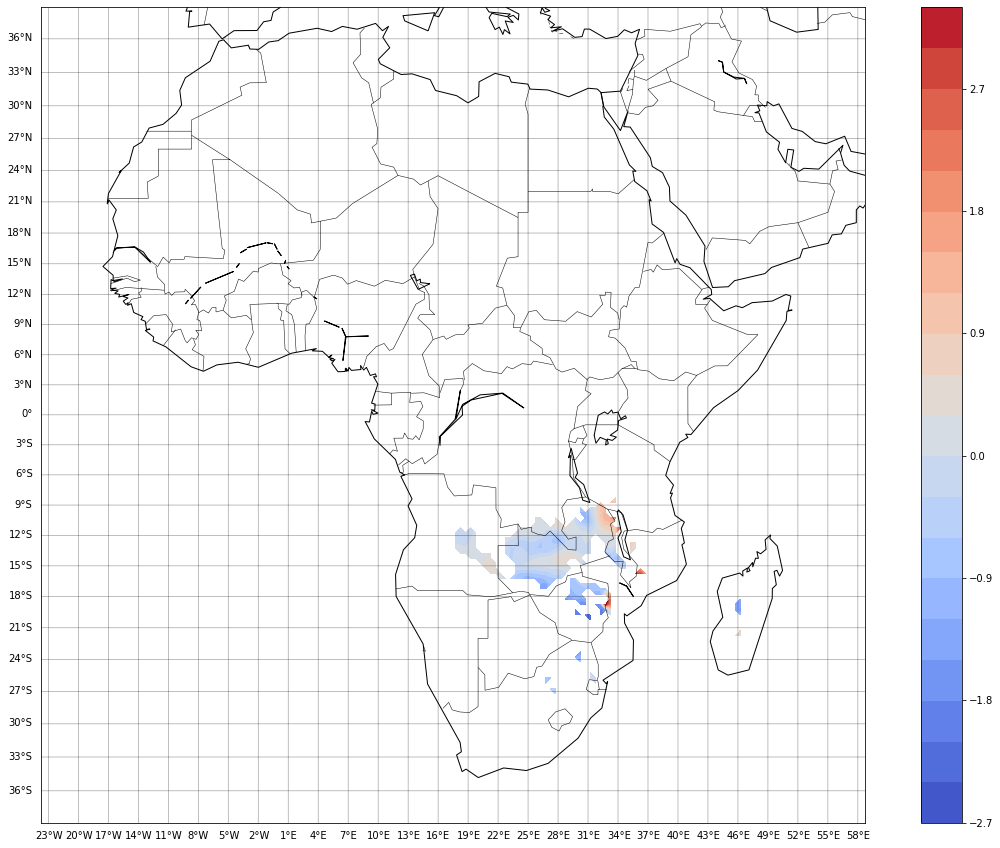

In [229]:
m=Basemap(projection='mill',lat_ts=50,llcrnrlon=lon.min(), \
  urcrnrlon=lon.max(),llcrnrlat=lat.min(),urcrnrlat=lat.max(), \
  resolution='c')
#m = Basemap(projection='ortho',lat_0=0,lon_0=-180,resolution='l')

lon2, lat2 = np.meshgrid(lon,lat)
x, y = m(lon2, lat2)
fig = plt.figure(figsize=(20,15))
#m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
cs = m.contourf(x,y,deg,20,cmap=plt.cm.get_cmap('coolwarm'))
plt.colorbar();
#plt.title(' EOF {}'.format(pc), fontsize = 20)
plt.savefig("Ditnace from {} within {}.png".format(class_name, class_name))

In [230]:
df["clusters"] = diff

index = (class_list == class_name)

df.iloc[index,2] = np.nan

deg = np.zeros((len(lat),len(lon)))

lat_number = deg.shape[0]
lon_number = deg.shape[1]

for i in range(lat_number):
    for j in range(lon_number):
        if not df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values.size == 0:
            deg[i,j] = df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values
           # if df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values == 1:
           #     deg[i,j] = 1
           # else:
           #     deg[i,j] = np.nan
        else:
            deg[i,j]=np.nan

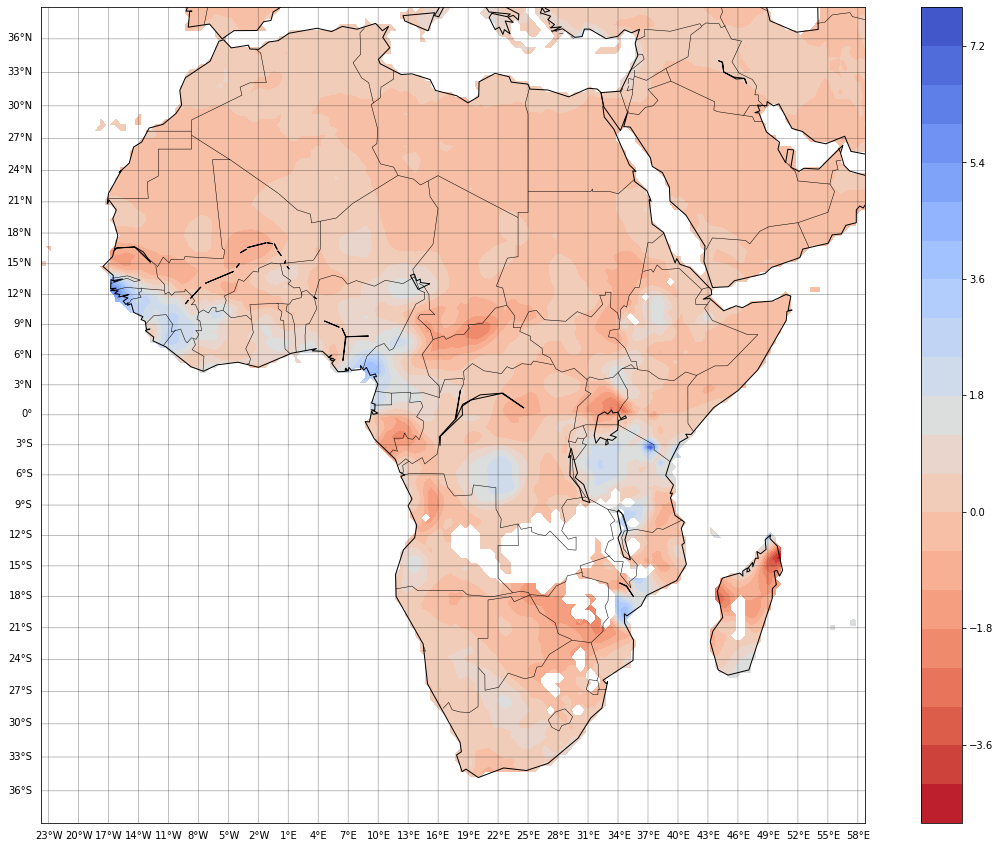

In [231]:
m=Basemap(projection='mill',lat_ts=50,llcrnrlon=lon.min(), \
  urcrnrlon=lon.max(),llcrnrlat=lat.min(),urcrnrlat=lat.max(), \
  resolution='c')
#m = Basemap(projection='ortho',lat_0=0,lon_0=-180,resolution='l')

lon2, lat2 = np.meshgrid(lon,lat)
x, y = m(lon2, lat2)
fig = plt.figure(figsize=(20,15))
#m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
cs = m.contourf(x,y,deg,20,cmap=plt.cm.get_cmap('coolwarm_r'))
plt.colorbar();
#plt.title(' EOF {}'.format(pc), fontsize = 20)
plt.savefig("Ditnace from {} outdide of {}.png".format(class_name, class_name))

# Change of Clusters

In [55]:
start_year = np.arange(1906,1996,5)
end_year = np.arange(1935,2025,5)
n_components = 6
level = 12
spatial_limits={"lon_min":-23.75,"lon_max":58.75,"lat_min":-38.75,"lat_max":38.75}
cluster_letter = {0:'A', 1:'B', 2:'C', 3:'D', 4:'E', 5:'F'}
letters = ['A','B','C','D','E','F']

In [94]:
all_clusters = []

In [59]:
for xyz in range(len(start_year)):
    temporal_limits = {"time_min":datetime(start_year[xyz], 1, 16, 0, 0),"time_max":datetime(end_year[xyz], 12, 16, 0, 0)}
    d = Data('./nc/cru_ts4.05.1901.2020.pre.dat.nc','pre',temporal_limits,spatial_limits, missing_value=9.96921e+36)

    result = d.get_data()
    lon_list = d.get_lon_list()
    lat_list = d.get_lat_list()
    lon = d.get_lon()
    lat = d.get_lat()

    index = np.where(result[0,:] != 9.96921e+36)[1]

    result = result[:,index]
    lon_list = np.array(lon_list)[index]
    lat_list = np.array(lat_list)[index]

    d = Data('./nc/cru_ts4.05.1901.2020.tmp.dat.nc','tmp',temporal_limits,spatial_limits, missing_value=9.96921e+36)

    result_air = d.get_data()
    lon_list_air = d.get_lon_list()
    lat_list_air = d.get_lat_list()
    lon_air = d.get_lon()
    lat_air = d.get_lat()

    index = np.where(result_air[0,:] != 9.96921e+36)[1]

    result_air = result_air[:,index]
    lon_list_air = np.array(lon_list_air)[index]
    lat_list_air = np.array(lat_list_air)[index]

    pre_list = list(zip(lon_list,lat_list))
    air_list = list(zip(lon_list_air,lat_list_air))

    precipitation = result.copy()
    temperature = result_air.copy()

    precipitation = precipitation/precipitation.std()
    temperature = temperature/temperature.std()

    precipitation, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
    temperature, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)

    avgs_pre = pd.DataFrame(avgs_pre)
    avgs_temp = pd.DataFrame(avgs_temp)
    #stds_pre = pd.DataFrame(stds_pre)
    #stds_temp = pd.DataFrame(stds_temp)

    df = pd.DataFrame({"lons":lon_list,"lats":lat_list})

    lon_temp = df["lons"].values
    lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
    df["lons"] = lon_temp

    s_index = (df["lats"] <= 0).values
    n_index = (df["lats"] > 0).values

    avgs_pre = southern_season(avgs_pre,s_index)
    avgs_temp = southern_season(avgs_temp,s_index)

    combined_vertically = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)

    clustering = AgglomerativeClustering(n_clusters=n_components).fit(combined_vertically.transpose())  
    new_clusters = clustering.labels_.copy()
    
    df["clusters"]=clustering.labels_
    precipitation = result.copy()
    temperature = result_air.copy()


    _, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
    _, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)


    avgs_pre = pd.DataFrame(avgs_pre)
    avgs_temp = pd.DataFrame(avgs_temp)

    data = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)
    data = data.transpose()

    mean_pre = np.zeros((n_components,12))
    mean_temp = np.zeros((n_components,12))

    for i in range(n_components):
        Index = (df["clusters"] == i).values
        mean_pre[i,] = data.iloc[Index,:].mean().values[:12]
        mean_temp[i,] = data.iloc[Index,:].mean().values[12:]

    new = pd.concat([pd.DataFrame(mean_pre), pd.DataFrame(mean_temp)], axis=1)

    distance = pairwise_distances(new, initial)

    index = []
    for i in range(n_components):
        index.append(np.argmin(distance[i,:]))
    
    #similarity = np.zeros((n_components,n_components))
    #for i in range(n_components): 
    #    i_Idx = np.where(new_clusters == i)[0]
    #    for j in range(n_components):         
    #        j_Idx = np.where(old_clusters == j)[0]
    #        similarity[i,j] = len(np.intersect1d(i_Idx,j_Idx))/len(i_Idx)
            
    #code = dict()
    #for i in range(n_components): 
     #   code[i] = letters[np.argmax(similarity[i,:])]

    new_clusters_code = np.empty(df.shape[0], dtype = "<U1")
    for i in range(n_components): 
        i_Idx = np.where(new_clusters == i)[0]
        new_clusters_code[i_Idx] = letters[index[i]]
    
    all_clusters.append(new_clusters_code)
    
    old_clusters = new_clusters.copy()

# Using Centroids

In [97]:
start_year = np.arange(1906,1996,5)
end_year = np.arange(1935,2025,5)
n_components = 6
level = 12
spatial_limits={"lon_min":-23.75,"lon_max":58.75,"lat_min":-38.75,"lat_max":38.75}

In [98]:
for xyz in range(len(start_year)):
    temporal_limits = {"time_min":datetime(start_year[xyz], 1, 16, 0, 0),"time_max":datetime(end_year[xyz], 12, 16, 0, 0)}
    d = Data('./nc/cru_ts4.05.1901.2020.pre.dat.nc','pre',temporal_limits,spatial_limits, missing_value=9.96921e+36)

    result = d.get_data()
    lon_list = d.get_lon_list()
    lat_list = d.get_lat_list()
    lon = d.get_lon()
    lat = d.get_lat()

    index = np.where(result[0,:] != 9.96921e+36)[1]

    result = result[:,index]
    lon_list = np.array(lon_list)[index]
    lat_list = np.array(lat_list)[index]

    d = Data('./nc/cru_ts4.05.1901.2020.tmp.dat.nc','tmp',temporal_limits,spatial_limits, missing_value=9.96921e+36)

    result_air = d.get_data()
    lon_list_air = d.get_lon_list()
    lat_list_air = d.get_lat_list()
    lon_air = d.get_lon()
    lat_air = d.get_lat()

    index = np.where(result_air[0,:] != 9.96921e+36)[1]

    result_air = result_air[:,index]
    lon_list_air = np.array(lon_list_air)[index]
    lat_list_air = np.array(lat_list_air)[index]

    pre_list = list(zip(lon_list,lat_list))
    air_list = list(zip(lon_list_air,lat_list_air))

    precipitation = result.copy()
    temperature = result_air.copy()

    precipitation = precipitation/precipitation.std()
    temperature = temperature/temperature.std()

    precipitation, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
    temperature, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)

    avgs_pre = pd.DataFrame(avgs_pre)
    avgs_temp = pd.DataFrame(avgs_temp)
    #stds_pre = pd.DataFrame(stds_pre)
    #stds_temp = pd.DataFrame(stds_temp)

    df = pd.DataFrame({"lons":lon_list,"lats":lat_list})

    lon_temp = df["lons"].values
    lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
    df["lons"] = lon_temp

    s_index = (df["lats"] <= 0).values
    n_index = (df["lats"] > 0).values

    avgs_pre = southern_season(avgs_pre,s_index)
    avgs_temp = southern_season(avgs_temp,s_index)

    combined_vertically = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)
    
    all_clusters.append(clustering.predict(combined_vertically.transpose()))
    

# CRU data

In [125]:
start_year = 1901
end_year = 1930
n_components = 6
level = 12
temporal_limits = {"time_min":datetime(start_year, 1, 16, 0, 0),"time_max":datetime(end_year, 12, 16, 0, 0)}
spatial_limits={"lon_min":-23.75,"lon_max":58.75,"lat_min":-38.75,"lat_max":38.75}


In [126]:
d = Data('./nc/cru_ts4.05.1901.2020.pre.dat.nc','pre',temporal_limits,spatial_limits, missing_value=9.96921e+36)

result = d.get_data()
lon_list = d.get_lon_list()
lat_list = d.get_lat_list()
lon = d.get_lon()
lat = d.get_lat()

index = np.where(result[0,:] != 9.96921e+36)[1]

result = result[:,index]
lon_list = np.array(lon_list)[index]
lat_list = np.array(lat_list)[index]

In [127]:
d = Data('./nc/cru_ts4.05.1901.2020.tmp.dat.nc','tmp',temporal_limits,spatial_limits, missing_value=9.96921e+36)

result_air = d.get_data()
lon_list_air = d.get_lon_list()
lat_list_air = d.get_lat_list()
lon_air = d.get_lon()
lat_air = d.get_lat()

index = np.where(result_air[0,:] != 9.96921e+36)[1]

result_air = result_air[:,index]
lon_list_air = np.array(lon_list_air)[index]
lat_list_air = np.array(lat_list_air)[index]

In [90]:
pre_list = list(zip(lon_list,lat_list))
air_list = list(zip(lon_list_air,lat_list_air))

In [91]:
precipitation = result.copy()
temperature = result_air.copy()

precipitation = precipitation/precipitation.std()
temperature = temperature/temperature.std()

precipitation, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
temperature, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)

avgs_pre = pd.DataFrame(avgs_pre)
avgs_temp = pd.DataFrame(avgs_temp)
#stds_pre = pd.DataFrame(stds_pre)
#stds_temp = pd.DataFrame(stds_temp)

df = pd.DataFrame({"lons":lon_list,"lats":lat_list})

lon_temp = df["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df["lons"] = lon_temp

s_index = (df["lats"] <= 0).values
n_index = (df["lats"] > 0).values

avgs_pre = southern_season(avgs_pre,s_index)
avgs_temp = southern_season(avgs_temp,s_index)

In [92]:
combined_vertically = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)

In [203]:
clustering = AgglomerativeClustering(n_clusters=n_components).fit(combined_vertically.transpose())

In [93]:
clustering = KMeans(n_clusters=n_components).fit(combined_vertically.transpose())

In [95]:
all_clusters.append(clustering.labels_)

In [99]:
all_clusters

[array([0, 1, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 1, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 1, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 1, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 1, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32),
 array([0, 0, 0, ..., 5, 5, 5], dtype=int32)]

In [281]:
clustering.predict(combined_vertically.transpose())

array([3, 2, 3, ..., 5, 5, 5], dtype=int32)

In [78]:
df["clusters"]=clustering.labels_

In [41]:
new_clusters = clustering.labels_.copy()

In [79]:
old_clusters = clustering.labels_.copy()

In [80]:
cluster_letter = {0:'A', 1:'B', 2:'C', 3:'D', 4:'E', 5:'F'}
letters = ['A','B','C','D','E','F']

In [81]:
old_clusters_code = np.empty(df.shape[0], dtype = "<U1")
for i in range(n_components): 
    i_Idx = np.where(old_clusters == i)[0]
    old_clusters_code[i_Idx] = cluster_letter[i]

In [82]:
all_clusters.append(old_clusters_code)

In [84]:
df["clusters"]=clustering.labels_
precipitation = result.copy()
temperature = result_air.copy()


_, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
_, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)


avgs_pre = pd.DataFrame(avgs_pre)
avgs_temp = pd.DataFrame(avgs_temp)

data = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)
data = data.transpose()

mean_pre = np.zeros((n_components,12))
mean_temp = np.zeros((n_components,12))

for i in range(n_components):
    Index = (df["clusters"] == i).values
    mean_pre[i,] = data.iloc[Index,:].mean().values[:12]
    mean_temp[i,] = data.iloc[Index,:].mean().values[12:]

In [41]:
mean_pre.mean(1)

array([ 35.26291175,  76.13420373, 136.86784915,   8.37697187,
        12.5160272 ,  80.13346011])

In [42]:
mean_temp.mean(1)

array([15.14835761, 21.01098267, 24.59189926, 21.83259256, 26.8777321 ,
       26.81228358])

In [45]:
pre = pd.DataFrame(mean_pre)

In [46]:
pre.columns = ['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']

In [49]:
pre

,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
A,56.303033,53.454834,53.830850,41.020707,29.882092,15.084964,8.382141,8.989487,17.171707,33.988302,48.390314,56.656510
B,143.668226,135.570109,132.095804,81.213975,37.897175,21.118986,28.917253,31.472903,31.444567,45.798492,89.422440,134.990516
C,91.581989,100.436408,145.700825,167.457791,153.974621,127.228151,115.878588,133.881576,171.047764,186.518292,143.310398,105.397789
D,17.331837,14.329120,14.908249,10.399058,5.302968,1.696508,2.156663,2.666346,2.654755,5.373873,10.121151,13.583133
E,3.144949,3.759526,6.835103,15.916862,13.430365,8.994602,24.425538,36.356926,14.342338,9.366575,8.978587,4.640956
F,40.915347,42.721764,41.689426,44.548892,72.246719,105.781881,159.368701,199.412737,140.975659,60.446353,19.923743,33.570300


In [48]:
pre.index = ['A', 'B', 'C', 'D', 'E', 'F']

In [50]:
air = pd.DataFrame(mean_temp)

In [51]:
air.columns = ['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']
air.index = ['A', 'B', 'C', 'D', 'E', 'F']

In [52]:
air

,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
A,8.698434,9.651491,11.823745,14.042870,16.684779,19.294085,21.493786,21.709624,19.611550,16.344401,12.640885,9.784640
B,22.527136,22.570097,22.351242,21.468726,19.661451,18.028974,17.454912,18.932917,21.223527,22.722128,22.735415,22.455270
C,24.808067,25.548005,25.763120,25.488844,24.940820,23.940199,23.245059,23.497391,24.101653,24.529985,24.704331,24.535316
D,13.945355,15.640828,18.395885,21.636133,24.875377,27.276954,28.175692,28.303630,26.730253,23.317441,18.716237,14.977325
E,20.286371,22.063291,24.957777,27.981566,30.528720,31.720613,31.145919,30.405989,30.035785,28.043117,24.272624,21.091014
F,25.029927,26.813579,28.748209,29.547457,28.840864,27.080407,25.669604,25.155026,26.039796,27.124990,26.515295,25.182248


In [85]:
initial = pd.concat([pd.DataFrame(mean_pre), pd.DataFrame(mean_temp)], axis=1).copy()

In [35]:
old_clusters

array([4, 1, 4, ..., 0, 0, 0], dtype=int32)

In [30]:
all_clusters

[array(['E', 'B', 'E', ..., 'A', 'A', 'A'], dtype='<U1')]

In [95]:
old_clusters = old_clusters_code.copy()

In [107]:
re = []

In [109]:
re.append(new_clusters)

In [114]:
np.array(re).tran

array([['', 'B'],
       ['', 'B'],
       ['', 'B'],
       ...,
       ['', 'D'],
       ['', 'D'],
       ['', 'D']], dtype='<U1')

In [101]:
similarity = np.zeros((n_components,n_components))
for i in range(n_components): 
    i_Idx = np.where(new_clusters == i)[0]
    for j in range(n_components):         
        j_Idx = np.where(old_clusters == j)[0]
        similarity[i,j] = len(np.intersect1d(i_Idx,j_Idx))/len(i_Idx)

In [104]:
code = dict()
for i in range(n_components): 
    code[i] = letters[np.argmax(similarity[i,:])]

In [105]:
code

{0: 'A', 1: 'A', 2: 'A', 3: 'A', 4: 'A', 5: 'A'}

In [515]:
new_clusters_code = np.empty(df.shape[0], dtype = "<U1")
for i in range(n_components): 
    i_Idx = np.where(new_clusters == i)[0]
    new_clusters_code[i_Idx] = code[i]

In [106]:
similarity

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [56]:
new_clusters_code = np.empty(df.shape[0], dtype = "<U1")
for i in range(n_components): 
    i_Idx = np.where(new_clusters == i)[0]
    new_clusters_code[i_Idx] = letters[index[i]]

In [58]:
new_clusters = new_clusters_code.copy()

In [59]:
new_clusters

array(['B', 'B', 'B', ..., 'D', 'D', 'D'], dtype='<U1')

In [60]:
old_clusters

array(['B', 'B', 'B', ..., 'D', 'D', 'D'], dtype='<U1')

In [175]:
len(all_clusters)

19

In [158]:
all_clusters = cluster_diff.copy()

In [162]:
diff = np.zeros(all_clusters.shape[1])
old_clusters = all_clusters[0].copy()
for i in range(all_clusters.shape[1]):
    curr_clusters = all_clusters[:,i].copy()
    if curr_clusters[0] != curr_clusters[-1]:
        diff[i] = 1

In [160]:
all_clusters.shape

(19, 12952)

In [161]:
len(new_clusters)

12952

In [163]:
diff

array([0., 1., 0., ..., 0., 0., 0.])

In [145]:
diff = np.zeros(len(new_clusters))
old_clusters = all_clusters[0].copy()
for i in range(1,len(all_clusters)):
    new_clusters = all_clusters[i].copy()
    for j in range(len(new_clusters)):
        if not old_clusters[j] == new_clusters[j]:
            diff[j] = diff[j]+1
    old_clusters = all_clusters[i].copy()

In [146]:
diff

array([0., 5., 0., ..., 0., 0., 0.])

In [164]:
df["clusters"] = diff

In [165]:
deg = np.zeros((len(lat),len(lon)))

lat_number = deg.shape[0]
lon_number = deg.shape[1]

for i in range(lat_number):
    for j in range(lon_number):
        if not df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values.size == 0:
            if df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values == 1:
                deg[i,j] = 1
            else:
                deg[i,j] = np.nan
        else:
            deg[i,j]=np.nan


In [229]:
import matplotlib.cm
print(matplotlib.cm.cmap_d.keys())

dict_keys(['magma', 'inferno', 'plasma', 'viridis', 'cividis', 'twilight', 'twilight_shifted', 'Blues', 'BrBG', 'BuGn', 'BuPu', 'CMRmap', 'GnBu', 'Greens', 'Greys', 'OrRd', 'Oranges', 'PRGn', 'PiYG', 'PuBu', 'PuBuGn', 'PuOr', 'PuRd', 'Purples', 'RdBu', 'RdGy', 'RdPu', 'RdYlBu', 'RdYlGn', 'Reds', 'Spectral', 'Wistia', 'YlGn', 'YlGnBu', 'YlOrBr', 'YlOrRd', 'afmhot', 'autumn', 'binary', 'bone', 'brg', 'bwr', 'cool', 'coolwarm', 'copper', 'cubehelix', 'flag', 'gist_earth', 'gist_gray', 'gist_heat', 'gist_ncar', 'gist_rainbow', 'gist_stern', 'gist_yarg', 'gnuplot', 'gnuplot2', 'gray', 'hot', 'hsv', 'jet', 'nipy_spectral', 'ocean', 'pink', 'prism', 'rainbow', 'seismic', 'spring', 'summer', 'terrain', 'winter', 'Accent', 'Dark2', 'Paired', 'Pastel1', 'Pastel2', 'Set1', 'Set2', 'Set3', 'tab10', 'tab20', 'tab20b', 'tab20c', 'magma_r', 'inferno_r', 'plasma_r', 'viridis_r', 'cividis_r', 'twilight_r', 'twilight_shifted_r', 'Blues_r', 'BrBG_r', 'BuGn_r', 'BuPu_r', 'CMRmap_r', 'GnBu_r', 'Greens_r', 

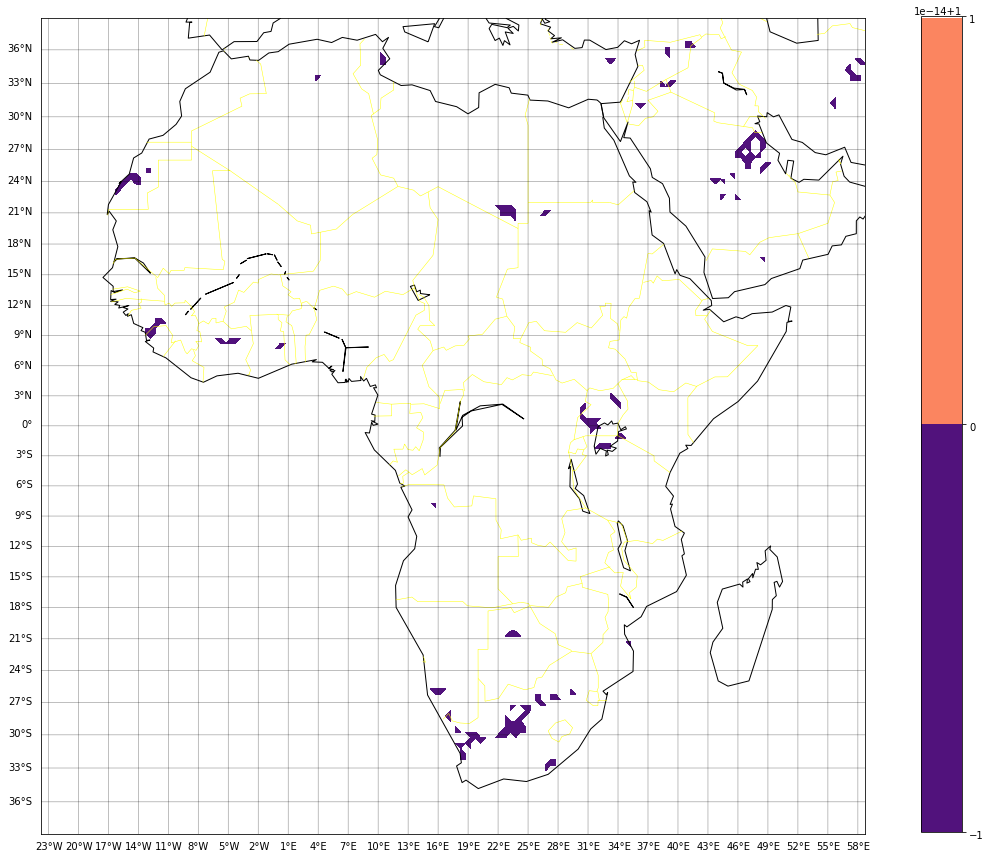

In [144]:
m=Basemap(projection='mill',lat_ts=50,llcrnrlon=lon.min(), \
  urcrnrlon=lon.max(),llcrnrlat=lat.min(),urcrnrlat=lat.max(), \
  resolution='c')
#m = Basemap(projection='ortho',lat_0=0,lon_0=-180,resolution='l')

lon2, lat2 = np.meshgrid(lon,lat)
x, y = m(lon2, lat2)
fig = plt.figure(figsize=(20,15))
#m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries(color='yellow')
cs = m.contourf(x,y,deg,20,cmap=plt.cm.get_cmap('magma'))
plt.colorbar();
#plt.title(' EOF {}'.format(pc), fontsize = 20)
#plt.savefig("Dynamics of Climate Classes Centroids Kmean.png")

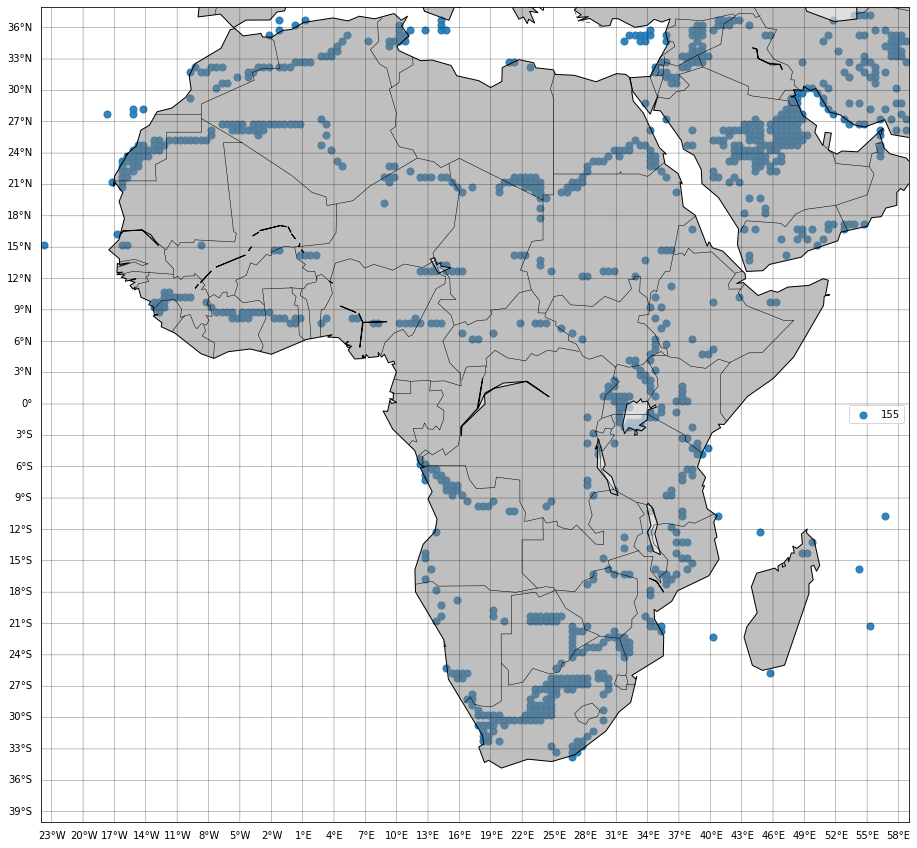

In [166]:
fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


values = df["clusters"].values  
Idx = np.where(values == 1)[0]
#df_list[i] = df.iloc[Idx,:]
#df_list[i]["values"] = values[Idx]

lons = df.iloc[Idx,0].values
lats = df.iloc[Idx,1].values
x,y = m(lons, lats)
ax.scatter(x, y, alpha=0.9, s=50, label = i)

    
#plt.title("Clustering, {} - {}".format(start_year, end_year), fontsize = 20)     
plt.legend()
plt.savefig("start end diff.png")
plt.show()

In [151]:
np.where(diff == 1)

(array([   29,    45,    55,    59,    60,    86,    88,    89,   119,
          120,   121,   122,   148,   149,   151,   152,   183,   184,
          185,   189,   219,   220,   231,   232,   262,   263,   272,
          273,   274,   304,   305,   316,   317,   318,   319,   362,
          363,   392,   406,   436,   452,   499,   529,   549,   579,
          587,   592,   647,   694,   707,   726,   757,   770,   789,
          823,   853,   896,   916,   960,   980,  1024,  1048,  1049,
         1085,  1116,  1153,  1162,  1184,  1185,  1221,  1250,  1251,
         1296,  1297,  1317,  1353,  1417,  1419,  1430,  1450,  1517,
         1583,  1705,  1706,  1716,  1764,  1780,  1829,  1843,  1844,
         1893,  1900,  1907,  2025,  2082,  2191,  2208,  2314,  2332,
         2333,  2395,  2436,  2460,  2526,  2538,  2605,  2794,  2806,
         3048,  3049,  3074,  3185,  3239,  3240,  3241,  3242,  3268,
         3321,  3322,  3351,  3380,  3406,  3441,  3505,  3506,  3560,
      

In [154]:
all_clusters[:,29]

array([2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
      dtype=int32)

In [115]:
cluster_diff = np.array(all_clusters)

In [116]:
np.save("cluster_diff_Kmean_centriod.npy",cluster_diff)

In [157]:
cluster_diff = np.load("cluster_diff_Kmean_centriod.npy")

In [130]:
cluster_diff

array([[0, 1, 0, ..., 5, 5, 5],
       [0, 1, 0, ..., 5, 5, 5],
       [0, 0, 0, ..., 5, 5, 5],
       ...,
       [0, 0, 0, ..., 5, 5, 5],
       [0, 0, 0, ..., 5, 5, 5],
       [0, 0, 0, ..., 5, 5, 5]], dtype=int32)

In [68]:
cluster_diff[:,9828]

array(['B', 'C', 'E', 'E', 'E', 'F', 'E', 'B', 'E', 'C', 'C', 'F', 'B',
       'E', 'B', 'C', 'E', 'B', 'E'], dtype='<U1')

In [67]:
np.argmax(diff)

9828

In [69]:
df.iloc[9828,:]

lons        36.75
lats         1.75
clusters    15.00
Name: 9828, dtype: float64

In [300]:
clustering.cluster_centers_

array([[0.13480679, 0.10027472, 0.11634947, 0.12054323, 0.09965136,
        0.07587342, 0.11730863, 0.11953707, 0.11078057, 0.08407677,
        0.10044645, 0.12165816, 1.965586  , 2.29121118, 2.83728258,
        3.4771448 , 4.1144014 , 4.5842409 , 4.74080736, 4.70518593,
        4.34810444, 3.68104568, 2.82758349, 2.14483947],
       [0.04976727, 0.06010671, 0.15923795, 0.45991518, 1.06041332,
        1.80306817, 2.60107587, 3.13867521, 2.28124506, 0.96469041,
        0.18233156, 0.05742334, 3.83836461, 4.15428854, 4.50582916,
        4.70429298, 4.65479318, 4.41457988, 4.21137828, 4.09774831,
        4.18588859, 4.2795537 , 4.12253459, 3.87693644],
       [0.09964667, 0.13428353, 0.2795019 , 0.64602299, 1.29359666,
        1.91468941, 2.14973733, 2.04195684, 1.84635558, 0.99947888,
        0.35738477, 0.11696745, 2.75926789, 3.02378426, 3.39729612,
        3.6432135 , 3.65835188, 3.61391225, 3.5928361 , 3.57074764,
        3.52761268, 3.37994575, 3.07859061, 2.81815892],
       [0.040

In [257]:
initial.iloc[:,:12].mean(1)

0    138.330642
1     74.221194
2     12.893839
3     36.839663
4      7.904618
5     86.234514
dtype: float64

In [258]:
initial.iloc[:,12:].mean(1)

0    24.803353
1    21.342719
2    26.537742
3    15.156445
4    21.248661
5    26.414446
dtype: float64

In [172]:
all_clusters

[array(['B', 'B', 'B', ..., 'D', 'D', 'D'], dtype='<U1'),
 array(['B', 'B', 'B', ..., 'D', 'D', 'D'], dtype='<U1'),
 array(['F', 'F', 'F', ..., 'D', 'D', 'D'], dtype='<U1'),
 array(['C', 'C', 'C', ..., 'D', 'D', 'D'], dtype='<U1'),
 array(['A', 'A', 'A', ..., 'B', 'B', 'B'], dtype='<U1'),
 array(['B', 'B', 'B', ..., 'C', 'C', 'C'], dtype='<U1'),
 array(['E', 'E', 'E', ..., 'C', 'C', 'C'], dtype='<U1'),
 array(['B', 'B', 'B', ..., 'D', 'D', 'D'], dtype='<U1'),
 array(['B', 'B', 'B', ..., 'C', 'C', 'C'], dtype='<U1'),
 array(['B', 'B', 'B', ..., 'E', 'E', 'E'], dtype='<U1'),
 array(['D', 'D', 'D', ..., 'E', 'E', 'E'], dtype='<U1'),
 array(['F', 'F', 'F', ..., 'B', 'B', 'B'], dtype='<U1'),
 array(['D', 'D', 'D', ..., 'C', 'C', 'C'], dtype='<U1'),
 array(['B', 'B', 'B', ..., 'C', 'C', 'C'], dtype='<U1'),
 array(['E', 'E', 'E', ..., 'B', 'B', 'B'], dtype='<U1'),
 array(['E', 'E', 'E', ..., 'B', 'B', 'B'], dtype='<U1'),
 array(['F', 'F', 'F', ..., 'C', 'C', 'C'], dtype='<U1'),
 array(['B', '

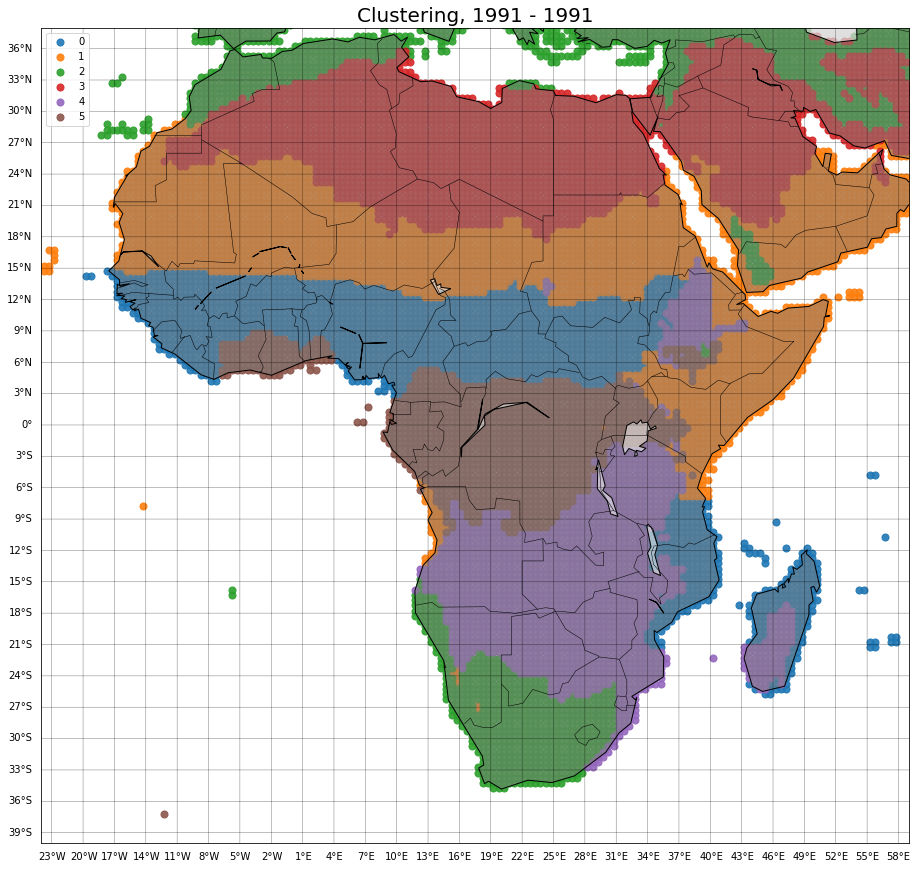

In [170]:
df_list = []
for j in range(len(set(clustering.labels_))):
    df_list.append(pd.DataFrame(columns=df.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
plt.title("Clustering, {} - {}".format(start_year[xyz], start_year[xyz]), fontsize = 20)     
plt.legend()
#plt.savefig("Clustering_anomaly.png")
plt.show()

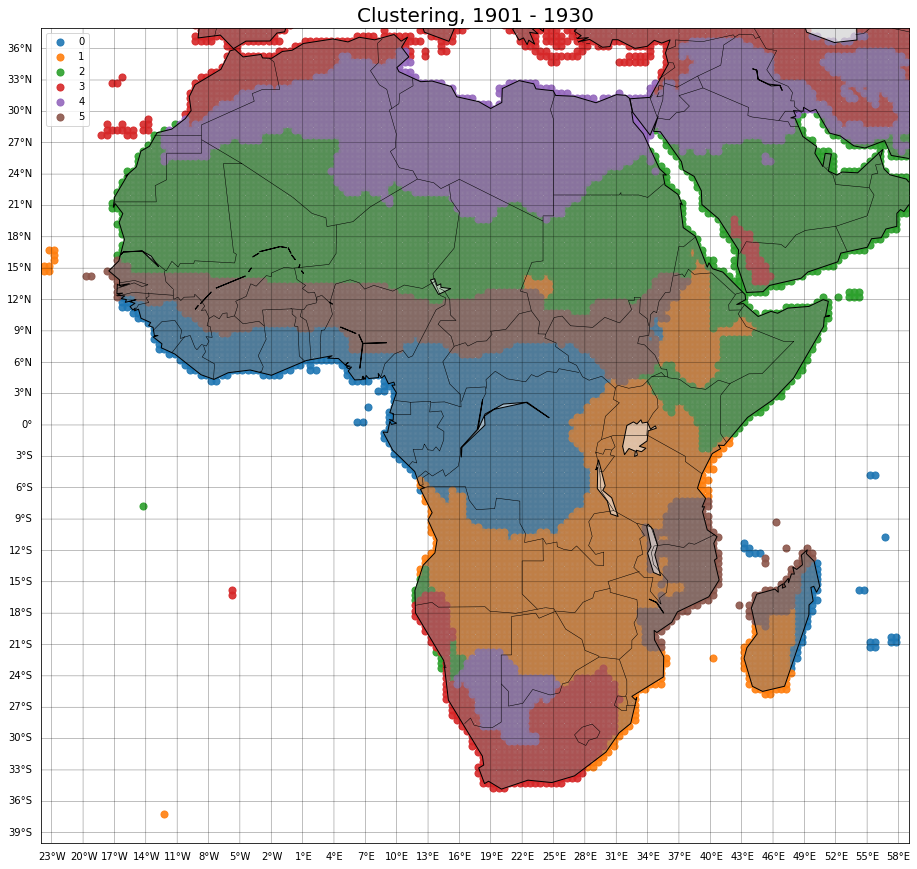

In [33]:
df_list = []
for j in range(len(set(clustering.labels_))):
    df_list.append(pd.DataFrame(columns=df.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
plt.title("Clustering, {} - {}".format(start_year[xyz], end_yearstart_year[xyz]), fontsize = 20)     
plt.legend()
#plt.savefig("Clustering_anomaly.png")
plt.show()

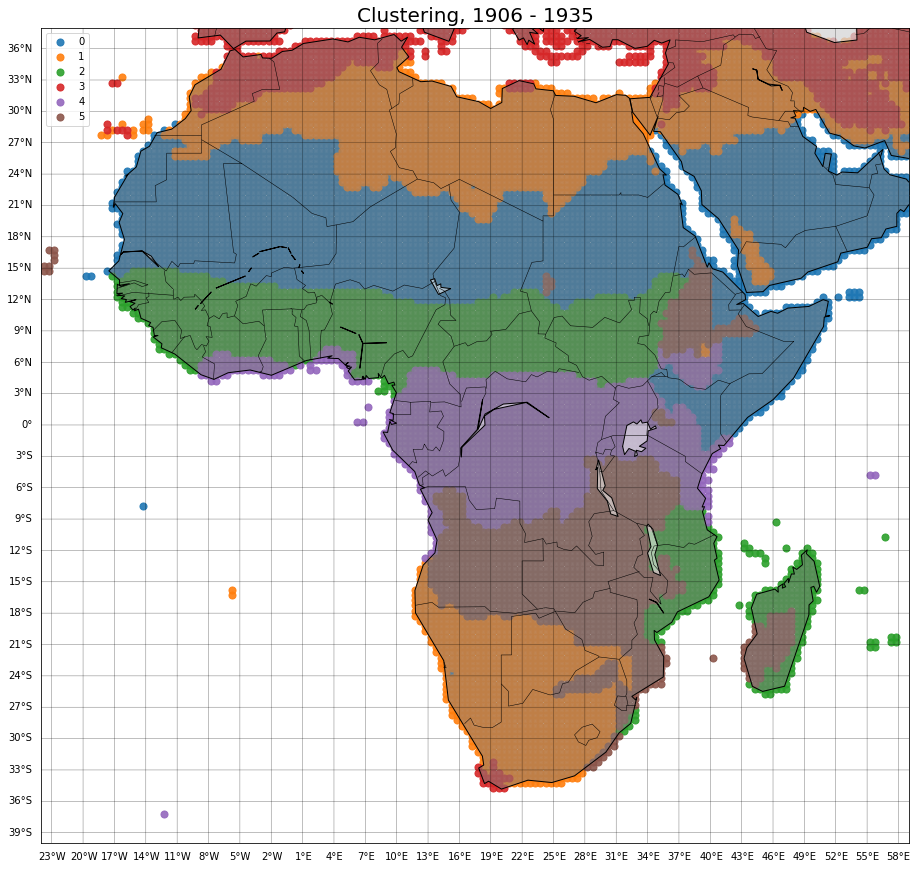

In [42]:
df_list = []
for j in range(len(set(clustering.labels_))):
    df_list.append(pd.DataFrame(columns=df.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
plt.title("Clustering, {} - {}".format(start_year, end_year), fontsize = 20)     
plt.legend()
#plt.savefig("Clustering_anomaly.png")
plt.show()

In [ ]:
code = dict()
for i in range(n_components): 
    code[i] = np.argmax(similarity[i,:])

In [32]:
precipitation = result.copy()
temperature = result_air.copy()


_, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
_, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)


avgs_pre = pd.DataFrame(avgs_pre)
avgs_temp = pd.DataFrame(avgs_temp)

data = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)
data = data.transpose()

In [33]:
mean_pre = np.zeros((n_components,12))
mean_temp = np.zeros((n_components,12))

for i in range(n_components):
    Index = (df["clusters"] == i).values
    mean_pre[i,] = data.iloc[Index,:].mean().values[:12]
    mean_temp[i,] = data.iloc[Index,:].mean().values[12:]

KeyError: 'clusters'

In [ ]:
new = pd.concat([pd.DataFrame(mean_pre), pd.DataFrame(mean_temp)], axis=1)

In [ ]:
distance = pairwise_distances(new, initial)

index = []
for i in range(n_components):
    index.append(np.argmin(distance[i,:]))

In [209]:
index

array([  107,   108,   263, ..., 25893, 25894, 25895])

In [212]:
initial = pd.concat([pd.DataFrame(mean_pre), pd.DataFrame(mean_temp)], axis=1).copy()

In [253]:
initial.iloc[:,:12]

,0,1,2,3,4,5,6,7,8,9,10,11
0,88.108202,96.152308,138.989346,156.737423,151.824792,134.465039,125.887922,148.015072,182.831884,193.025304,142.133175,101.797236
1,130.258148,123.367267,121.011037,83.128416,44.713144,25.583558,32.567571,36.259597,35.208290,48.453153,86.677491,123.426656
2,3.314296,3.849334,6.658978,14.042518,12.370164,10.452343,27.280110,39.462911,16.478064,8.888227,7.595344,4.333773
3,59.722212,57.066638,56.918231,40.564330,29.204478,15.129368,8.608237,9.415105,18.327590,35.994896,51.314416,59.810455
4,16.641850,13.739460,14.167307,9.658576,5.095240,1.402404,1.147252,1.633959,2.270912,5.495257,9.860812,13.742385
5,59.388882,60.721212,64.849827,64.466859,79.504953,103.171986,149.958925,183.221611,135.016141,59.665976,26.289525,48.558272


In [438]:
pred_code = np.searchsorted(np.sort(old.iloc[:,:12].mean(1).values), old.iloc[:,:12].mean(1).values)

In [439]:
temp_code = np.searchsorted(np.sort(old.iloc[:,12:].mean(1).values), old.iloc[:,12:].mean(1).values)

In [442]:
code_dict = dict()
for i in range(n_components):
    code_dict[i] = str(pred_code[i])+str(temp_code[i])

In [462]:
code_dict

{0: '04', 1: '10', 2: '45', 3: '22', 4: '53', 5: '31'}

In [460]:
clustering_code = np.empty(df.shape[0], dtype = "<U2")
for i in range(n_components):
    Index = (df["clusters"] == i).values
    clustering_code[Index] = code_dict[i]

In [463]:
clustering_code

array(['10', '10', '10', ..., '22', '22', '22'], dtype='<U2')

In [452]:
code_dict[0]

'04'

In [432]:
np.argsort(old.iloc[:,12:].mean(1).values)

array([1, 5, 3, 4, 0, 2])

In [435]:
old.iloc[:,:12].mean(1).values

array([ 13.10792571,  14.55989371, 106.36360781,  34.39400894,
       119.8743803 ,  78.02659429])

In [436]:
old.iloc[:,12:].mean(1).values

array([25.87630289, 16.68668061, 26.32022154, 23.77603952, 24.38302347,
       22.41410743])

In [ ]:
new = pd.concat([pd.DataFrame(mean_pre), pd.DataFrame(mean_air)], axis=1)
new.index = list(np.arange(6,12))

old = pd.concat([pd.DataFrame(mean_pre), pd.DataFrame(mean_air)], axis=1)





In [193]:
r = pairwise_distances(new, initial)

In [210]:
index = []
for i in range(n_components):
    index.append(np.argmin(r[i,:]))

In [211]:
index

[2, 4, 5, 3, 0, 1]

In [197]:
letters[2]

'C'

In [ ]:
new = pd.concat([pd.DataFrame(mean_pre), pd.DataFrame(mean_air)], axis=1)
new.index = list(np.arange(6,12))

old = pd.concat([pd.DataFrame(mean_pre), pd.DataFrame(mean_air)], axis=1)

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import pairwise_distances

r = pairwise_distances(new, old)

In [339]:
d = Data('./nc/cru_ts4.05.1901.2020.tmn.dat.nc','tmn',temporal_limits,spatial_limits, missing_value=9.96921e+36)

result_tmn = d.get_data()
lon_list_tmn = d.get_lon_list()
lat_list_tmn = d.get_lat_list()
lon_tmn = d.get_lon()
lat_tmn = d.get_lat()

index = np.where(result_tmn[0,:] != 9.96921e+36)[1]

result_tmn = result_tmn[:,index]
lon_list_tmn = np.array(lon_list_tmn)[index]
lat_list_tmn = np.array(lat_list_tmn)[index]

In [340]:
d = Data('./nc/cru_ts4.05.1901.2020.tmx.dat.nc','tmx',temporal_limits,spatial_limits, missing_value=9.96921e+36)

result_tmx = d.get_data()
lon_list_tmx = d.get_lon_list()
lat_list_tmx = d.get_lat_list()
lon_tmx = d.get_lon()
lat_tmx = d.get_lat()

index = np.where(result_tmx[0,:] != 9.96921e+36)[1]

result_tmx = result_tmx[:,index]
lon_list_tmx = np.array(lon_list_tmx)[index]
lat_list_tmx = np.array(lat_list_tmx)[index]

In [341]:
result_d = result_tmx - result_tmn

In [404]:
pre_list = list(zip(lon_list,lat_list))
air_list = list(zip(lon_list_air,lat_list_air))
tmn_list = list(zip(lon_list_tmn,lat_list_tmn))
tmx_list = list(zip(lon_list_tmx,lat_list_tmx))

# Other data

In [150]:
start_year = 1948
end_year = 1977
n_components = 6
#level = 4
temporal_limits = {"time_min":datetime(start_year, 1, 1, 0, 0),"time_max":datetime(end_year, 12, 1, 0, 0)}
spatial_limits = {"lon_min":-40,"lon_max":60,"lat_min":-40,"lat_max":40}

In [151]:
d = Data('./nc/GPCC_half.nc','precip',temporal_limits, missing_value=-9.969209968386869e+36)

result = d.get_data()
lon_list = d.get_lon_list()
lat_list = d.get_lat_list()
lon = d.get_lon()
lat = d.get_lat()

d = Data('./nc/air_monthly_mean_africa_half.nc','air', temporal_limits, missing_value=-9.96921e+36)

result_air = d.get_data()
lon_list_air = d.get_lon_list()
lat_list_air = d.get_lat_list()
lon_air = d.get_lon()
lat_air = d.get_lat()

In [ ]:
air_list = list(zip(lon_list_air,lat_list_air))
pre_list = list(zip(lon_list,lat_list))

In [153]:
diff = set(pre_list) - set(air_list)

diff_index = [i for i, e in enumerate(pre_list) if e in diff]
diff_index = np.array(diff_index)

index = list(set(np.arange(len(pre_list))) - set(diff_index))

lon_list = np.array(lon_list)
lat_list = np.array(lat_list)


result = result[:,index]
lon_list = lon_list[index]
lat_list = lat_list[index]

air_list = list(zip(lon_list_air,lat_list_air))
pre_list = list(zip(lon_list,lat_list))

diff = set(air_list) - set(pre_list)

diff_index = [i for i, e in enumerate(air_list) if e in diff]
diff_index = np.array(diff_index)

index = list(set(np.arange(len(air_list))) - set(diff_index))

lon_list_air = np.array(lon_list_air)
lat_list_air = np.array(lat_list_air)


result_air = result_air[:,index]
lon_list_air = lon_list_air[index]
lat_list_air = lat_list_air[index]


air_list = list(zip(lon_list_air,lat_list_air))
pre_list = list(zip(lon_list,lat_list))

air_list = np.array(air_list)
pre_list = np.array(pre_list)

# precipitation only:

In [98]:
precipitation = result.copy()
precipitation = precipitation/precipitation.std()
precipitation = pd.DataFrame(precipitation)

In [ ]:
clustering = AgglomerativeClustering(n_clusters=n_components).fit(precipitation.transpose())

In [110]:
precipitation = result.copy()
precipitation = precipitation/precipitation.std()

precipitation, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)

avgs_pre = pd.DataFrame(avgs_pre)

df = pd.DataFrame({"lons":lon_list,"lats":lat_list})

lon_temp = df["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df["lons"] = lon_temp

In [111]:
s_index = (df["lats"] <= 0).values
n_index = (df["lats"] > 0).values

avgs_pre = southern_season(avgs_pre,s_index)

In [115]:
clustering = AgglomerativeClustering(n_clusters=n_components).fit(avgs_pre)

# Both:

In [344]:
precipitation = result.copy()
temperature = result_air.copy()

precipitation = precipitation/precipitation.std()
temperature = temperature/temperature.std()

precipitation, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
temperature, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)

avgs_pre = pd.DataFrame(avgs_pre)
avgs_temp = pd.DataFrame(avgs_temp)
stds_pre = pd.DataFrame(stds_pre)
stds_temp = pd.DataFrame(stds_temp)

df = pd.DataFrame({"lons":lon_list,"lats":lat_list})

lon_temp = df["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df["lons"] = lon_temp

In [345]:
s_index = (df["lats"] <= 0).values
n_index = (df["lats"] > 0).values

In [346]:
avgs_pre = southern_season(avgs_pre,s_index)
avgs_temp = southern_season(avgs_temp,s_index)

In [157]:
stds_pre = southern_season(stds_pre,s_index)
stds_temp = southern_season(stds_temp,s_index)

In [347]:
combined_vertically = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)

In [130]:
combined_vertically = pd.concat([avgs_pre.transpose(),avgs_temp.transpose(),stds_pre.transpose(),stds_temp.transpose()],ignore_index=True,sort=False, axis=0)

In [348]:
clustering = AgglomerativeClustering(n_clusters=n_components).fit(combined_vertically.transpose())

# Both tmn and tmx

In [218]:
precipitation = result.copy()
tmn = result_tmn.copy()
tmx = result_tmx.copy()

precipitation = precipitation/precipitation.std()
tmn = tmn/tmn.std()
tmx = tmx/tmx.std()

precipitation, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
tmn, avgs_tmn, stds_tmn = deseasonalize_avg_std(tmn)
tmx, avgs_tmx, stds_tmx = deseasonalize_avg_std(tmx)

avgs_pre = pd.DataFrame(avgs_pre)
avgs_tmn = pd.DataFrame(avgs_tmn)
avgs_tmx = pd.DataFrame(avgs_tmx)

df = pd.DataFrame({"lons":lon_list,"lats":lat_list})

lon_temp = df["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df["lons"] = lon_temp

s_index = (df["lats"] <= 0).values
n_index = (df["lats"] > 0).values

avgs_pre = southern_season(avgs_pre,s_index)
avgs_tmn = southern_season(avgs_tmn,s_index)
avgs_tmx = southern_season(avgs_tmx,s_index)

combined_vertically = pd.concat([avgs_pre.transpose(),avgs_tmn.transpose(),avgs_tmx.transpose()],ignore_index=True,sort=False, axis=0)

In [268]:
precipitation = result.copy()
d = result_d.copy()
air = result_air.copy()

precipitation = precipitation/precipitation.std()
d = d/d.std()
air = air/air.std()

precipitation, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
d, avgs_d, stds_d = deseasonalize_avg_std(d)
air, avgs_air, stds_air = deseasonalize_avg_std(air)

avgs_pre = pd.DataFrame(avgs_pre)
avgs_d = pd.DataFrame(avgs_d)
avgs_air = pd.DataFrame(avgs_air)

df = pd.DataFrame({"lons":lon_list,"lats":lat_list})

lon_temp = df["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df["lons"] = lon_temp

s_index = (df["lats"] <= 0).values
n_index = (df["lats"] > 0).values

avgs_pre = southern_season(avgs_pre,s_index)
avgs_d = southern_season(avgs_d,s_index)
avgs_air = southern_season(avgs_air,s_index)

combined_vertically = pd.concat([avgs_pre.transpose(),avgs_air.transpose(),avgs_d.transpose()],ignore_index=True,sort=False, axis=0)

In [269]:
clustering = AgglomerativeClustering(n_clusters=n_components).fit(combined_vertically.transpose())

In [ ]:
precipitation = result.copy()
temperature = result_air.copy()
#temperature = temperature-273.15
#index = temperature<-100
#temperature[index] = np.NAN

_, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
_, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)


avgs_pre = pd.DataFrame(avgs_pre)
avgs_temp = pd.DataFrame(avgs_temp)
stds_pre = pd.DataFrame(stds_pre)
stds_temp = pd.DataFrame(stds_temp)

data = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)
data = data.transpose()

mean_pre = np.zeros((n_components,12))
mean_temp = np.zeros((n_components,12))
#std_pre = np.zeros((n_components,12))
#std_temp = np.zeros((n_components,12))
for i in range(n_components):
    Index = (df["clusters"] == i).values
    mean_pre[i,] = data.iloc[Index,:].mean().values[:12]
    mean_temp[i,] = data.iloc[Index,:].mean().values[12:]
    #std_pre[i,] = data.iloc[Index,:].mean().values[24:36]
    #std_temp[i,] = data.iloc[Index,:].mean().values[36:]

In [185]:
df

,lons,lats,clusters
0,-23.75,14.75,14.0
1,-23.75,15.25,14.0
2,-23.25,14.75,14.0
3,-23.25,15.25,14.0
4,-23.25,16.75,14.0
...,...,...,...
12947,58.75,36.75,11.0
12948,58.75,37.25,11.0
12949,58.75,37.75,11.0
12950,58.75,38.25,11.0


In [187]:
deg = np.zeros((len(lat),len(lon)))

lat_number = deg.shape[0]
lon_number = deg.shape[1]

for i in range(lat_number):
    for j in range(lon_number):
        if not df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values.size == 0:
            deg[i,j] = df[(df.lats == lat[i]) & (df.lons == lon[j])].clusters.values
        else:
            deg[i,j]=np.nan


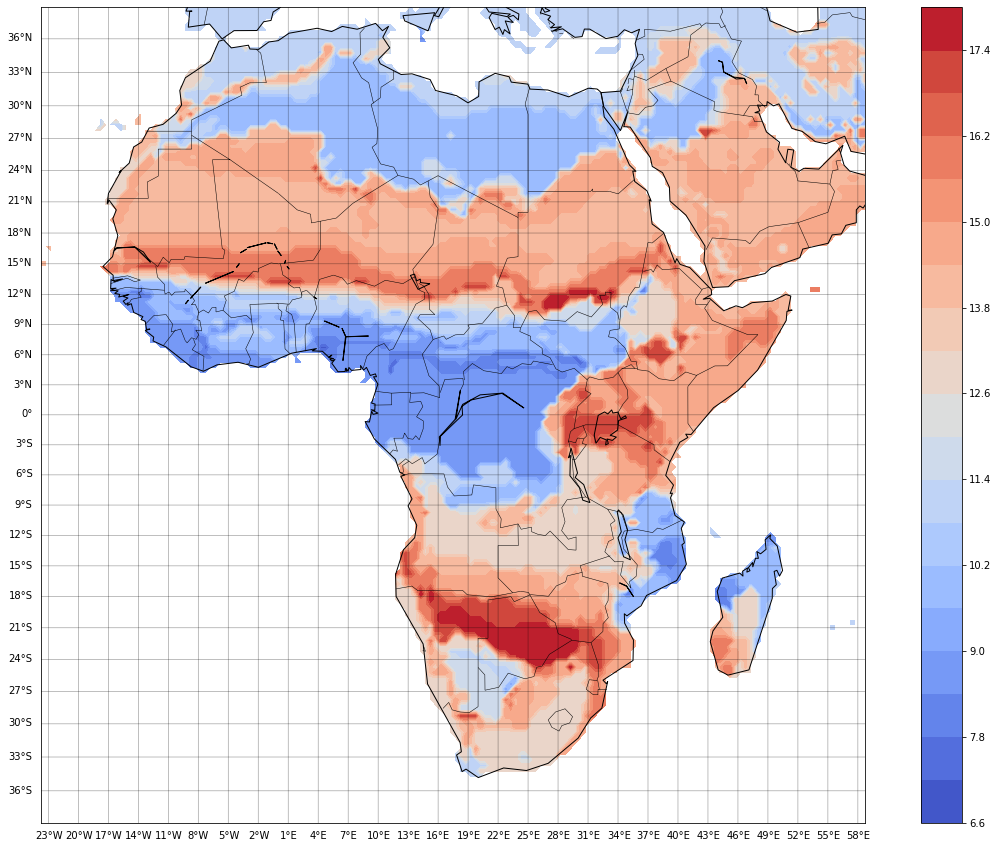

In [190]:

m=Basemap(projection='mill',lat_ts=50,llcrnrlon=lon.min(), \
  urcrnrlon=lon.max(),llcrnrlat=lat.min(),urcrnrlat=lat.max(), \
  resolution='c')
#m = Basemap(projection='ortho',lat_0=0,lon_0=-180,resolution='l')

lon2, lat2 = np.meshgrid(lon,lat)
x, y = m(lon2, lat2)
fig = plt.figure(figsize=(20,15))
#m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
cs = m.contourf(x,y,deg,20,cmap=plt.cm.get_cmap('coolwarm'))
plt.colorbar();
#plt.title(' EOF {}'.format(pc), fontsize = 20)

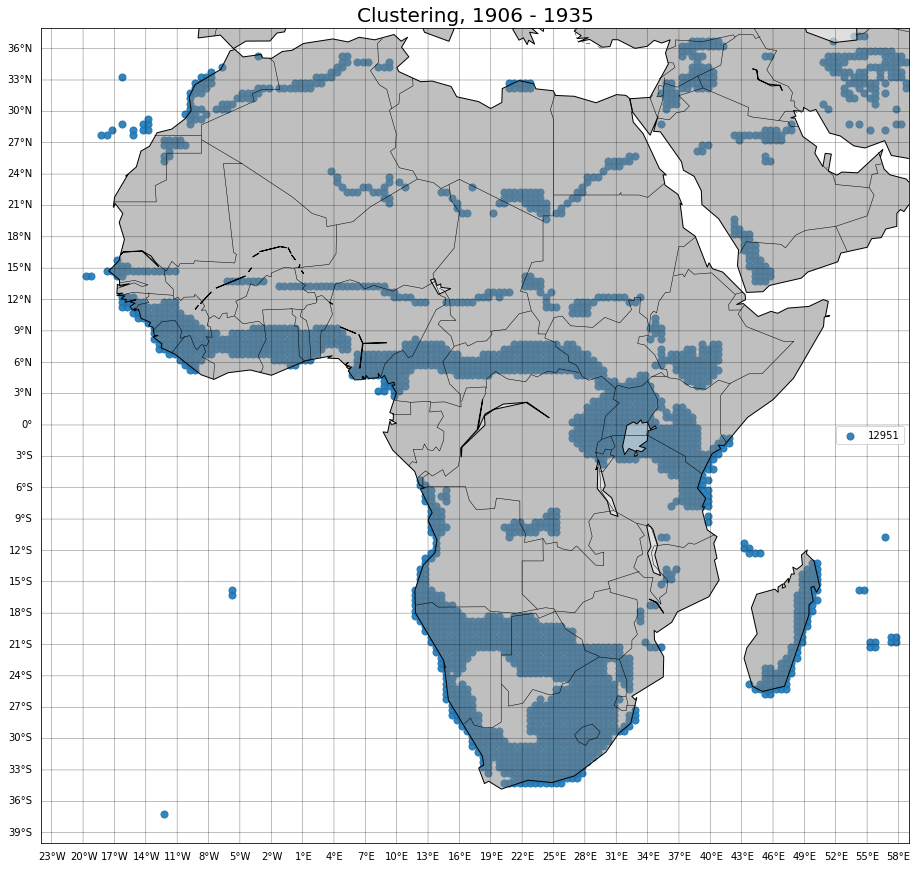

In [92]:
fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


values = df["clusters"].values  
Idx = np.where(values == 1)[0]
#df_list[i] = df.iloc[Idx,:]
#df_list[i]["values"] = values[Idx]

lons = df.iloc[Idx,0].values
lats = df.iloc[Idx,1].values
x,y = m(lons, lats)
ax.scatter(x, y, alpha=0.9, s=50, label = i)

    
#plt.title("Clustering, {} - {}".format(start_year, end_year), fontsize = 20)     
plt.legend()
#plt.savefig("Clustering_anomaly.png")
plt.show()


x,y = m(lons, lats)
ax.scatter(x, y, alpha=0.9, s=50)

In [349]:
df["clusters"]=clustering.labels_

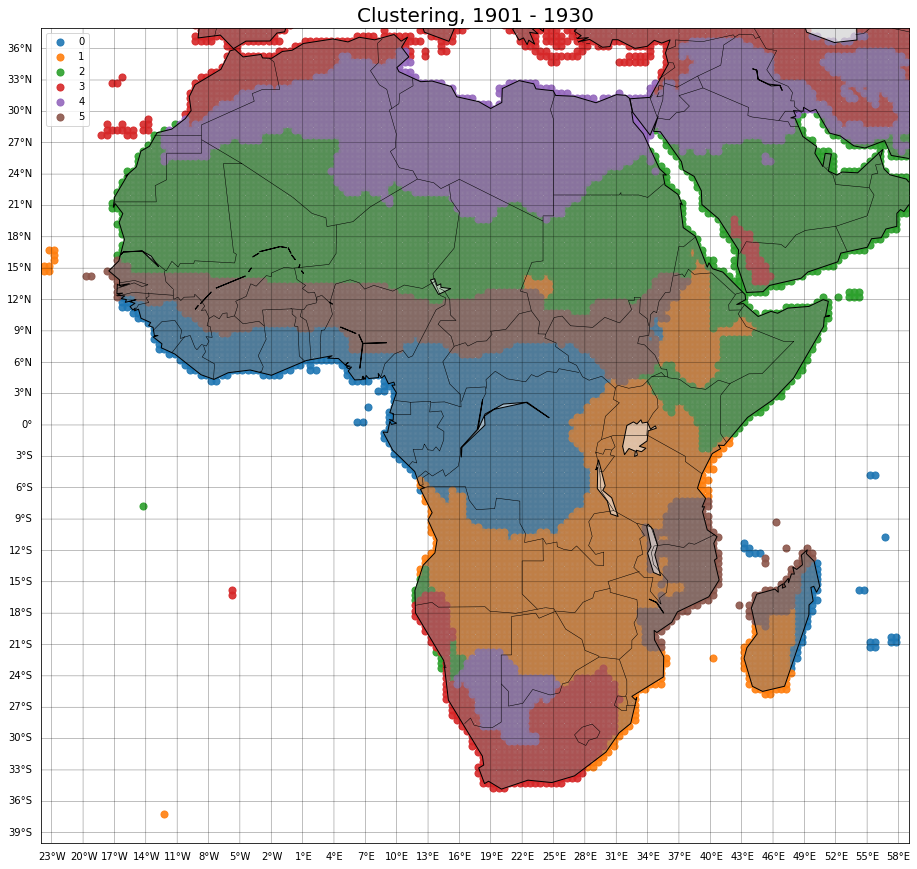

In [326]:
df_list = []
for j in range(len(set(clustering.labels_))):
    df_list.append(pd.DataFrame(columns=df.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
plt.title("Clustering, {} - {}".format(start_year, end_year), fontsize = 20)     
plt.legend()
#plt.savefig("Clustering_anomaly.png")
plt.show()

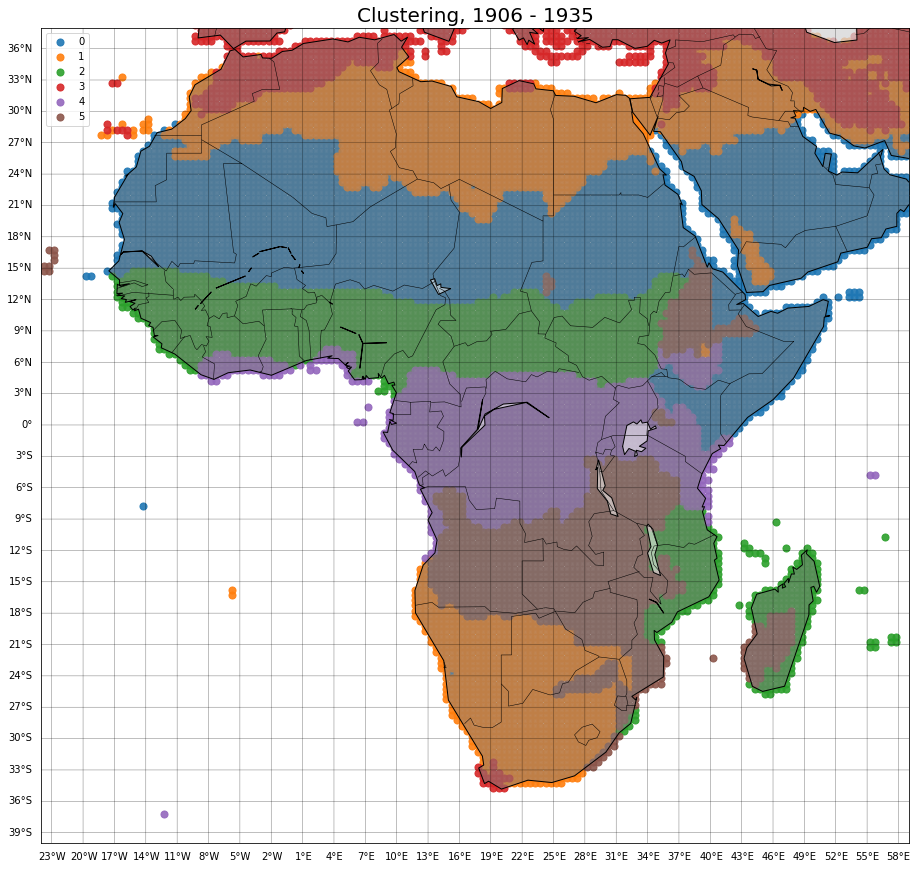

In [350]:
df_list = []
for j in range(len(set(clustering.labels_))):
    df_list.append(pd.DataFrame(columns=df.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
plt.title("Clustering, {} - {}".format(start_year, end_year), fontsize = 20)    
plt.legend()
#plt.savefig("Clustering_anomaly.png")
plt.show()

In [69]:
def southern_season(data,s_index,n):
    data = pd.DataFrame(data)
    n_index = ~s_index
    data_south = pd.concat([data.iloc[s_index,n:].transpose(),data.iloc[s_index,:n].transpose()],ignore_index=True,sort=False, axis=0)
    data_north = data.iloc[n_index,:]
    data_south = data_south.transpose()
    d = pd.concat([data_north,data_south],ignore_index=False,sort=False, axis=1)
    d.iloc[s_index,:n*2] = d.iloc[s_index,n*2:]
    d.columns = list(np.arange(n*4))
    d = d.drop(d.columns[list(np.arange(n*2,n*4))], axis = 1)
    return(d)

In [351]:
precipitation = result.copy()
temperature = result_air.copy()
#temperature = temperature-273.15
#index = temperature<-100
#temperature[index] = np.NAN

In [352]:
_, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
_, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)


avgs_pre = pd.DataFrame(avgs_pre)
avgs_temp = pd.DataFrame(avgs_temp)
stds_pre = pd.DataFrame(stds_pre)
stds_temp = pd.DataFrame(stds_temp)

data = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)
data = data.transpose()

In [353]:
mean_pre = np.zeros((n_components,12))
mean_temp = np.zeros((n_components,12))
#std_pre = np.zeros((n_components,12))
#std_temp = np.zeros((n_components,12))
for i in range(n_components):
    Index = (df["clusters"] == i).values
    mean_pre[i,] = data.iloc[Index,:].mean().values[:12]
    mean_temp[i,] = data.iloc[Index,:].mean().values[12:]
    #std_pre[i,] = data.iloc[Index,:].mean().values[24:36]
    #std_temp[i,] = data.iloc[Index,:].mean().values[36:]

In [334]:
pd.DataFrame(mean_pre)

,0,1,2,3,4,5,6,7,8,9,10,11
0,88.108202,96.152308,138.989346,156.737423,151.824792,134.465039,125.887922,148.015072,182.831884,193.025304,142.133175,101.797236
1,130.258148,123.367267,121.011037,83.128416,44.713144,25.583558,32.567571,36.259597,35.208290,48.453153,86.677491,123.426656
2,3.314296,3.849334,6.658978,14.042518,12.370164,10.452343,27.280110,39.462911,16.478064,8.888227,7.595344,4.333773
3,59.722212,57.066638,56.918231,40.564330,29.204478,15.129368,8.608237,9.415105,18.327590,35.994896,51.314416,59.810455
4,16.641850,13.739460,14.167307,9.658576,5.095240,1.402404,1.147252,1.633959,2.270912,5.495257,9.860812,13.742385
5,59.388882,60.721212,64.849827,64.466859,79.504953,103.171986,149.958925,183.221611,135.016141,59.665976,26.289525,48.558272


In [335]:
pd.DataFrame(mean_temp)

,0,1,2,3,4,5,6,7,8,9,10,11
0,24.894222,25.710692,25.990705,25.790703,25.251296,24.221900,23.518604,23.730358,24.325861,24.717048,24.859702,24.629141
1,22.862258,22.901183,22.690036,21.795249,20.019963,18.442017,17.839162,19.258724,21.499989,23.000722,23.034925,22.768403
2,19.790403,21.588812,24.530596,27.600940,30.223021,31.468699,30.976105,30.292177,29.808072,27.694005,23.867190,20.612884
3,9.973550,10.751031,12.511855,14.166877,16.127768,18.190547,20.194263,20.580465,18.984257,16.296975,13.215519,10.884229
4,12.203971,14.101600,17.193848,20.942239,24.783249,27.676797,28.825511,28.791328,26.708235,22.770337,17.582457,13.404364
5,25.175833,26.797540,28.478951,28.958489,27.989652,26.183741,24.920719,24.601698,25.517616,26.698016,26.373942,25.277150


In [370]:
new = pd.concat([pd.DataFrame(mean_pre), pd.DataFrame(mean_air)], axis=1)
new.index = list(np.arange(6,12))

In [336]:
old = pd.concat([pd.DataFrame(mean_pre), pd.DataFrame(mean_air)], axis=1)

In [357]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import pairwise_distances

In [397]:
r = pairwise_distances(new, old)

In [398]:
pd.DataFrame(r)

,0,1,2,3,4,5
0,73.309529,78.964240,72.511960,74.446556,74.044622,75.139679
1,45.132627,49.417776,43.771004,46.405969,46.076481,45.630183
2,74.870790,80.777819,74.656187,76.677435,76.389590,76.684760
3,65.814098,71.725761,65.229849,66.719052,66.349944,68.197490
4,67.568119,73.892049,67.674836,69.028364,68.791732,70.302943
5,65.382935,70.055113,64.738383,67.139693,66.958232,66.317589


In [364]:
pd.DataFrame(r)

,0,1,2,3,4,5
0,445.656895,271.272654,6.438408,130.967233,58.339194,281.736067
1,449.507108,231.640649,72.999613,91.239125,44.471388,308.174514
2,199.811965,326.863305,357.391788,344.339598,394.727046,87.156814
3,391.189196,161.800916,124.905759,11.612210,104.295047,283.547038
4,125.789009,232.090184,395.500676,308.462560,404.801047,274.819126
5,349.967770,65.865567,314.280991,197.744334,300.850787,316.915110


In [392]:
pd.DataFrame(q)

,0,1,2,3,4,5
0,0.888542,0.882413,0.997341,0.980513,0.991788,0.907211
1,0.864089,0.914315,0.979747,0.928705,0.936543,0.931453
2,0.914328,0.907918,0.999517,0.978381,0.983899,0.938916
3,0.889340,0.863738,0.985897,0.990489,0.999746,0.879786
4,0.915316,0.879457,0.984052,0.995385,0.997982,0.893887
5,0.881572,0.934223,0.979869,0.937144,0.937803,0.941077


In [399]:
index = []
for i in range(n_components):
    index.append(np.argmin(r[i,:]))

In [396]:
index

[2, 4, 5, 3, 0, 1]

In [400]:
index

[2, 2, 2, 2, 0, 2]

In [388]:
pre_new = new.iloc[:,:12].values

In [389]:
pre_new = pre_new/pre_new.std()

In [390]:
new = pd.concat([pd.DataFrame(pre_new), pd.DataFrame(temp_new)], axis=1)

In [169]:
pd.DataFrame(std_pre)

,0,1,2,3,4,5,6,7,8,9,10,11
0,60.614735,65.128547,68.715853,50.004012,45.778776,48.517833,62.454859,69.851891,54.216394,56.528477,54.511951,55.875568
1,37.066466,40.943414,50.773440,52.866728,46.944338,36.371185,38.522247,40.893444,50.875128,56.629301,51.785526,42.012823
2,40.566954,40.679930,41.955354,32.800079,27.243846,23.827873,31.351578,36.656749,31.340491,29.812168,29.848510,38.155070
3,28.296833,27.563025,26.194046,16.380704,13.939734,13.230224,20.990974,28.011808,18.844118,15.435960,15.795909,20.381715
4,39.488824,37.071363,42.656988,47.332133,37.874849,16.117543,12.391140,12.655819,20.200536,42.706216,55.017655,47.578636
5,10.157097,8.595904,9.787628,9.942556,7.685462,3.466032,3.946723,6.134735,5.581654,8.599204,10.270161,10.455209


In [170]:
pd.DataFrame(std_temp)

,0,1,2,3,4,5,6,7,8,9,10,11
0,0.540272,0.512396,0.485932,0.504741,0.537000,0.504865,0.540049,0.523601,0.468983,0.448696,0.452791,0.474844
1,0.525145,0.506787,0.489809,0.471984,0.430944,0.452128,0.488212,0.432076,0.427196,0.408272,0.408540,0.492571
2,0.730826,0.723341,0.634982,0.600477,0.656565,0.657426,0.636007,0.579275,0.601974,0.602104,0.671522,0.714641
3,1.025139,1.046421,0.964430,0.794444,0.668925,0.821079,0.806523,0.784872,0.785946,0.777228,0.846634,1.016466
4,1.145279,1.179673,0.972568,0.916835,0.884822,0.734282,0.700665,0.716979,0.793251,0.903278,0.929148,1.017651
5,1.292206,1.463878,1.285691,1.077500,1.028879,0.806571,0.782707,0.797448,0.899497,1.043566,1.120766,1.243692


In [171]:
for i in range(n_components):
    Index = (df["clusters"] == i).values
    PRE = data.iloc[Index,:].mean().values[:12].mean()
    TEMP = data.iloc[Index,:].mean().values[12:24].mean()
    PRE_std = data.iloc[Index,:].mean().values[24:36].mean()
    TEMP_std = data.iloc[Index,:].mean().values[36:].mean()
    print("PRE:{}  TEMP:{}  PRE_std:{}  TEMP_std:{}".format(PRE, TEMP, PRE_std, TEMP_std))

PRE:160.20509867028377  TEMP:23.0143583683611  PRE_std:57.683241403277236  TEMP_std:0.4995143571054073
PRE:129.08791527844133  TEMP:23.80272863667638  PRE_std:45.47367008747231  TEMP_std:0.46113865422280154
PRE:78.44162021884678  TEMP:24.171668213621157  PRE_std:33.68655012755911  TEMP_std:0.6507616078594014
PRE:29.820086186976514  TEMP:23.97277275788582  PRE_std:20.422087480685576  TEMP_std:0.8615088560736849
PRE:54.101414567060544  TEMP:20.19636405856701  PRE_std:34.25764185256022  TEMP_std:0.9078692921968714
PRE:7.607336559186042  TEMP:22.869324702550454  PRE_std:7.8851972139372  TEMP_std:1.0702001370871124


In [39]:
for i in range(n_components):
    Index = (df["clusters"] == i).values
    PRE = data.iloc[Index,:].mean().values[:12].mean()
    TEMP = data.iloc[Index,:].mean().values[12:].mean()
    print("PRE:{}  TEMP:{}".format(PRE, TEMP))

PRE:133.47699625167957  TEMP:24.607293007304353
PRE:48.454898774789136  TEMP:27.2824831835657
PRE:44.33680246206482  TEMP:19.255773211297903
PRE:128.2845526971577  TEMP:23.077657746124654
PRE:7.233993735296603  TEMP:23.288658321909733
PRE:92.84682736627299  TEMP:21.70003904704936


In [40]:
precipitation = result.copy()
temperature = result_air.copy()
temperature = temperature-273.15
index = temperature<-100
temperature[index] = np.NAN


for i in range(n_components):
    index = (df["clusters"] == i).values
    print("PRE:{}  TEMP:{}".format(precipitation[:,index].mean(), np.nanmean(temperature[:,index])))

PRE:133.4770050048828  TEMP:24.601654052734375
PRE:48.45490646362305  TEMP:27.282480239868164
PRE:44.33679962158203  TEMP:19.25577735900879
PRE:128.2845458984375  TEMP:23.07765769958496
PRE:7.233994960784912  TEMP:23.288650512695312
PRE:92.84683990478516  TEMP:21.700037002563477


In [272]:
precipitation = result.copy()
d = result_d.copy()
air = result_air.copy()

In [273]:
#temperature = temperature-273.15
#index = temperature<-100
#temperature[index] = np.NAN

_, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
_, avgs_d, stds_d = deseasonalize_avg_std(d)
_, avgs_air, stds_air = deseasonalize_avg_std(air)


avgs_pre = pd.DataFrame(avgs_pre)
avgs_air = pd.DataFrame(avgs_air)
avgs_d = pd.DataFrame(avgs_d)

In [274]:
data = pd.concat([avgs_pre.transpose(),avgs_air.transpose(),avgs_d.transpose()],ignore_index=True,sort=False, axis=0)
data = data.transpose()

In [275]:
mean_pre = np.zeros((n_components,12))
mean_air = np.zeros((n_components,12))
mean_d = np.zeros((n_components,12))
for i in range(n_components):
    Index = (df["clusters"] == i).values
    mean_pre[i,] = data.iloc[Index,:].mean().values[:12]
    mean_air[i,] = data.iloc[Index,:].mean().values[12:24]
    mean_d[i,] = data.iloc[Index,:].mean().values[24:36]

In [276]:
pd.DataFrame(mean_pre)

,0,1,2,3,4,5,6,7,8,9,10,11
0,22.651133,21.546705,16.021234,8.002591,7.572363,15.552145,37.832787,51.311551,25.798601,11.077689,11.933647,17.128331
1,47.721478,42.898709,42.578624,34.856258,24.583391,10.966735,7.861128,8.583768,13.651234,30.032692,42.511454,50.129268
2,7.215345,7.895421,14.610987,27.876265,18.986265,5.254860,9.345566,9.702376,6.475585,14.237546,14.559197,9.388630
3,78.697837,71.183835,85.556265,78.497682,75.450964,81.928013,111.191226,128.024689,112.269691,89.837682,68.597741,77.951849
4,126.614290,124.214758,148.699993,142.683058,115.564752,80.051270,74.238003,87.402281,106.857556,135.645246,128.796615,128.223684
5,11.708811,9.308382,11.709445,8.462065,4.843001,1.244685,0.966363,1.473068,1.849813,3.930618,7.095594,10.446719


In [277]:
pd.DataFrame(mean_air)

,0,1,2,3,4,5,6,7,8,9,10,11
0,21.406162,23.111551,25.495007,27.583375,28.459165,28.104732,27.192246,27.229118,27.918875,27.503236,24.565824,21.946341
1,8.924889,10.000424,12.473410,15.586609,18.793357,22.236335,24.466629,24.404740,21.809832,17.948783,13.474744,10.120414
2,20.971360,22.079170,24.083417,26.773040,29.030008,30.355764,30.185378,30.029982,29.315041,27.001894,24.144752,21.872854
3,23.637565,24.761199,25.580497,25.387762,24.070407,22.421843,21.669711,22.359328,23.473474,24.286317,24.158522,23.505850
4,25.136115,25.612192,25.729627,25.274798,24.393490,23.102821,22.400739,22.856317,23.695930,24.473349,24.963978,24.956925
5,11.556908,13.773630,17.423351,22.279445,27.034633,30.591052,31.853988,31.572525,28.783938,23.821992,17.494789,12.783038


In [278]:
pd.DataFrame(mean_d)

,0,1,2,3,4,5,6,7,8,9,10,11
0,15.755399,15.972603,16.089641,16.190328,16.134872,15.535978,14.773749,14.320516,14.748882,15.357320,15.686128,15.621814
1,9.767873,10.193299,10.812905,11.498660,12.263640,13.035635,13.114770,13.089412,12.929770,11.893726,10.600701,9.669787
2,11.207764,11.416586,11.649682,11.575451,11.724126,11.675532,10.860745,10.893482,11.529399,11.708757,11.428061,11.105647
3,14.051145,13.975798,13.261418,12.716946,12.949919,12.993824,12.439573,12.265561,12.639257,12.768420,13.661034,13.919931
4,10.116488,10.389808,10.154025,9.833115,9.857631,9.976433,9.738625,9.815710,10.213053,10.067866,9.926118,9.784954
5,13.130902,13.781106,14.325840,15.046447,15.507809,15.965440,15.508740,15.526857,15.423388,14.878031,13.812119,12.986238


In [ ]:
avgs_temp_south = pd.concat([avgs_temp.iloc[s_index,6:].transpose(),avgs_temp.iloc[s_index,:6].transpose()],ignore_index=True,sort=False, axis=0)
avgs_temp_north = avgs_temp.iloc[n_index,:]
avgs_temp_south = avgs_temp_south.transpose()
d = pd.concat([avgs_temp_north,avgs_temp_south],ignore_index=False,sort=False, axis=1)
d.iloc[s_index,:12] = d.iloc[s_index,12:]
d.columns = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,22, 23]
d = d.drop(d.columns[[12, 13, 14, 15, 16 ,17, 18, 19, 20, 21, 22, 23]], axis = 1)

avgs_temp_north = avgs_temp.iloc[n_index,:]

avgs_temp_south = avgs_temp_south.transpose()

d = pd.concat([avgs_temp_north,avgs_temp_south],ignore_index=False,sort=False, axis=1)

d.iloc[s_index,:12] = d.iloc[s_index,12:]

d.columns = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,22, 23]
d = d.drop(d.columns[[12, 13, 14, 15, 16 ,17, 18, 19, 20, 21, 22, 23]], axis = 1)

In [350]:
n_components = 15
level = 12
temporal_limits = {"time_min":datetime(1948, 1, 1, 0, 0),"time_max":datetime(2016, 12, 1, 0, 0) } 
spatial_limits = {"lon_min":-40,"lon_max":60,"lat_min":-40,"lat_max":40}

In [5]:
d = Data('GPCC_half.nc','precip',temporal_limits, missing_value=-9.969209968386869e+36)

result = d.get_data()
lon_list = d.get_lon_list()
lat_list = d.get_lat_list()
lon = d.get_lon()
lat = d.get_lat()

In [10]:
d = Data('air_daily_africa.nc','air', missing_value=-9.96921e+36)

result_air = d.get_data()
lon_list_air = d.get_lon_list()
lat_list_air = d.get_lat_list()
lon_air = d.get_lon()
lat_air = d.get_lat()

In [6]:
d = Data('air_monthly_mean_africa.nc','air', missing_value=-9.96921e+36)

result_air = d.get_data()
lon_list_air = d.get_lon_list()
lat_list_air = d.get_lat_list()
lon_air = d.get_lon()
lat_air = d.get_lat()

# Raw Data using matrix norm:

In [8]:
#d = Dataset("./nc/cru_ts4.05.1901.2020.pre.dat.nc")

In [9]:
#d.variables

In [240]:
start_year = 1948
end_year = 1977
n_components = 6
#level = 4
temporal_limits = {"time_min":datetime(start_year, 1, 1, 0, 0),"time_max":datetime(end_year, 12, 1, 0, 0)}
spatial_limits = {"lon_min":-40,"lon_max":60,"lat_min":-40,"lat_max":40}

In [241]:
d = Data('./nc/GPCC_half.nc','precip',temporal_limits, missing_value=-9.969209968386869e+36)

result = d.get_data()
lon_list = d.get_lon_list()
lat_list = d.get_lat_list()
lon = d.get_lon()
lat = d.get_lat()

In [242]:
d = Data('./nc/air_monthly_mean_africa_half.nc','air', temporal_limits, missing_value=-9.96921e+36)

result_air = d.get_data()
lon_list_air = d.get_lon_list()
lat_list_air = d.get_lat_list()
lon_air = d.get_lon()
lat_air = d.get_lat()

# Usig CRU for ET

In [19]:
start_year = 1950
end_year = 2015
n_components = 7
level = 12
temporal_limits = {"time_min":datetime(start_year, 1, 16, 0, 0),"time_max":datetime(end_year, 12, 16, 0, 0)}
spatial_limits={"lon_min":-23.75,"lon_max":58.75,"lat_min":-38.75,"lat_max":38.75}

In [18]:
d = Data('./nc/cru_ts4.05.1901.2020.pre.dat.nc','pre',temporal_limits, missing_value=9.96921e+36)

result = d.get_data()
lon_list = d.get_lon_list()
lat_list = d.get_lat_list()
lon = d.get_lon()
lat = d.get_lat()

KeyboardInterrupt: 

In [19]:
filepath = "./nc/crucy.v4.05.1901.2020.Ethiopia.pre.per"
with open(filepath) as fp:
    lines = fp.readlines()

In [34]:
monthly = []
seasonal = []
annual = []
for line in lines[1:]:
    data = line.split()
    for i in range(1,13):
        monthly.append(data[i])
    for i in range(13,17):
        seasonal.append(data[i])
    for i in range(17,18):
        annual.append(data[i])
        

In [54]:
np.save("ET_CRU_ANNUAL_1901_2020.npy",annual)

In [53]:
annual = np.array(annual, dtype=float)

In [64]:
a = np.load("ET_CRU_MONTHLY_1901_2020.npy")

In [71]:
N = RFThree.shape[0]

d3 = N - (n*f + 1)

In [13]:
data = pd.read_csv("./nc/crucy.v4.05.1901.2020.Ethiopia.pre.per",sep='    ')

# CRU data

In [186]:
start_year = 1950
end_year = 2015
n_components = 6
level = 12
temporal_limits = {"time_min":datetime(start_year, 1, 16, 0, 0),"time_max":datetime(end_year, 12, 16, 0, 0)}
spatial_limits={"lon_min":-23.75,"lon_max":58.75,"lat_min":-38.75,"lat_max":38.75}

In [187]:
d = Data('./nc/cru_ts4.05.1901.2020.pre.dat.nc','pre',temporal_limits,spatial_limits, missing_value=9.96921e+36)

result = d.get_data()
lon_list = d.get_lon_list()
lat_list = d.get_lat_list()
lon = d.get_lon()
lat = d.get_lat()

index = np.where(result[0,:] != 9.96921e+36)[1]

result = result[:,index]
lon_list = np.array(lon_list)[index]
lat_list = np.array(lat_list)[index]

In [188]:
d = Data('./nc/cru_ts4.05.1901.2020.tmp.dat.nc','tmp',temporal_limits,spatial_limits, missing_value=9.96921e+36)

result_air = d.get_data()
lon_list_air = d.get_lon_list()
lat_list_air = d.get_lat_list()
lon_air = d.get_lon()
lat_air = d.get_lat()

index = np.where(result_air[0,:] != 9.96921e+36)[1]

result_air = result_air[:,index]
lon_list_air = np.array(lon_list_air)[index]
lat_list_air = np.array(lat_list_air)[index]

# The rest:

In [243]:
air_list = list(zip(lon_list_air,lat_list_air))
pre_list = list(zip(lon_list,lat_list))

In [244]:
diff = set(pre_list) - set(air_list)

diff_index = [i for i, e in enumerate(pre_list) if e in diff]
diff_index = np.array(diff_index)

index = list(set(np.arange(len(pre_list))) - set(diff_index))

lon_list = np.array(lon_list)
lat_list = np.array(lat_list)


result = result[:,index]
lon_list = lon_list[index]
lat_list = lat_list[index]

In [245]:
air_list = list(zip(lon_list_air,lat_list_air))
pre_list = list(zip(lon_list,lat_list))

In [246]:
diff = set(air_list) - set(pre_list)

diff_index = [i for i, e in enumerate(air_list) if e in diff]
diff_index = np.array(diff_index)

index = list(set(np.arange(len(air_list))) - set(diff_index))

lon_list_air = np.array(lon_list_air)
lat_list_air = np.array(lat_list_air)


result_air = result_air[:,index]
lon_list_air = lon_list_air[index]
lat_list_air = lat_list_air[index]


In [247]:
air_list = list(zip(lon_list_air,lat_list_air))
pre_list = list(zip(lon_list,lat_list))

In [248]:
air_list = np.array(air_list)
pre_list = np.array(pre_list)

In [253]:
result_air[280,354] = 285.3356

# First

In [249]:
precipitation = pd.DataFrame(result)
temperature = pd.DataFrame(result_air)

In [250]:
precipitation=(precipitation - precipitation.min().min())/((precipitation.max().max() - precipitation.min().min()))
temperature=(temperature - temperature.min().min())/((temperature.max().max() - temperature.min().min()))

In [251]:
combined_vertically = pd.concat([temperature,precipitation],ignore_index=True,sort=False, axis=0)

In [254]:
precipitation = deseasonalize(result)
temperature = deseasonalize(result_air)

precipitation = pd.DataFrame(precipitation)
temperature = pd.DataFrame(temperature)

combined_vertically = pd.concat([temperature,precipitation],ignore_index=True,sort=False, axis=0)

In [245]:
#precipitation, avgs_pre, stds_pre = deseasonalize_avg_std(result)
#temperature, avgs_temp, stds_temp = deseasonalize_avg_std(result_air)

In [256]:
#precipitation = data_generator_avg_std(result,avgs_pre, stds_pre)
#temperature = data_generator_avg_std(result_air,avgs_temp, stds_temp)

#precipitation = pd.DataFrame(precipitation)
#temperature = pd.DataFrame(temperature)

#combined_vertically = pd.concat([temperature,precipitation],ignore_index=True,sort=False, axis=0)

# Second

In [234]:
index = np.isinf(stds_temp)

In [235]:
stds_temp[index] = 3

In [30]:
precipitation = result.copy()
temperature = result_air.copy()

In [31]:
precipitation = precipitation/precipitation.std()
temperature = temperature/temperature.std()

In [32]:
precipitation, avgs_pre, stds_pre = deseasonalize_avg_std(precipitation)
temperature, avgs_temp, stds_temp = deseasonalize_avg_std(temperature)

avgs_pre = pd.DataFrame(avgs_pre)
avgs_temp = pd.DataFrame(avgs_temp)
stds_pre = pd.DataFrame(stds_pre)
stds_temp = pd.DataFrame(stds_temp)

In [189]:
avgs_pre = avgs_pre/avgs_pre.std()
avgs_temp = avgs_temp/avgs_temp.std()

In [33]:
combined_vertically = pd.concat([avgs_pre.transpose(),avgs_temp.transpose()],ignore_index=True,sort=False, axis=0)

In [75]:
combined_vertically = pd.concat([avgs_pre.transpose(),avgs_temp.transpose(),stds_pre.transpose(),stds_temp.transpose()],ignore_index=True,sort=False, axis=0)

In [198]:
clustering = KMeans(n_clusters=n_components).fit(combined_vertically.transpose())

KeyboardInterrupt: 

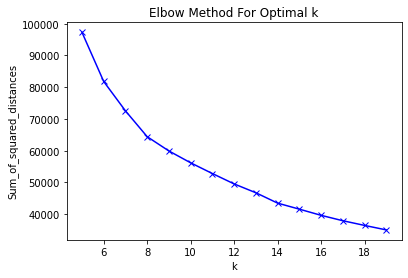

In [28]:
Sum_of_squared_distances = []
K = range(5,20)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(combined_vertically.transpose())
    Sum_of_squared_distances.append(km.inertia_)

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [29]:
Sum_of_squared_distances

[97321.68142035579,
 81810.5999214974,
 72558.16188968801,
 64408.46862612088,
 59908.55657391553,
 56175.61153438138,
 52791.616219730626,
 49525.25438892593,
 46735.8397139971,
 43471.675707591756,
 41570.53870292814,
 39624.796893203085,
 37923.58461912351,
 36445.82889368708,
 35029.23194058985]

In [56]:
diff = np.diff(Sum_of_squared_distances)

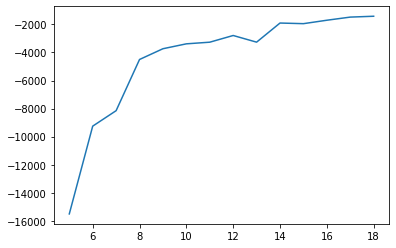

In [60]:
plt.plot(range(5,19),diff)

In [65]:
diff

array([-15511.08149886,  -9252.43803181,  -8149.69326357,  -4499.91205221,
        -3732.94503953,  -3383.99531465,  -3266.3618308 ,  -2789.41467493,
        -3264.16400641,  -1901.13700466,  -1945.74180973,  -1701.21227408,
        -1477.75572544,  -1416.5969531 ])

In [202]:
clustering = AgglomerativeClustering(n_clusters=n_components).fit(combined_vertically.transpose())

In [203]:
df = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clustering.labels_})

In [204]:
lon_temp = df["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df["lons"] = lon_temp

In [205]:
df_list = []
for j in range(len(set(clustering.labels_))):
    df_list.append(pd.DataFrame(columns=df.columns))

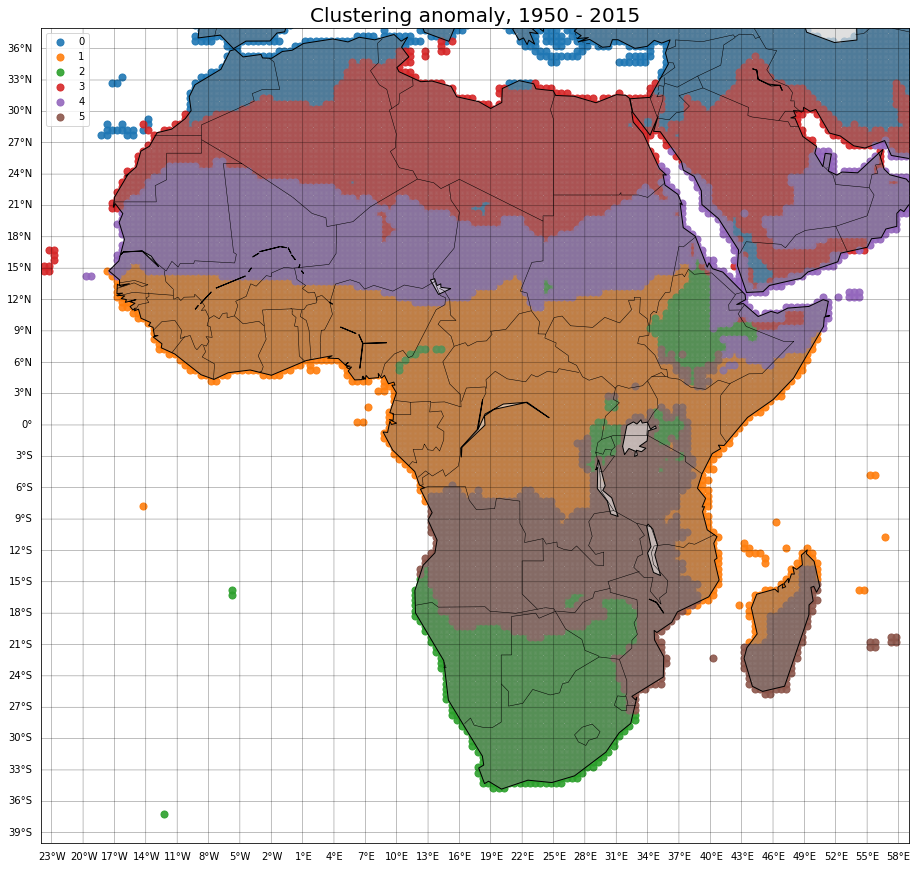

In [206]:
#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
plt.title("Clustering anomaly, 1950 - 2015", fontsize = 20)    
plt.legend()
#plt.savefig("Clustering_anomaly.png")
plt.show()

In [254]:
precipitation = result.copy()
temperature = result_air.copy()
temperature = temperature-273.15
index = temperature<-100
temperature[index] = np.NAN


#data = pd.concat([temperature,precipitation],ignore_index=True,sort=False, axis=0)

In [258]:
df.shape

(12952, 3)

In [255]:
for i in range(n_components):
    index = (df["clusters"] == i).values
    print("PRE:{}  TEMP:{}".format(precipitation[:,index].mean(), np.nanmean(temperature[:,index])))

IndexError: boolean index did not match indexed array along dimension 1; dimension is 12971 but corresponding boolean dimension is 12952

In [184]:
precipitation[:,index].mean()

196.31061

In [221]:
temperature = result_air.copy()

In [223]:
temperature

matrix([[21.7      , 20.5      , 22.1      , ..., -2.9      , -0.5      ,
         -1.4      ],
        [21.5      , 20.300001 , 22.1      , ..., -1.       ,  1.4      ,
          0.5      ],
        [23.1      , 21.9      , 23.800001 , ...,  8.6      , 11.       ,
         10.2      ],
        ...,
        [26.4      , 25.300001 , 26.9      , ..., 14.5      , 17.       ,
         16.300001 ],
        [25.9      , 24.7      , 26.5      , ...,  7.7000003, 10.2      ,
          9.3      ],
        [24.       , 22.9      , 24.5      , ...,  4.6      ,  7.2000003,
          6.3      ]], dtype=float32)

In [137]:
temperature[24,354]

-9.96921e+36

In [206]:
data.iloc[index,12:].mean()

12    3.475650
13    3.835617
14    4.447168
15    4.943354
16    4.530965
17    3.746315
18    3.589921
19    4.080499
20    5.318925
21    5.916871
22    4.820871
23    3.746787
dtype: float64

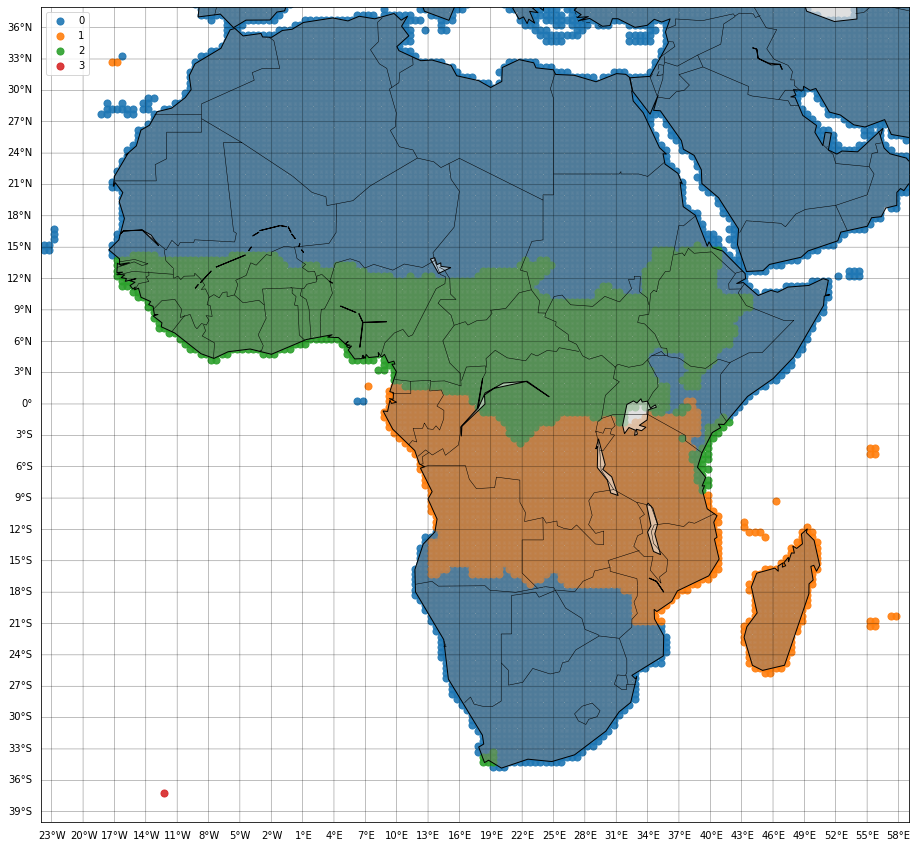

In [108]:
#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
    
plt.legend()
#plt.savefig("6_Clusters_non_standard.png")
plt.show()

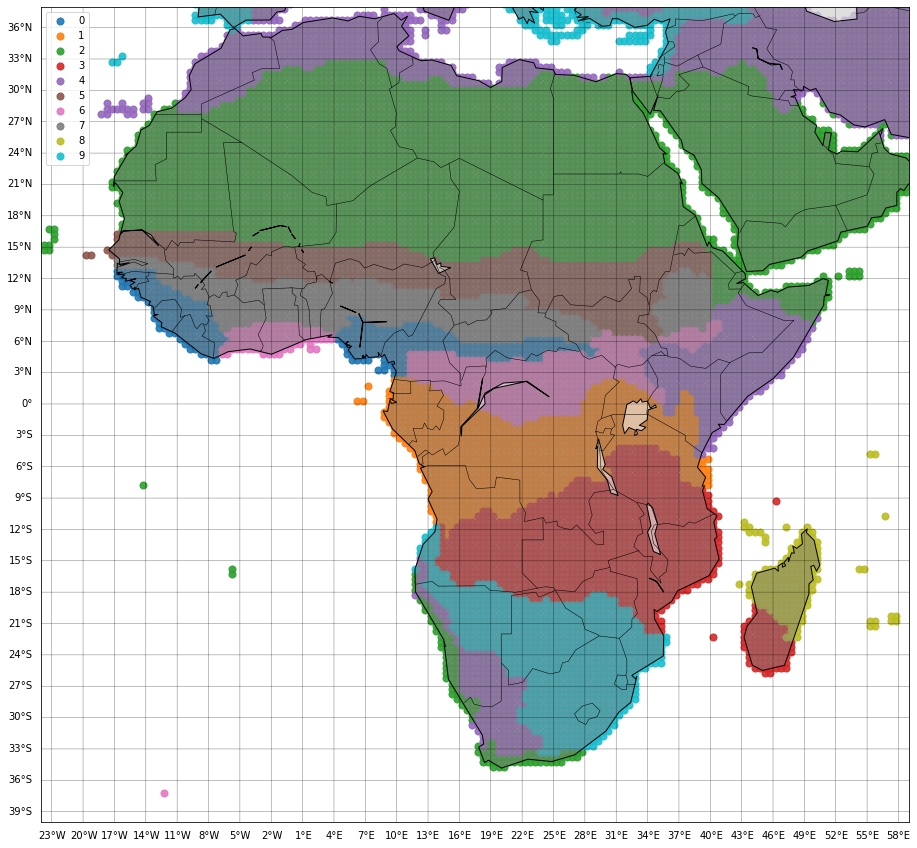

In [58]:
#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
    
plt.legend()
#plt.savefig("6_Clusters_non_standard.png")
plt.show()

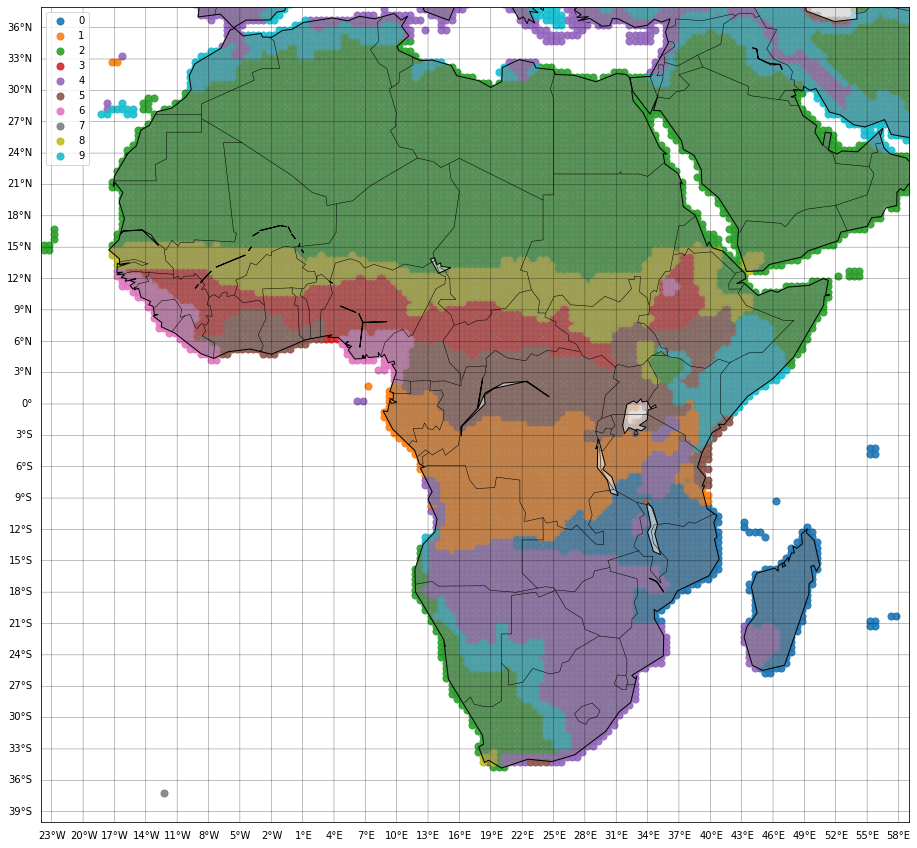

In [278]:
#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
    
plt.legend()
#plt.savefig("6_Clusters_non_standard.png")
plt.show()

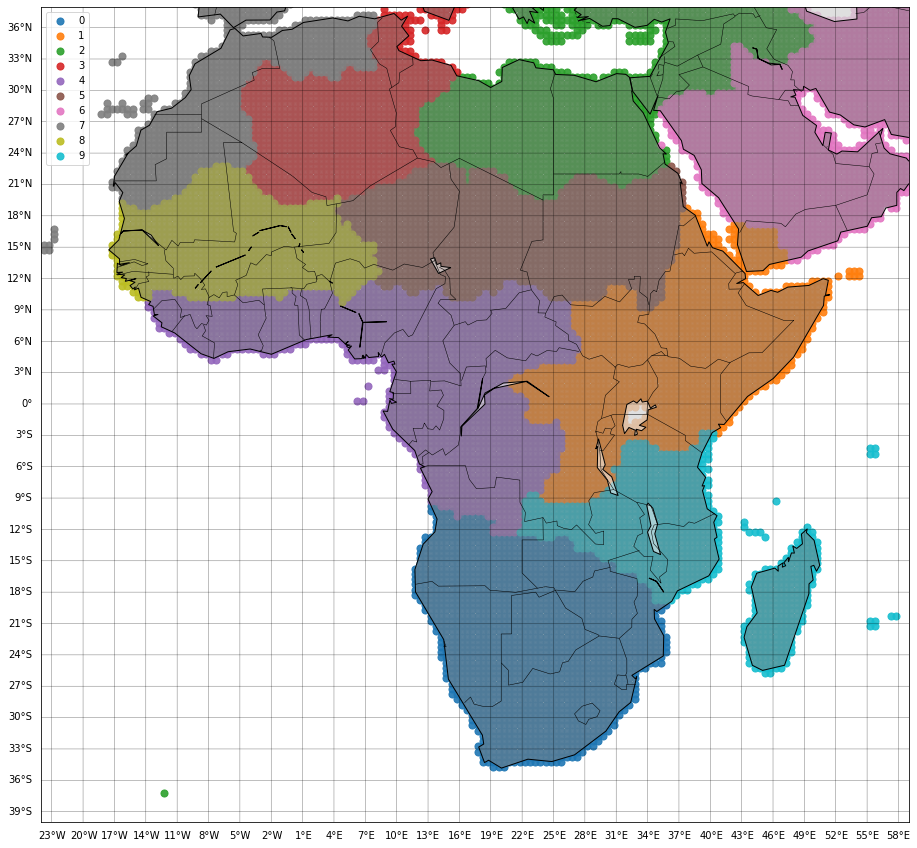

In [221]:
#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
    
plt.legend()
#plt.savefig("6_Clusters_non_standard.png")
plt.show()

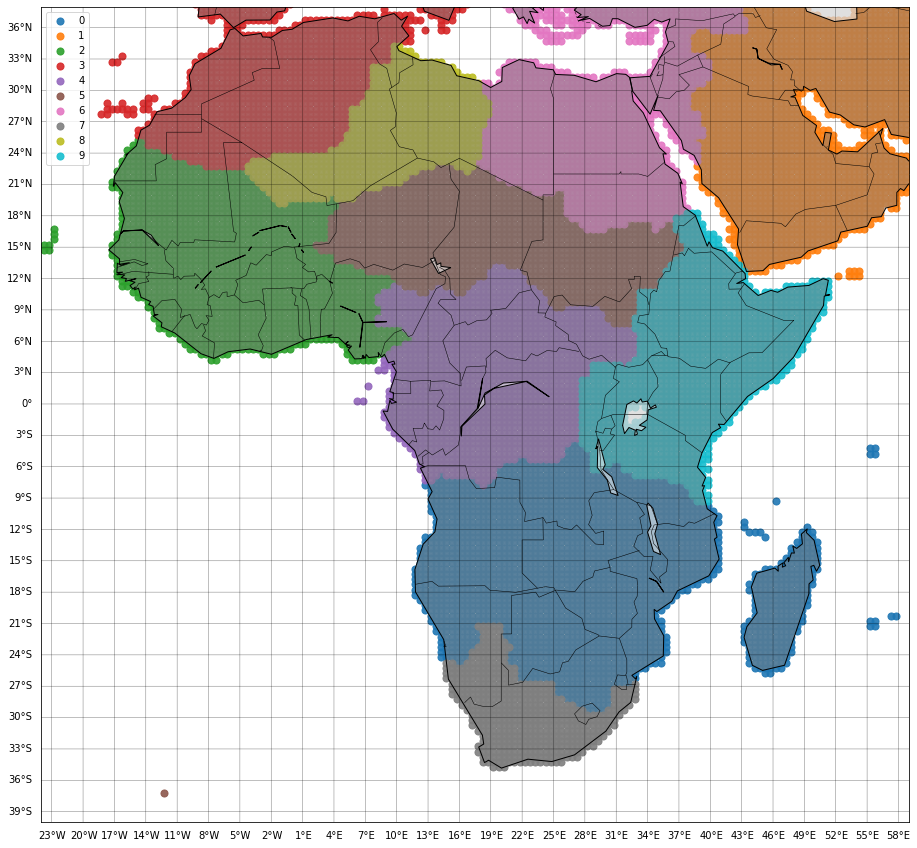

In [183]:
#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
    
plt.legend()
#plt.savefig("6_Clusters_non_standard.png")
plt.show()

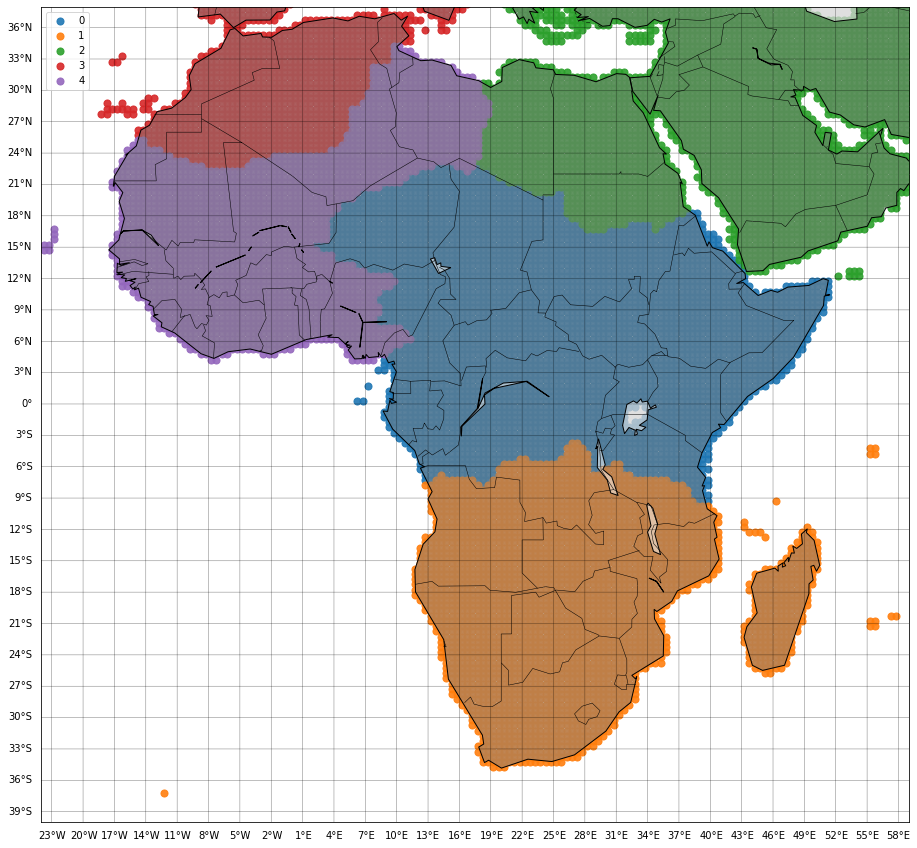

In [34]:
#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
    
plt.legend()
#plt.savefig("6_Clusters_non_standard.png")
plt.show()

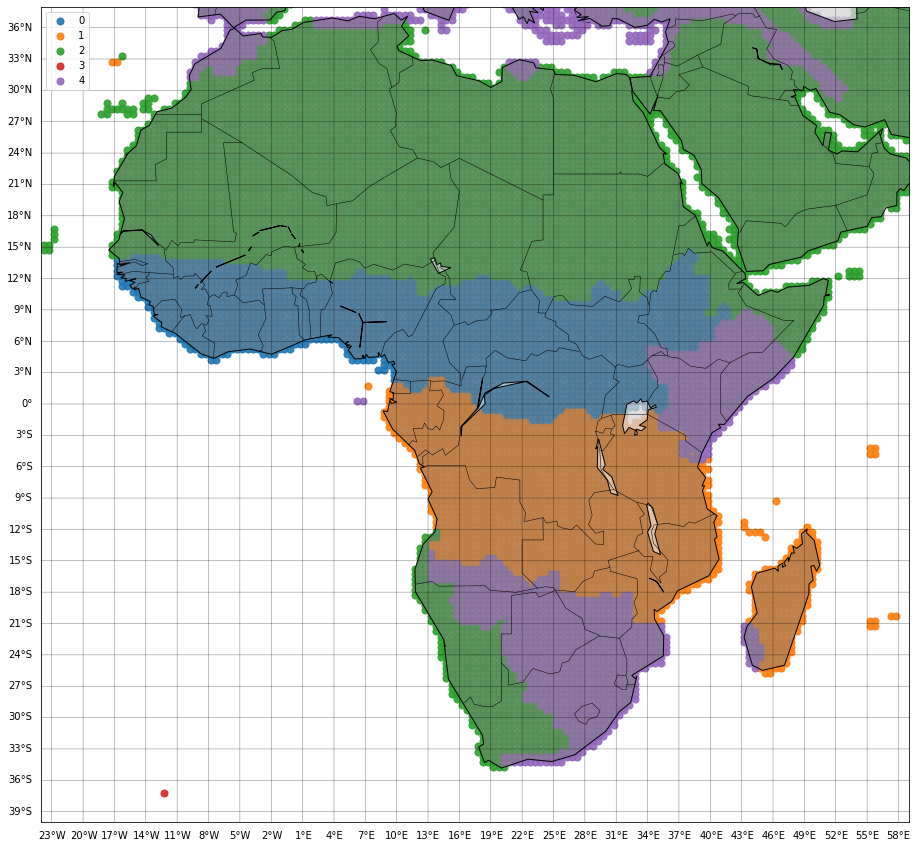

In [298]:
#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
    
plt.legend()
#plt.savefig("6_Clusters_non_standard.png")
plt.show()

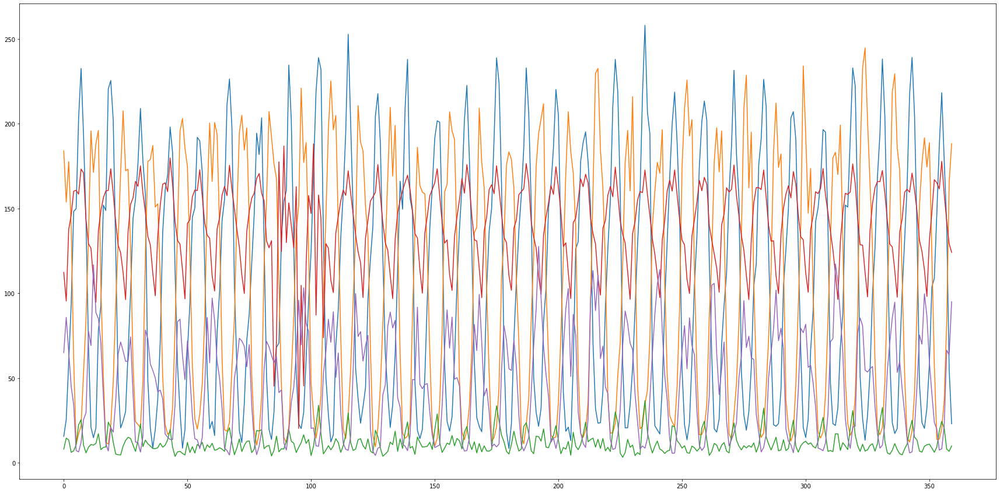

In [316]:
fig, ax = plt.subplots(figsize=(30,15))
mean = []
for i in range(n_components):
    index = clustering.labels_ == i
    y = precipitation.iloc[:,index].mean(axis = 1).values
    mean.append(y.mean())
    plt.plot(np.arange(360), y)

In [317]:
mean

[110.59763, 104.66892, 11.909112, 141.4382, 46.55786]

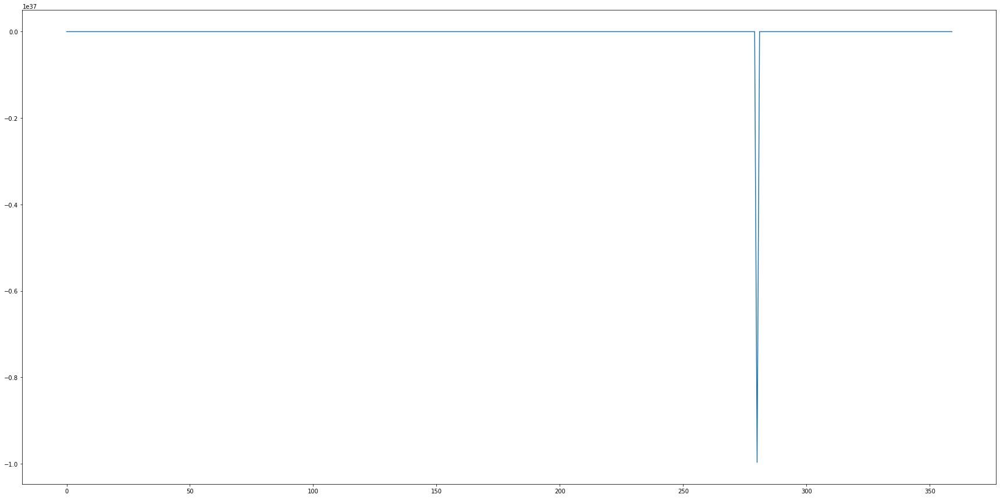

In [333]:
fig, ax = plt.subplots(figsize=(30,15))
mean = []
for i in range(3,4):
    index = clustering.labels_ == i
    y = temperature.iloc[:,index].mean(axis = 1).values
    mean.append(y.mean())
    plt.plot(np.arange(360), y)

In [319]:
temperature

,0,1,2,3,4,5,6,7,8,9,...,12961,12962,12963,12964,12965,12966,12967,12968,12969,12970
0,294.269989,294.970001,294.320007,295.089996,294.459991,294.320007,294.609985,286.489990,284.420013,287.380005,...,292.260010,294.589996,295.850006,292.269989,292.899994,294.500000,295.149994,296.970001,298.130005,298.100006
1,294.640015,295.160004,294.649994,295.170013,294.630005,294.519989,294.690002,286.769989,285.000000,287.609985,...,293.829987,295.829987,296.529999,293.230011,293.790009,295.230011,295.760010,297.290009,298.290009,298.480011
2,294.260010,294.739990,294.230011,294.640015,294.160004,294.029999,294.130005,286.959991,285.480011,287.790009,...,296.829987,298.619995,299.149994,295.920013,296.410004,297.850006,298.200012,299.260010,299.869995,299.929993
3,296.390015,296.809998,296.179993,296.579987,296.029999,295.920013,295.980011,288.510010,286.769989,289.339996,...,302.730011,304.320007,304.750000,301.519989,301.869995,303.230011,303.170013,303.549988,303.579987,303.269989
4,296.299988,296.570007,296.059998,296.299988,295.790009,295.760010,295.750000,290.010010,288.380005,290.750000,...,305.250000,306.649994,306.799988,304.019989,304.140015,305.070007,304.660004,304.450012,303.959991,303.170013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,300.299988,300.859985,300.679993,301.070007,300.869995,300.809998,301.059998,297.709991,297.390015,297.820007,...,306.459991,307.470001,305.679993,302.779999,302.329987,302.329987,301.649994,301.510010,300.899994,299.730011
356,299.980011,300.450012,299.989990,300.630005,300.350006,300.260010,300.489990,296.119995,294.859985,296.160004,...,305.410004,306.630005,305.670013,302.660004,302.549988,303.100006,302.640015,302.529999,301.890015,300.670013
357,300.170013,300.609985,300.200012,300.730011,300.429993,300.350006,300.559998,297.160004,295.079987,297.230011,...,301.820007,302.989990,301.570007,297.470001,297.709991,299.309998,299.589996,300.420013,301.089996,301.380005
358,298.739990,299.279999,298.850006,299.429993,299.000000,298.920013,299.200012,295.290009,292.679993,295.320007,...,297.380005,298.839996,297.769989,293.200012,293.709991,295.769989,296.670013,298.579987,300.380005,301.500000


In [334]:
index = clustering.labels_ == 3

In [335]:
y = temperature.iloc[:,index].mean(axis = 1).values

In [340]:
np.where(y < 0)

(array([280]),)

In [341]:
y[280]

-9.96921e+36

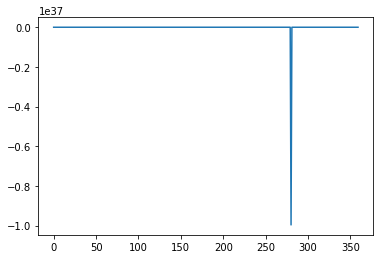

In [336]:
plt.plot(y)

In [343]:
temperature.iloc[:,index]

,354
0,290.290009
1,291.299988
2,289.850006
3,287.880005
4,285.299988
...,...
355,283.670013
356,283.980011
357,284.959991
358,284.890015


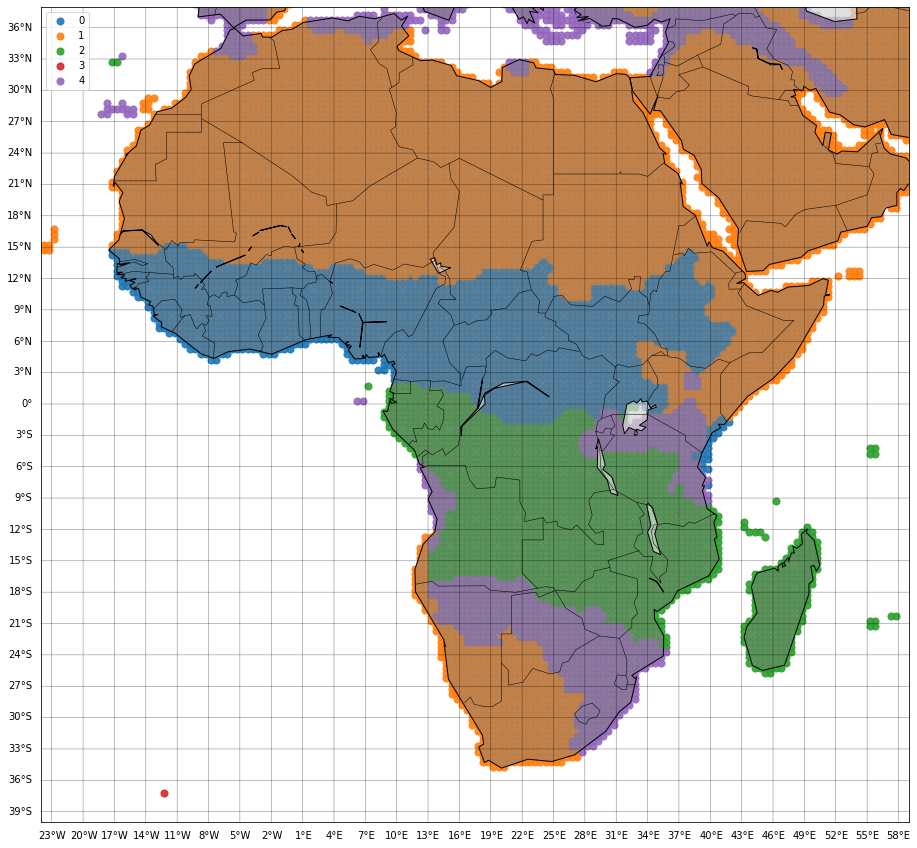

In [253]:
#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
    
plt.legend()
#plt.savefig("6_Clusters_non_standard.png")
plt.show()

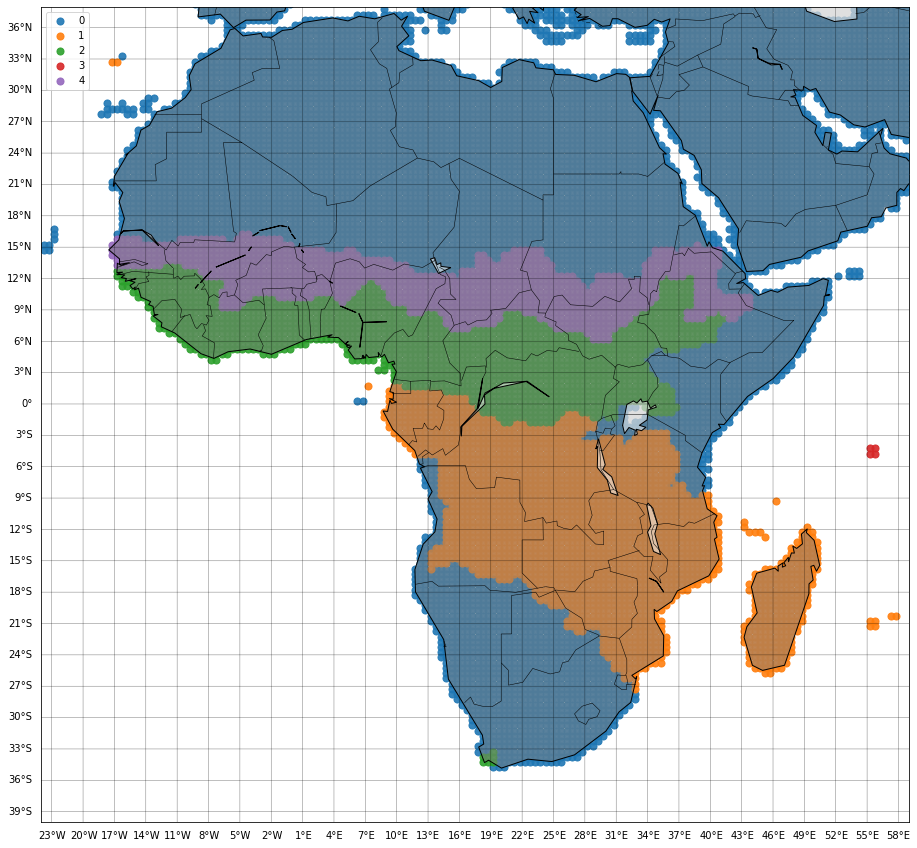

In [233]:
#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=59,urcrnrlat=38)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
m.drawcoastlines()
m.drawcountries()
#colors = pf.random_color_1(n_components)


i = 0
for j in set(clustering.labels_):
    values = df["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=50, label = i)
    i+=1
    
    
plt.legend()
#plt.savefig("6_Clusters_non_standard.png")
plt.show()

In [282]:
input_data = result.copy()
N = input_data.shape[1]
result = np.zeros((N,N))
for i in range(N):
    for j in range(N):
        result[i,j] = stats.pearsonr(input_data[:,i],input_data[:,j])[0]

KeyboardInterrupt: 

In [ ]:
precipitation = np.array(clean_list)#/np.array(clean_list).std()
precipitation = pd.DataFrame(np.transpose(precipitation))

result_air = pd.DataFrame(result_air)
temperature = result_air.iloc[:,Idx]

#temperature = temperature/temperature.stack().std()

precipitation.columns = temperature.columns

combined_vertically = pd.concat([temperature,precipitation],ignore_index=True,sort=False, axis=0)

clustering = AgglomerativeClustering(n_clusters=n_components).fit(combined_vertically.transpose())
#clustering = KMeans(n_clusters=n_components).fit(combined_vertically.transpose())

clusters_air = np.zeros(len(lon_list_air))
clusters_air.fill(-1)

clusters_air[Idx] = clustering.labels_ 

index = np.argwhere(clusters_air == -1)

clusters_air = np.delete(clusters_air, index)
lat_list_air = np.delete(lat_list_air, index)
lon_list_air = np.delete(lon_list_air, index)

df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clusters_air})

lon_temp = df_air["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_air["lons"] = lon_temp

clusters_air = np.zeros(len(lon_list_air))
clusters_air.fill(-1)

clusters_air[Idx] = clustering.labels_ 

index = np.argwhere(clusters_air == -1)

clusters_air = np.delete(clusters_air, index)
lat_list_air = np.delete(lat_list_air, index)
lon_list_air = np.delete(lon_list_air, index)

df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clusters_air})

lon_temp = df_air["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_air["lons"] = lon_temp

df_list = []
for j in range(len(set(clusters_air))):
    df_list.append(pd.DataFrame(columns=df_air.columns))

#lon = np.arange(-23.75,60.0,2.5)

#fig, ax = plt.subplots(2,1,1)
fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
#m.drawcoastlines()
#colors = pf.random_color_1(n_components)

i = 0
for j in set(clusters_air):
    values = df_air["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df_air.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=200, label = i)
    i+=1

    
plt.legend()
plt.savefig("6_Clusters_non_standard.png")
plt.show()

# OLD

In [83]:
d = Data('./nc/GPCC_half.nc','precip',temporal_limits, missing_value=-9.969209968386869e+36)

result = d.get_data()
lon_list = d.get_lon_list()
lat_list = d.get_lat_list()
lon = d.get_lon()
lat = d.get_lat()

d = Data('./nc/air_monthly_mean_africa_half.nc','air', temporal_limits, missing_value=-9.96921e+36)

result_air = d.get_data()
lon_list_air = d.get_lon_list()
lat_list_air = d.get_lat_list()
lon_air = d.get_lon()
lat_air = d.get_lat()

air_list = list(zip(lon_list_air,lat_list_air))
pre_list = list(zip(lon_list,lat_list))


air_list = list(zip(lon_list_air,lat_list_air))

pre_list = list(zip(lon_list,lat_list))

clean_list = []
index = []
for i in range(len(air_list)):
    temp = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])
    if temp.shape:
    #if not np.isnan(temp):
        clean_list.append(temp)
        index.append(i)
    #data[:,i,1] = np.squeeze(result_air[:,i])
    #data[:,i,0] = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])

In [84]:
data = np.zeros((result_air.shape[0],len(clean_list),2))

for i in range(len(clean_list)):

    data[:,i,1] = np.squeeze(result_air[:,index[i]])
    data[:,i,0] = clean_list[i]

distance = np.zeros((data.shape[1],data.shape[1]))

for i in range(data.shape[1]):
    for j in range(data.shape[1]):
        distance[i,j] = LA.norm(data[:,i,:]-data[:,j,:])

In [85]:
clustering = AgglomerativeClustering(n_clusters=n_components,affinity="precomputed",linkage="complete").fit(distance)

In [86]:
clusters_air = np.zeros(len(lon_list_air))
clusters_air.fill(-1)

clusters_air[index] = clustering.labels_ 

index = np.argwhere(clusters_air == -1)

clusters_air = np.delete(clusters_air, index)
lat_list_air = np.delete(lat_list_air, index)
lon_list_air = np.delete(lon_list_air, index)

df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clusters_air})

lon_temp = df_air["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_air["lons"] = lon_temp

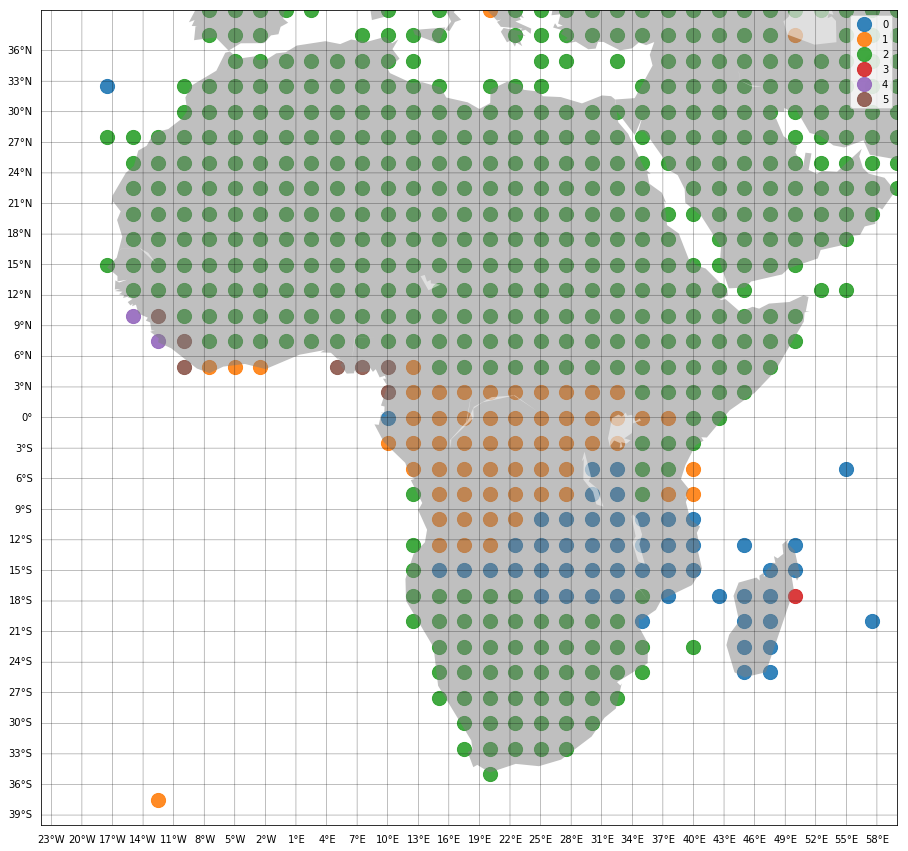

In [87]:
df_list = []
for j in range(len(set(clusters_air))):
    df_list.append(pd.DataFrame(columns=df_air.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
#m.drawcoastlines()
#colors = pf.random_color_1(n_components)

i = 0
for j in set(clusters_air):
    values = df_air["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df_air.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=200, label = i)
    i+=1

    
plt.legend()
plt.show()

# Raw Data using vector euclidean distance:

In [176]:
result_list_op = []

In [173]:
n_components = 4

In [177]:
for n_components in range(4,26):
    level = 12
    temporal_limits = {"time_min":datetime(1948, 1, 1, 0, 0),"time_max":datetime(2016, 1, 1, 0, 0) } 
    spatial_limits = {"lon_min":-40,"lon_max":60,"lat_min":-40,"lat_max":40}

    d = Data('GPCC_half.nc','precip',temporal_limits, missing_value=-9.96921e+36)

    result = d.get_data()
    lon_list = d.get_lon_list()
    lat_list = d.get_lat_list()
    lon = d.get_lon()
    lat = d.get_lat()

    d = Data('air_monthly_mean_africa.nc','air', missing_value=-9.96921e+36)

    result_air = d.get_data()
    lon_list_air = d.get_lon_list()
    lat_list_air = d.get_lat_list()
    lon_air = d.get_lon()
    lat_air = d.get_lat()

    #result = transform(result)

    air_list = list(zip(lon_list_air,lat_list_air))

    pre_list = list(zip(lon_list,lat_list))

    clean_list = []
    Idx = []
    for i in range(len(air_list)):
        temp = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])
        if temp.shape:
        #if not np.isnan(temp):
            clean_list.append(temp)
            Idx.append(i)
        #data[:,i,1] = np.squeeze(result_air[:,i])
        #data[:,i,0] = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])

    precipitation = np.array(clean_list)#/np.array(clean_list).std()
    precipitation = pd.DataFrame(np.transpose(precipitation))

    result_air = pd.DataFrame(result_air)
    temperature = result_air.iloc[:,Idx]

    #temperature = temperature/temperature.stack().std()

    precipitation.columns = temperature.columns

    combined_vertically = pd.concat([temperature,precipitation],ignore_index=True,sort=False, axis=0)

    clustering = AgglomerativeClustering(n_clusters=n_components).fit(combined_vertically.transpose())
    #clustering = KMeans(n_clusters=n_components).fit(combined_vertically.transpose())

    clusters_air = np.zeros(len(lon_list_air))
    clusters_air.fill(-1)

    clusters_air[Idx] = clustering.labels_ 

    index = np.argwhere(clusters_air == -1)

    clusters_air = np.delete(clusters_air, index)
    lat_list_air = np.delete(lat_list_air, index)
    lon_list_air = np.delete(lon_list_air, index)

    df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clusters_air})

    lon_temp = df_air["lons"].values
    lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
    df_air["lons"] = lon_temp

    class_air = []
    for i in range(len(clusters_air)):
        r = neighbour_vote_class(df_air,lat_list_air[i],lon_list_air[i])  
        if r.size == 0:
            class_air.append('NAN')
        else:
            most_common,num_most_common = Counter(r).most_common(1)[0]
            class_air.append(most_common)

    df_class = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":class_air})

    lon_temp = df_class["lons"].values
    lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
    df_class["lons"] = lon_temp

    similarity = np.zeros((len(set(clusters_air)),len(set(class_air))))

    values = df_air["clusters"].values
    class_values = df_class["clusters"].values

    count_i = 0 
    count_j = 0
    for i in set(clusters_air): 
        index = np.where(values == i)[0]
        for j in set(class_air):         
            class_Idx = np.where(class_values == j)[0]
            similarity[count_i,count_j] = len(np.intersect1d(index,class_Idx))
            count_j += 1
        count_j = 0    
        count_i += 1

    n = 18

    w = similarity

    if w.shape[0]<n:
        d = n - w.shape[0]
        w = np.r_[w, np.zeros((d,n))]

    prob = p.LpProblem("ClusterAssigment", p.LpMaximize)

    #Create a binary variable
    #It determines which edge should be included
    #And which one should be eliminated
    assign_vars = p.LpVariable.dicts("X",
                                     [(i, j) for i in range(n)
                                      for j in range(n)],
                                     0, 1, p.LpBinary)

    #Objective function
    #Maximizing the sum of weights of included links
    prob += p.lpSum(w[i,j] * assign_vars[i,j] for i in range(n) for j in range(n))

    #Constrains: There must be either one or zero link originating from a node
    for j in range(n):
        prob += p.lpSum(assign_vars[i,j] for i in range(n)) == 1

    #Constrains: There must be either one or zero link going to a node
    for i in range(n):
        prob += p.lpSum(assign_vars[i,j] for j in range(n)) == 1

    #Running the optimization
    prob.solve()


    #Converting the result to a numpy array
    result = np.zeros(w.shape)
    matching_points = 0
    for v in prob.variables():
        string  = str(v.name)
        r = re.findall(r"\w+",string)
        i = int(r[1])
        j = int(r[2][1:])
        if v.value() == 1: 
            matching_points += w[i,j]
        result[i,j] = v.value()



    #Percentage of matching points 
    n_points = np.sum(w)
    result_list_op.append(matching_points/n_points)

In [178]:
result_list_op

[0.523972602739726,
 0.5702054794520548,
 0.5753424657534246,
 0.547945205479452,
 0.5085616438356164,
 0.511986301369863,
 0.511986301369863,
 0.4931506849315068,
 0.4965753424657534,
 0.4965753424657534,
 0.5017123287671232,
 0.5,
 0.4914383561643836,
 0.488013698630137,
 0.488013698630137,
 0.488013698630137,
 0.488013698630137,
 0.488013698630137,
 0.4863013698630137,
 0.4863013698630137,
 0.4845890410958904,
 0.4914383561643836]

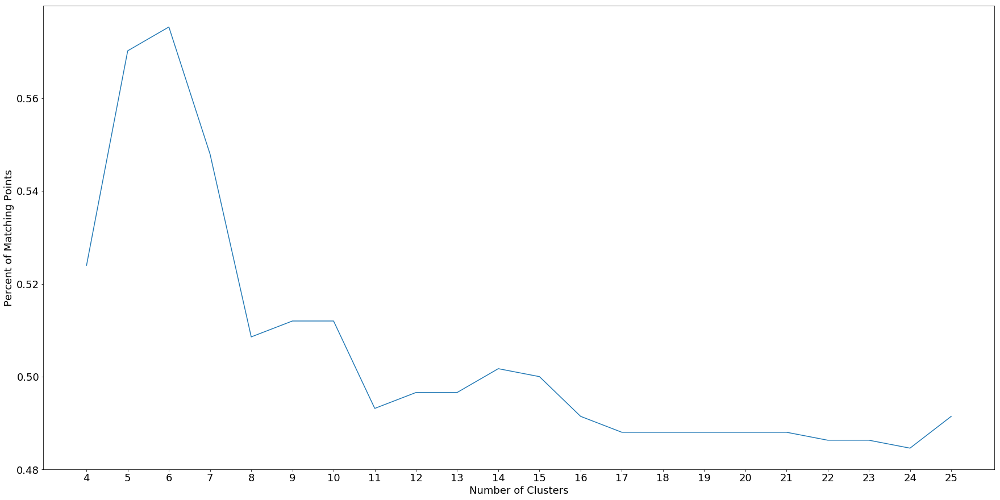

In [179]:
fig, ax = plt.subplots(figsize=(30,15))
plt.plot(np.arange(4,26), result_list_op)
plt.xticks(np.arange(4, 26, step=1), fontsize=18)
plt.yticks( fontsize=18)
plt.xlabel("Number of Clusters",fontsize=18)
plt.ylabel("Percent of Matching Points",fontsize=18)
plt.savefig("Assignment_Problem_non_standard.png");

In [180]:
n_components = 6
level = 12
temporal_limits = {"time_min":datetime(1948, 1, 1, 0, 0),"time_max":datetime(2016, 1, 1, 0, 0) } 
spatial_limits = {"lon_min":-40,"lon_max":60,"lat_min":-40,"lat_max":40}

In [181]:
d = Data('GPCC_half.nc','precip',temporal_limits, missing_value=-9.96921e+36)

result = d.get_data()
lon_list = d.get_lon_list()
lat_list = d.get_lat_list()
lon = d.get_lon()
lat = d.get_lat()

In [182]:
d = Data('air_monthly_mean_africa.nc','air', missing_value=-9.96921e+36)

result_air = d.get_data()
lon_list_air = d.get_lon_list()
lat_list_air = d.get_lat_list()
lon_air = d.get_lon()
lat_air = d.get_lat()

In [164]:
#result = transform(result)

In [183]:
air_list = list(zip(lon_list_air,lat_list_air))

pre_list = list(zip(lon_list,lat_list))

clean_list = []
Idx = []
for i in range(len(air_list)):
    temp = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])
    if temp.shape:
    #if not np.isnan(temp):
        clean_list.append(temp)
        Idx.append(i)
    #data[:,i,1] = np.squeeze(result_air[:,i])
    #data[:,i,0] = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])

In [184]:
precipitation = np.array(clean_list)#/np.array(clean_list).std()
precipitation = pd.DataFrame(np.transpose(precipitation))

result_air = pd.DataFrame(result_air)
temperature = result_air.iloc[:,Idx]

#temperature = temperature/temperature.stack().std()

precipitation.columns = temperature.columns

combined_vertically = pd.concat([temperature,precipitation],ignore_index=True,sort=False, axis=0)

In [185]:
clustering = AgglomerativeClustering(n_clusters=n_components).fit(combined_vertically.transpose())
#clustering = KMeans(n_clusters=n_components).fit(combined_vertically.transpose())

In [168]:
clusters_air = np.zeros(len(lon_list_air))
clusters_air.fill(-1)

clusters_air[Idx] = clustering.labels_ 

index = np.argwhere(clusters_air == -1)

clusters_air = np.delete(clusters_air, index)
lat_list_air = np.delete(lat_list_air, index)
lon_list_air = np.delete(lon_list_air, index)

df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clusters_air})

lon_temp = df_air["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_air["lons"] = lon_temp

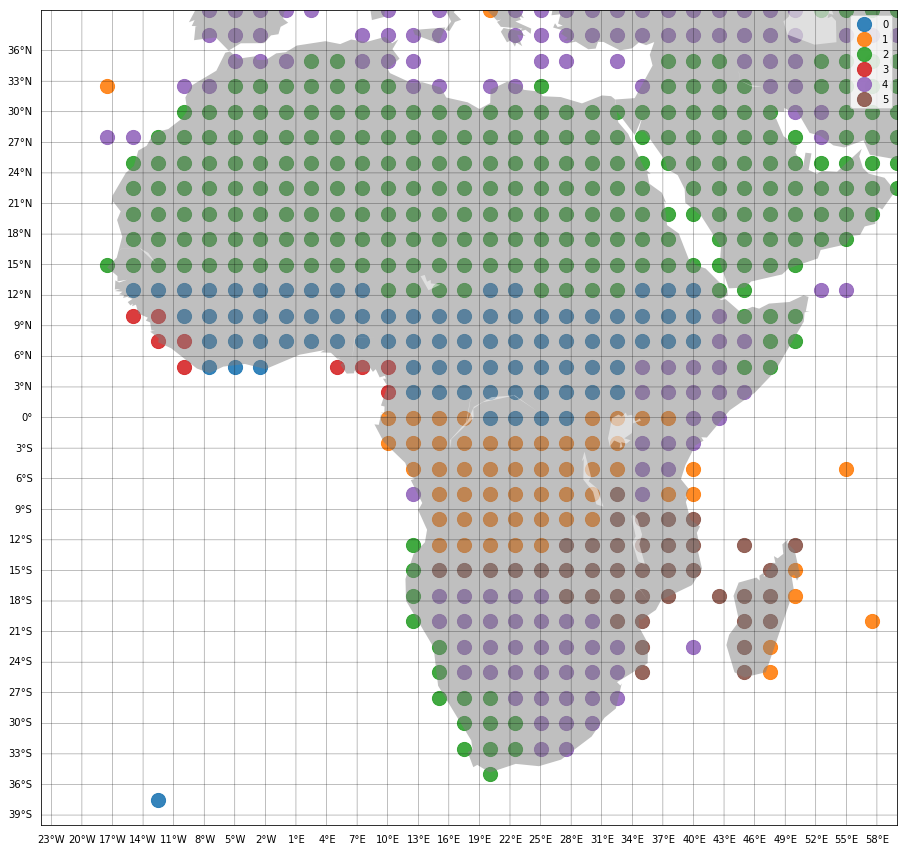

In [186]:
clusters_air = np.zeros(len(lon_list_air))
clusters_air.fill(-1)

clusters_air[Idx] = clustering.labels_ 

index = np.argwhere(clusters_air == -1)

clusters_air = np.delete(clusters_air, index)
lat_list_air = np.delete(lat_list_air, index)
lon_list_air = np.delete(lon_list_air, index)

df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clusters_air})

lon_temp = df_air["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_air["lons"] = lon_temp

df_list = []
for j in range(len(set(clusters_air))):
    df_list.append(pd.DataFrame(columns=df_air.columns))

#lon = np.arange(-23.75,60.0,2.5)

#fig, ax = plt.subplots(2,1,1)
fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
#m.drawcoastlines()
#colors = pf.random_color_1(n_components)

i = 0
for j in set(clusters_air):
    values = df_air["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df_air.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=200, label = i)
    i+=1

    
plt.legend()
plt.savefig("6_Clusters_non_standard.png")
plt.show()

In [169]:
class_air = []
for i in range(len(clusters_air)):
    r = neighbour_vote_class(df_air,lat_list_air[i],lon_list_air[i])  
    if r.size == 0:
        class_air.append('NAN')
    else:
        most_common,num_most_common = Counter(r).most_common(1)[0]
        class_air.append(most_common)

In [170]:
df_class = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":class_air})

lon_temp = df_class["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_class["lons"] = lon_temp

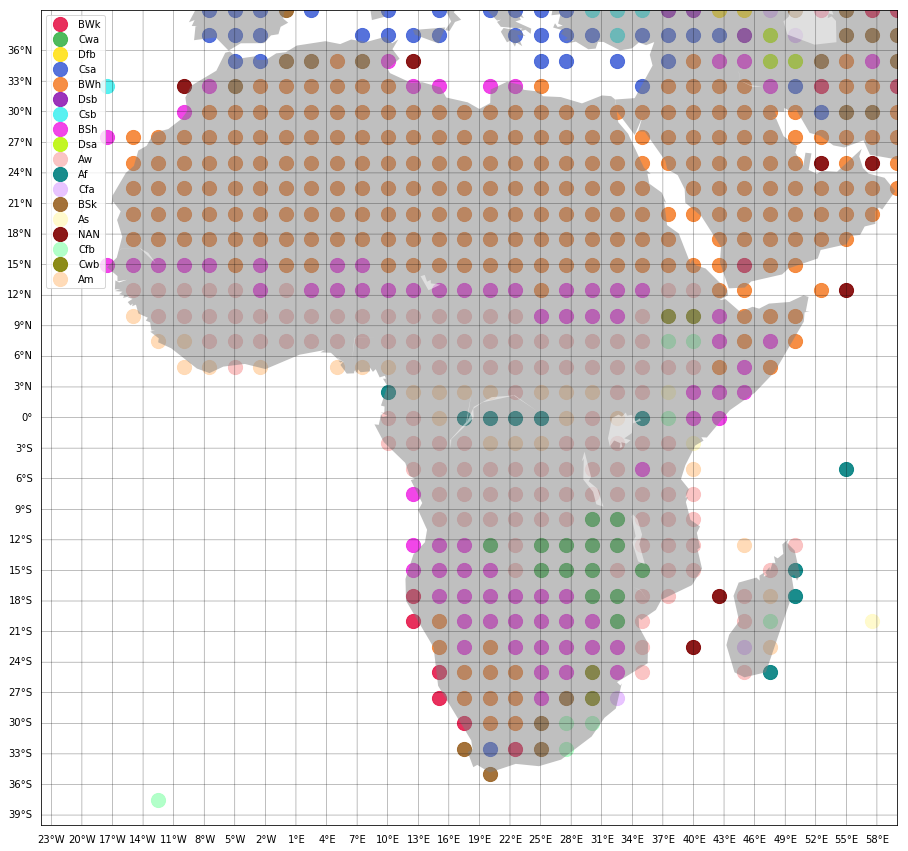

In [171]:
df_class = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":class_air})

lon_temp = df_class["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_class["lons"] = lon_temp

df_list = []
for j in range(len(set(class_air))):
    df_list.append(pd.DataFrame(columns=df_class.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
#m.drawcoastlines()
#colors = pf.random_color_1(n_components)

colors = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', 
'#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', 
'#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000']
#colors = pf.random_color(n_components_sst)

i = 0
for j in set(class_air):
    values = df_class["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df_class.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=200, label = i, c = colors[i])
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, set(class_air))
    i+=1

    
#plt.legend()
plt.savefig("Climate_Classes.png")
plt.show()

In [ ]:
from sklearn.metrics.cluster import adjusted_mutual_info_score,homogeneity_score, mutual_info_score, adjusted_rand_score, silhouette_score

In [83]:
mutual_info_score(clusters_air, class_air)

1.1796702666915873

In [84]:
adjusted_mutual_info_score(clusters_air, class_air)

0.41294852214133365

In [85]:
homogeneity_score(clusters_air, class_air)

0.45944490994925036

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.28151566
For n_clusters = 3 The average silhouette_score is : 0.3228462
For n_clusters = 4 The average silhouette_score is : 0.33504984
For n_clusters = 5 The average silhouette_score is : 0.32254508
For n_clusters = 6 The average silhouette_score is : 0.26270875
For n_clusters = 7 The average silhouette_score is : 0.25430447
For n_clusters = 8 The average silhouette_score is : 0.25531235
For n_clusters = 9 The average silhouette_score is : 0.24884738
For n_clusters = 10 The average silhouette_score is : 0.24240327
For n_clusters = 11 The average silhouette_score is : 0.23730594
For n_clusters = 12 The average silhouette_score is : 0.23905632
For n_clusters = 13 The average silhouette_score is : 0.2432044


KeyboardInterrupt: 

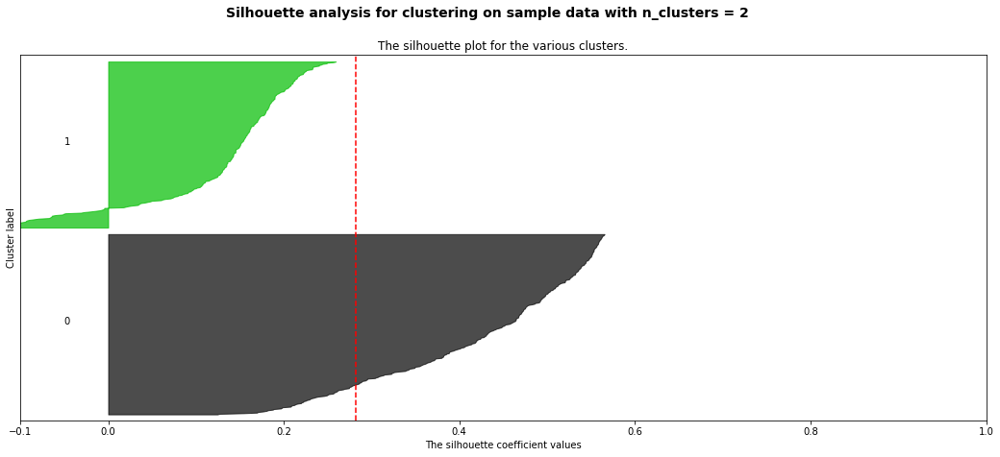

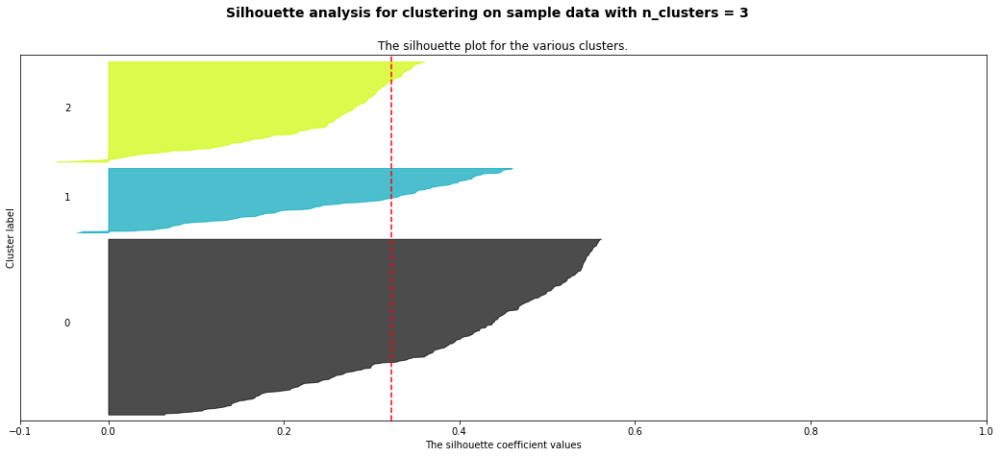

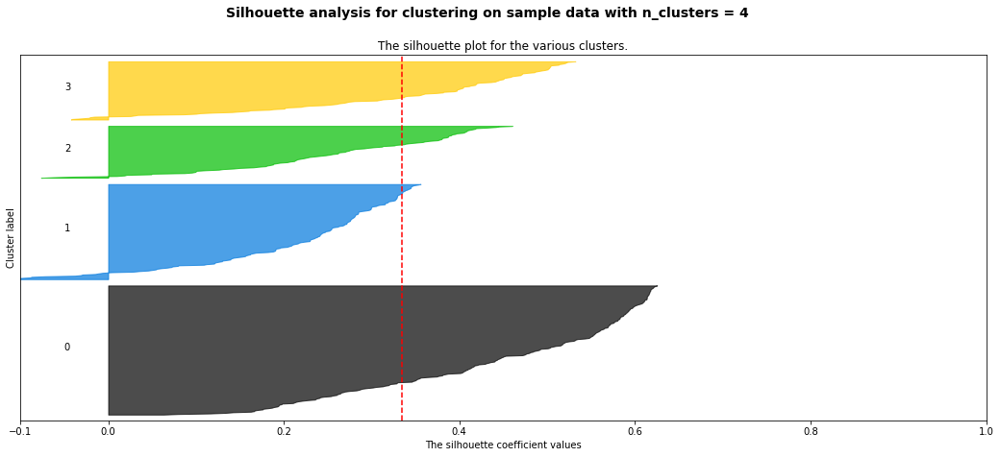

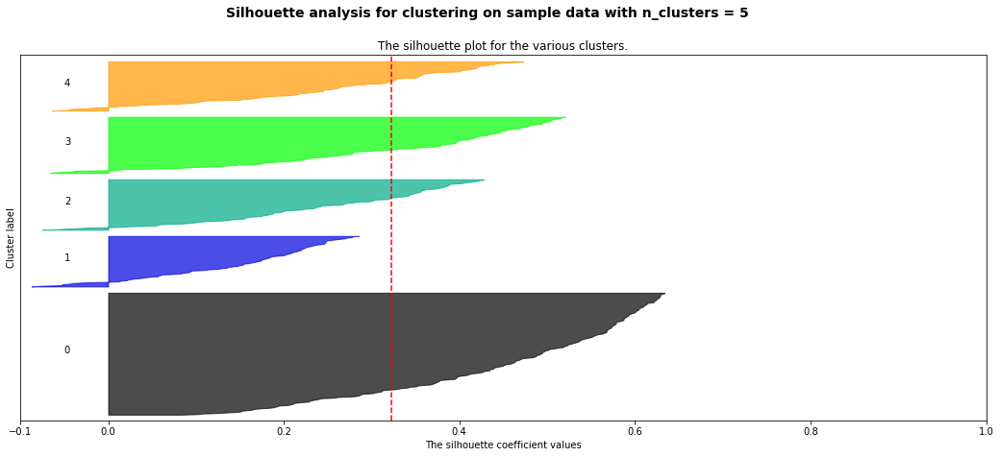

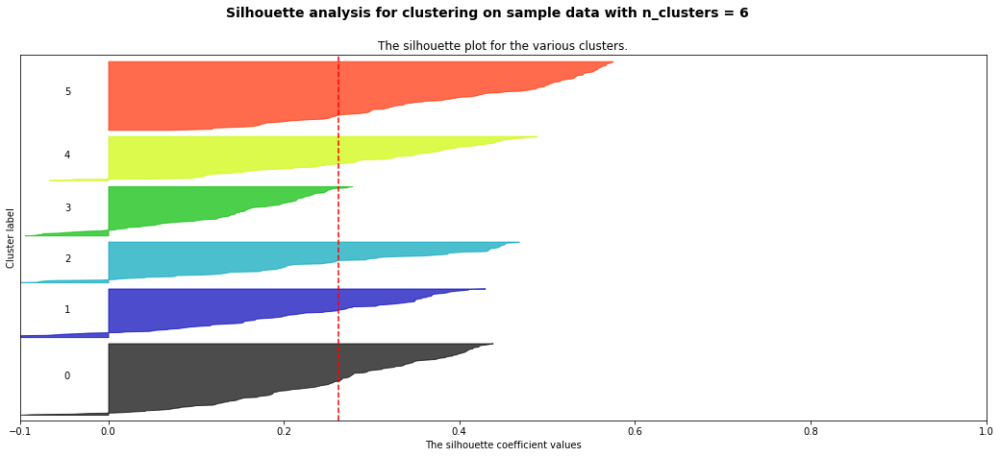

...

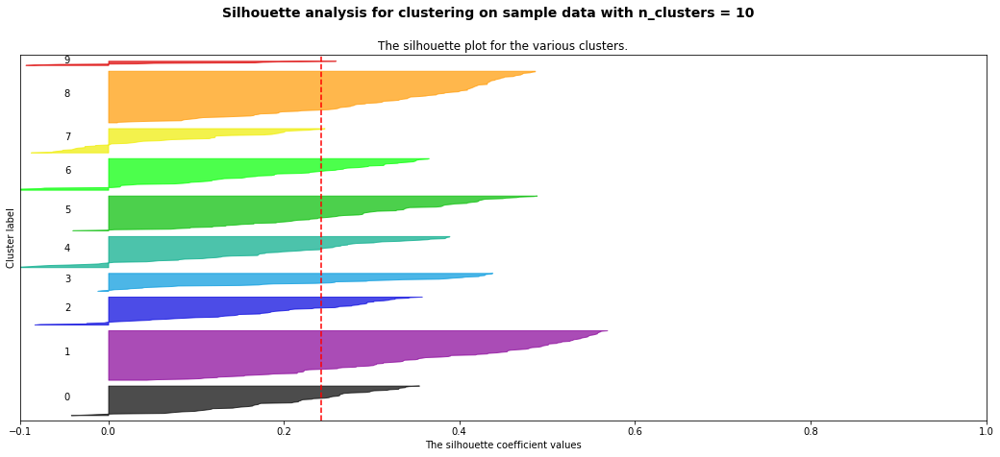

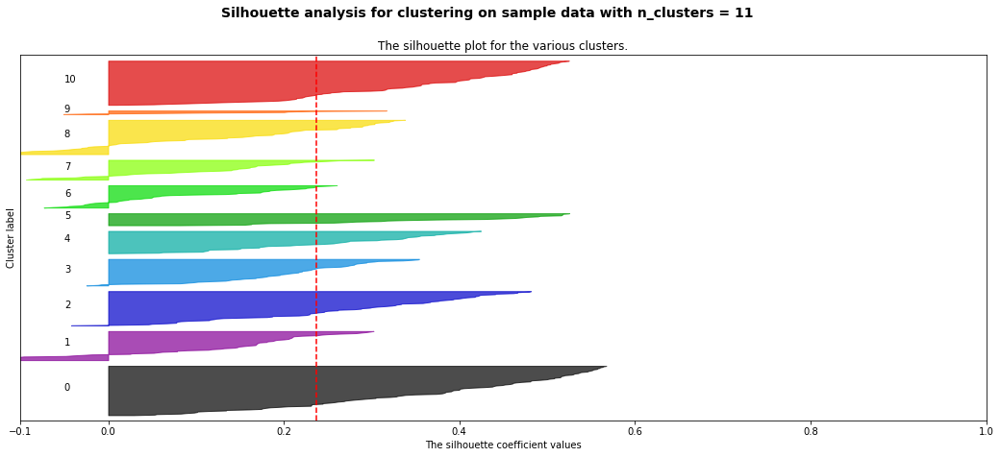

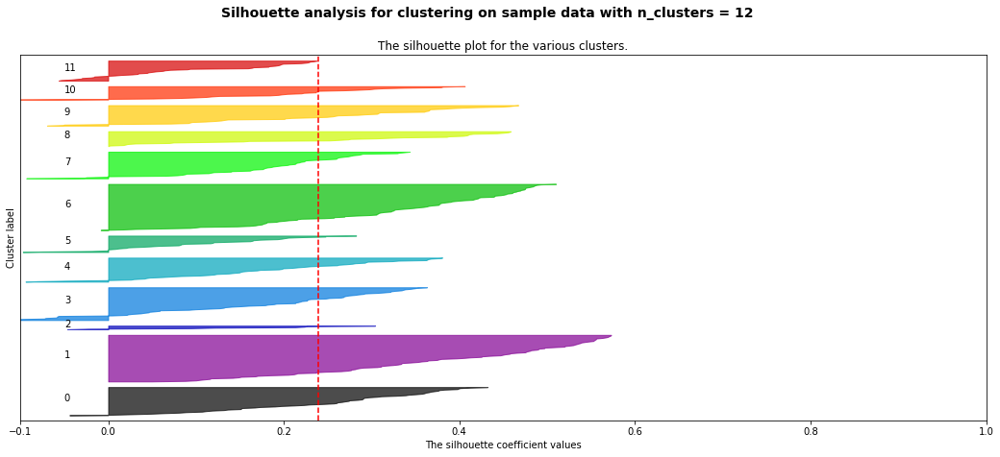

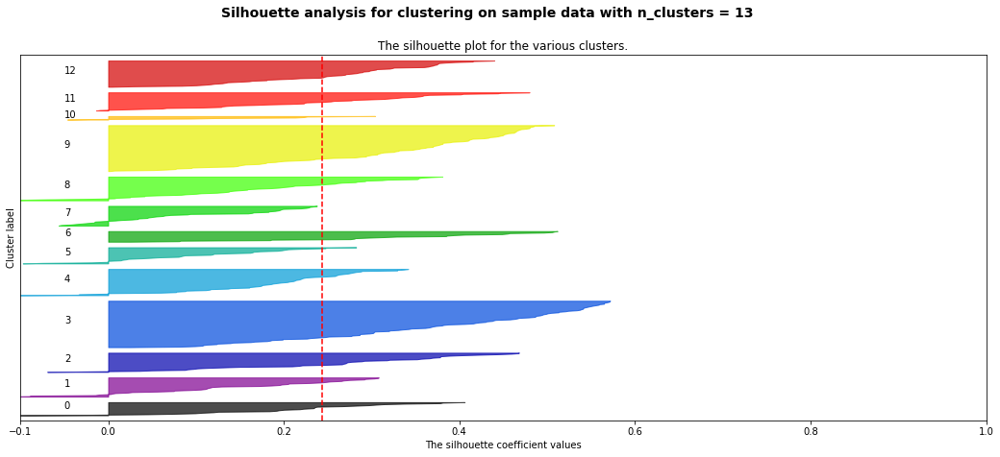

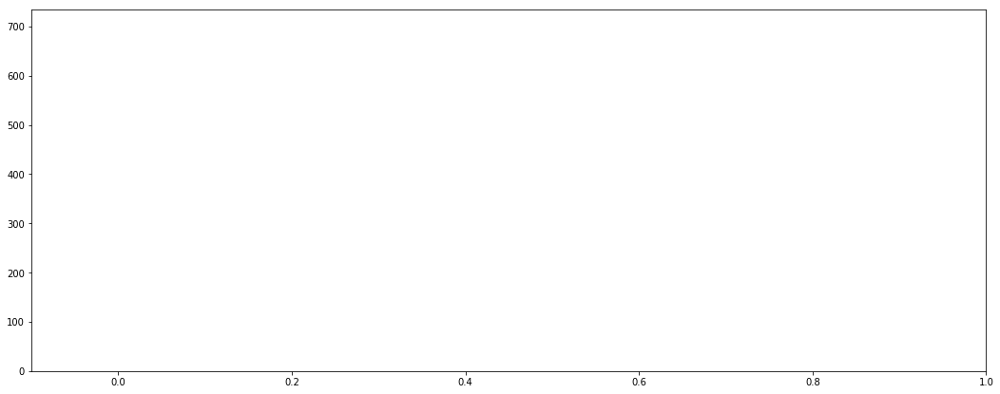

In [86]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X, y = make_blobs(n_samples=500,
                  n_features=2,
                  centers=4,
                  cluster_std=1,
                  center_box=(-10.0, 10.0),
                  shuffle=True,
                  random_state=1)  # For reproducibility

X = combined_vertically.transpose()

range_n_clusters = np.arange(2,19)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    #clusterer = AgglomerativeClustering(n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(X)

    
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    #ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
    #            c=colors, edgecolor='k')

    # Labeling the clusters
   # centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    #ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
    #            c="white", alpha=1, s=200, edgecolor='k')

    #for i, c in enumerate(centers):
    #    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
    #                s=50, edgecolor='k')

    #ax2.set_title("The visualization of the clustered data.")
    #ax2.set_xlabel("Feature space for the 1st feature")
    #ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [ ]:
similarity = np.zeros((len(set(clusters_air)),len(set(class_air))))

In [ ]:
values = df_air["clusters"].values
class_values = df_class["clusters"].values

In [ ]:
count_i = 0 
count_j = 0
for i in set(clusters_air): 
    index = np.where(values == i)[0]
    for j in set(class_air):         
        class_Idx = np.where(class_values == j)[0]
        similarity[count_i,count_j] = len(np.intersect1d(index,class_Idx))
        count_j += 1
    count_j = 0    
    count_i += 1

In [ ]:
n = 18

w = similarity

if w.shape[0]<n:
    d = n - w.shape[0]
    w = np.r_[w, np.zeros((d,n))]

In [ ]:
prob = p.LpProblem("ClusterAssigment", p.LpMaximize)

#Create a binary variable
#It determines which edge should be included
#And which one should be eliminated
assign_vars = p.LpVariable.dicts("X",
                                 [(i, j) for i in range(n)
                                  for j in range(n)],
                                 0, 1, p.LpBinary)

#Objective function
#Maximizing the sum of weights of included links
prob += p.lpSum(w[i,j] * assign_vars[i,j] for i in range(n) for j in range(n))

#Constrains: There must be either one or zero link originating from a node
for j in range(n):
    prob += p.lpSum(assign_vars[i,j] for i in range(n)) == 1

#Constrains: There must be either one or zero link going to a node
for i in range(n):
    prob += p.lpSum(assign_vars[i,j] for j in range(n)) == 1

#Running the optimization
prob.solve()


#Converting the result to a numpy array
result = np.zeros(w.shape)
matching_points = 0
for v in prob.variables():
    string  = str(v.name)
    r = re.findall(r"\w+",string)
    i = int(r[1])
    j = int(r[2][1:])
    if v.value() == 1: 
        matching_points += w[i,j]
    result[i,j] = v.value()



#Percentage of matching points 
n_points = np.sum(w)
result_list_op.append(matching_points/n_points)

In [ ]:
result_list_op

In [482]:
result_list_cp=[0.3424657534246575,
 0.5513698630136986,
 0.5513698630136986,
 0.541095890410959,
 0.3955479452054795,
 0.4006849315068493,
 0.3921232876712329,
 0.398972602739726,
 0.4023972602739726,
 0.3886986301369863,
 0.4041095890410959,
 0.4075342465753425,
 0.4126712328767123,
 0.4126712328767123,
 0.4126712328767123,
 0.4160958904109589,
 0.4023972602739726,
 0.3681506849315068,
 0.363013698630137,
 0.3476027397260274,
 0.3441780821917808,
 0.3424657534246575]

In [473]:
result_list_op.insert(0,matching_points/n_points)

In [481]:
result_list_op

[0.3424657534246575,
 0.5513698630136986,
 0.5513698630136986,
 0.541095890410959,
 0.3955479452054795,
 0.4006849315068493,
 0.3921232876712329,
 0.398972602739726,
 0.4023972602739726,
 0.3886986301369863,
 0.4041095890410959,
 0.4075342465753425,
 0.4126712328767123,
 0.4126712328767123,
 0.4126712328767123,
 0.4160958904109589,
 0.4023972602739726,
 0.3681506849315068,
 0.363013698630137,
 0.3476027397260274,
 0.3441780821917808,
 0.3424657534246575]

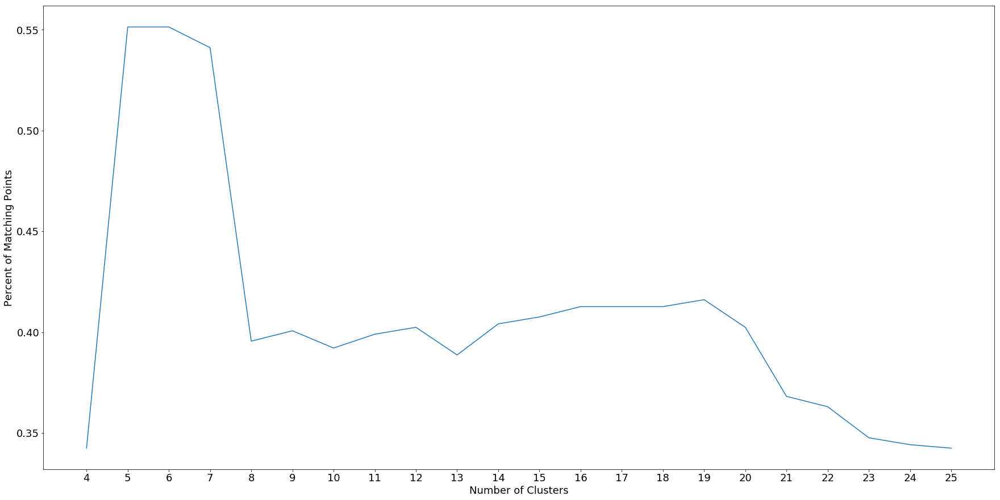

In [480]:
fig, ax = plt.subplots(figsize=(30,15))
plt.plot(np.arange(4,26), result_list_op)
plt.xticks(np.arange(4, 26, step=1), fontsize=18)
plt.yticks( fontsize=18)
plt.xlabel("Number of Clusters",fontsize=18)
plt.ylabel("Percent of Matching Points",fontsize=18)
plt.savefig("Assignment_Problem.png");

In [201]:
count_i = 0 
count_j = 0
for i in set(clusters_air): 
    Idx = np.where(values == i)[0]
    for j in set(class_air):         
        class_Idx = np.where(class_values == j)[0]
        similarity[count_i,count_j] = len(np.intersect1d(Idx,class_Idx))/(len(Idx) + len(class_Idx) - len(np.intersect1d(Idx,class_Idx)))
        count_j += 1
    count_j = 0    
    count_i += 1

In [18]:
similarity

array([[35.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  4.,  2.,
         1.,  0.,  1.,  0.,  0.],
       [ 0.,  2.,  1.,  0., 29.,  0.,  5.,  0.,  0.,  0.,  0.,  0., 11.,
         0.,  0.,  0., 12.,  0.],
       [42.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  5.,
         0.,  0.,  0.,  0.,  0.],
       [19.,  0.,  0.,  8.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  2.,  1.,
         0.,  0.,  0.,  0.,  0.],
       [ 0.,  3.,  0.,  0., 94.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  5.,
         0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  1.,  0.,
         0.,  0.,  4.,  0.,  0.],
       [ 6.,  2.,  0.,  6.,  5.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 24.,
         0.,  0.,  0.,  0.,  2.],
       [ 0.,  0.,  0.,  0., 86.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  3.,  0.,  2.,  0.,  0.,  0.,
         2.,  3.,  0.,  0.,  1.],
       [ 3.,  0.,  0.,  0.,  0.,  0.,

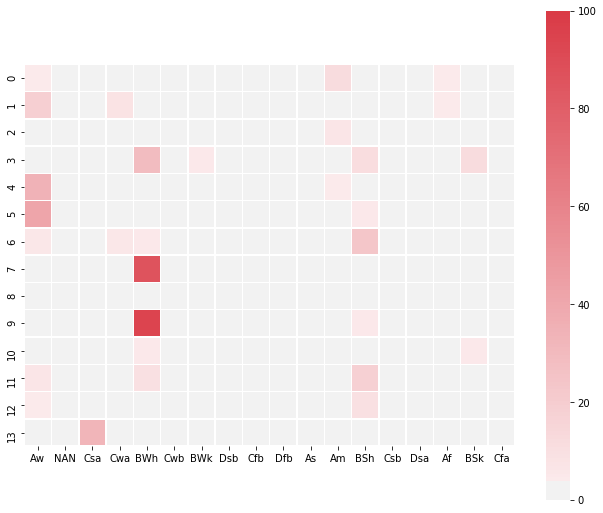

In [67]:
x_axis_labels = list(set(class_air)) # labels for x-axis

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(240,10,as_cmap=True)
#cmap = sns.diverging_palette(150, 275, s=80, l=55, n=9,as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(similarity,cmap=cmap, vmax=100, center=0,
            square=True, linewidths=.5, xticklabels=x_axis_labels)

In [68]:
np.save("similarity14.npy",similarity)

In [69]:
np.save("x_axis_labels14.npy",x_axis_labels)

In [91]:
import pulp as p
import re

In [75]:
#w = 3*np.random.randn(3,3) + 7

In [92]:
w = similarity

In [93]:
prob = p.LpProblem("ClusterAssigment", p.LpMaximize)

In [94]:
n = w.shape[0]

In [95]:
assign_vars = p.LpVariable.dicts("X",
                                 [(i, j) for i in range(n)
                                  for j in range(n)],
                                 0, 1, p.LpBinary)

In [96]:
prob += p.lpSum(w[i,j] * assign_vars[i,j] for i in range(n) for j in range(n))

In [97]:
for j in range(n):
    prob += p.lpSum(assign_vars[i,j] for i in range(n)) <= 1

In [98]:
for i in range(n):
    prob += p.lpSum(assign_vars[i,j] for j in range(n)) <= 1

In [99]:
prob.solve()

1

In [66]:
for v in prob.variables():
    print(v.name,v.value())

X_(0,_0) 0.0
X_(0,_1) 0.0
X_(0,_10) 0.0
X_(0,_11) 1.0
X_(0,_12) 0.0
X_(0,_13) 0.0
X_(0,_14) 0.0
X_(0,_15) 0.0
X_(0,_16) 0.0
X_(0,_2) 0.0
X_(0,_3) 0.0
X_(0,_4) 0.0
X_(0,_5) 0.0
X_(0,_6) 0.0
X_(0,_7) 0.0
X_(0,_8) 0.0
X_(0,_9) 0.0
X_(1,_0) 1.0
X_(1,_1) 0.0
X_(1,_10) 0.0
X_(1,_11) 0.0
X_(1,_12) 0.0
X_(1,_13) 0.0
X_(1,_14) 0.0
X_(1,_15) 0.0
X_(1,_16) 0.0
X_(1,_2) 0.0
X_(1,_3) 0.0
X_(1,_4) 0.0
X_(1,_5) 0.0
X_(1,_6) 0.0
X_(1,_7) 0.0
X_(1,_8) 0.0
X_(1,_9) 0.0
X_(10,_0) 0.0
X_(10,_1) 0.0
X_(10,_10) 0.0
X_(10,_11) 0.0
X_(10,_12) 0.0
X_(10,_13) 1.0
X_(10,_14) 0.0
X_(10,_15) 0.0
X_(10,_16) 0.0
X_(10,_2) 0.0
X_(10,_3) 0.0
X_(10,_4) 0.0
X_(10,_5) 0.0
X_(10,_6) 0.0
X_(10,_7) 0.0
X_(10,_8) 0.0
X_(10,_9) 0.0
X_(11,_0) 0.0
X_(11,_1) 0.0
X_(11,_10) 0.0
X_(11,_11) 0.0
X_(11,_12) 0.0
X_(11,_13) 0.0
X_(11,_14) 0.0
X_(11,_15) 0.0
X_(11,_16) 0.0
X_(11,_2) 0.0
X_(11,_3) 0.0
X_(11,_4) 0.0
X_(11,_5) 0.0
X_(11,_6) 0.0
X_(11,_7) 0.0
X_(11,_8) 0.0
X_(11,_9) 0.0
X_(12,_0) 0.0
X_(12,_1) 0.0
X_(12,_10) 1.0
X_(12,_11) 

In [100]:
result = np.zeros((len(set(clusters_air)),len(set(class_air))))
aggregating_points = 0
for v in prob.variables():
    string  = str(v.name)
    r = re.findall(r"\w+",string)
    i = int(r[1])
    j = int(r[2][1:])
    if v.value() == 1: 
        aggregating_points += similarity[i,j]
    result[i,j] = v.value()

In [101]:
aggregating_points

241.0

In [116]:
np.save("x_axis_labels.npy",x_axis_labels)

In [107]:
n_points = np.sum(similarity)

In [108]:
aggregating_points/n_points

0.4126712328767123

In [42]:
df_class.groupby("clusters").count()

,lons,lats
clusters,,
Af,10,10
Am,26,26
As,3,3
Aw,118,118
BSh,78,78
BSk,19,19
BWh,232,232
BWk,12,12
Cfa,4,4


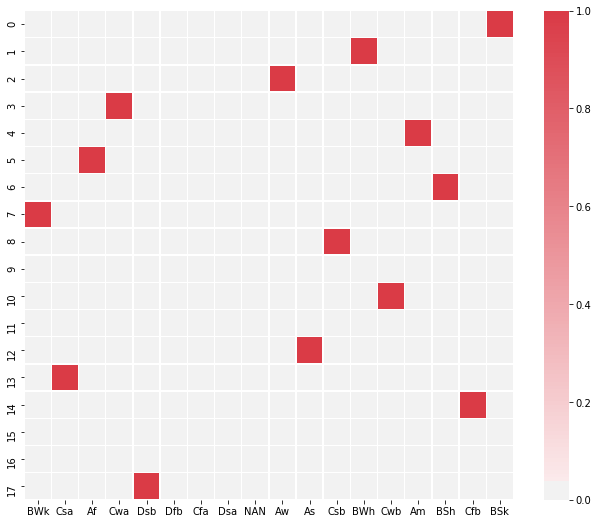

In [104]:
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(240,10,as_cmap=True)
#cmap = sns.diverging_palette(150, 275, s=80, l=55, n=9,as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(result,cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, xticklabels=x_axis_labels)

# Deseasonalized Data using matrix norm:

In [108]:
d = Data('GPCC_half.nc','precip',temporal_limits, missing_value=-9.969209968386869e+36)

result = d.get_data()
lon_list = d.get_lon_list()
lat_list = d.get_lat_list()
lon = d.get_lon()
lat = d.get_lat()

d = Data('air_monthly_mean_africa.nc','air', missing_value=-9.96921e+36)

result_air = d.get_data()
lon_list_air = d.get_lon_list()
lat_list_air = d.get_lat_list()
lon_air = d.get_lon()
lat_air = d.get_lat()

In [87]:
result = pf.deseasonalize(np.array(result))
result_air = pf.deseasonalize(np.array(result_air))

In [9]:
air_list = list(zip(lon_list_air,lat_list_air))

pre_list = list(zip(lon_list,lat_list))

clean_list = []
index = []
for i in range(len(air_list)):
    temp = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])
    if temp.shape:
    #if not np.isnan(temp):
        clean_list.append(temp)
        index.append(i)
    #data[:,i,1] = np.squeeze(result_air[:,i])
    #data[:,i,0] = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])

In [10]:
data = np.zeros((result_air.shape[0],len(clean_list),2))

for i in range(len(clean_list)):

    data[:,i,1] = np.squeeze(result_air[:,index[i]])
    data[:,i,0] = clean_list[i]

distance = np.zeros((data.shape[1],data.shape[1]))

for i in range(data.shape[1]):
    for j in range(data.shape[1]):
        distance[i,j] = LA.norm(data[:,i,:]-data[:,j,:])


In [11]:
clustering = AgglomerativeClustering(n_clusters=n_components,affinity="precomputed",linkage="complete").fit(distance)

clusters_air = np.zeros(len(lon_list_air))
clusters_air.fill(-1)

clusters_air[index] = clustering.labels_ 

index = np.argwhere(clusters_air == -1)

clusters_air = np.delete(clusters_air, index)
lat_list_air = np.delete(lat_list_air, index)
lon_list_air = np.delete(lon_list_air, index)

df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clusters_air})

lon_temp = df_air["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_air["lons"] = lon_temp

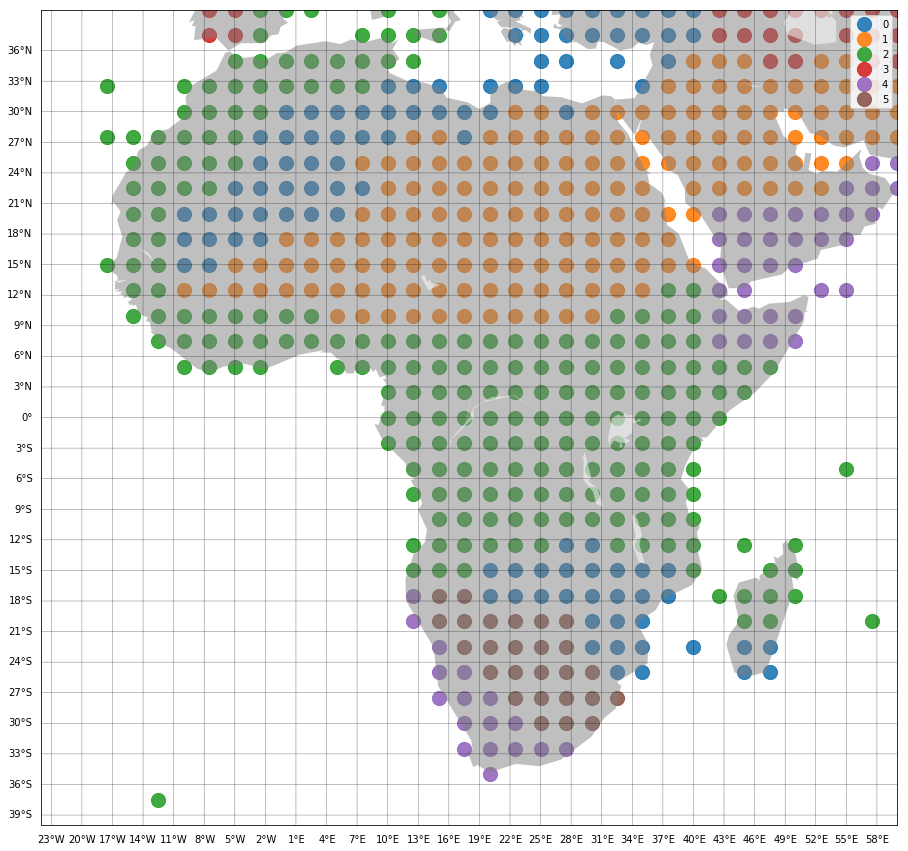

In [12]:
df_list = []
for j in range(len(set(clusters_air))):
    df_list.append(pd.DataFrame(columns=df_air.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
#m.drawcoastlines()
#colors = pf.random_color_1(n_components)

i = 0
for j in set(clusters_air):
    values = df_air["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df_air.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=200, label = i)
    i+=1

    
plt.legend()
plt.show()

# Deseasonalized Data using vector euclidean distance:

In [108]:
n_components = 15
level = 12
temporal_limits = {"time_min":datetime(1948, 1, 1, 0, 0),"time_max":datetime(2016, 1, 1, 0, 0) } 
spatial_limits = {"lon_min":-40,"lon_max":60,"lat_min":-40,"lat_max":40}

In [109]:
d = Data('GPCC_half.nc','precip',temporal_limits, missing_value=-9.969209968386869e+36)

result = d.get_data()
lon_list = d.get_lon_list()
lat_list = d.get_lat_list()
lon = d.get_lon()
lat = d.get_lat()

In [110]:
d = Data('air_monthly_mean_africa.nc','air', missing_value=-9.96921e+36)

result_air = d.get_data()
lon_list_air = d.get_lon_list()
lat_list_air = d.get_lat_list()
lon_air = d.get_lon()
lat_air = d.get_lat()

In [113]:
# You can load it
result = pf.transform(result)
result = pf.deseasonalize(np.array(result))

NameError: name 'result' is not defined

In [111]:
result_air = pf.deseasonalize(np.array(result_air))

In [28]:
np.save("result_deseasonalized.npy",result)

In [150]:
result = np.load("result_deseasonalized.npy")

In [112]:
result = np.load("spi1_half_48_16.npy")

In [44]:
result = np.nan_to_num(result)

In [113]:
air_list = list(zip(lon_list_air,lat_list_air))

pre_list = list(zip(lon_list,lat_list))

clean_list = []
Idx = []
for i in range(len(air_list)):
    temp = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])
    if temp.shape:
    #if not np.isnan(temp):
        clean_list.append(temp)
        Idx.append(i)
    #data[:,i,1] = np.squeeze(result_air[:,i])
    #data[:,i,0] = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])

In [114]:
precipitation = np.array(clean_list)#/np.array(clean_list).std()
precipitation = pd.DataFrame(np.transpose(precipitation))

result_air = pd.DataFrame(result_air)
temperature = result_air.iloc[:,Idx]

#temperature = temperature/temperature.stack().std()

precipitation.columns = temperature.columns

combined_vertically = pd.concat([temperature,precipitation],ignore_index=True,sort=False, axis=0)

In [115]:
clustering = AgglomerativeClustering(n_clusters=n_components).fit(combined_vertically.transpose())

In [116]:
clusters_air = np.zeros(len(lon_list_air))
clusters_air.fill(-1)

clusters_air[Idx] = clustering.labels_ 

index = np.argwhere(clusters_air == -1)

clusters_air = np.delete(clusters_air, index)
lat_list_air = np.delete(lat_list_air, index)
lon_list_air = np.delete(lon_list_air, index)

df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clusters_air})

lon_temp = df_air["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_air["lons"] = lon_temp

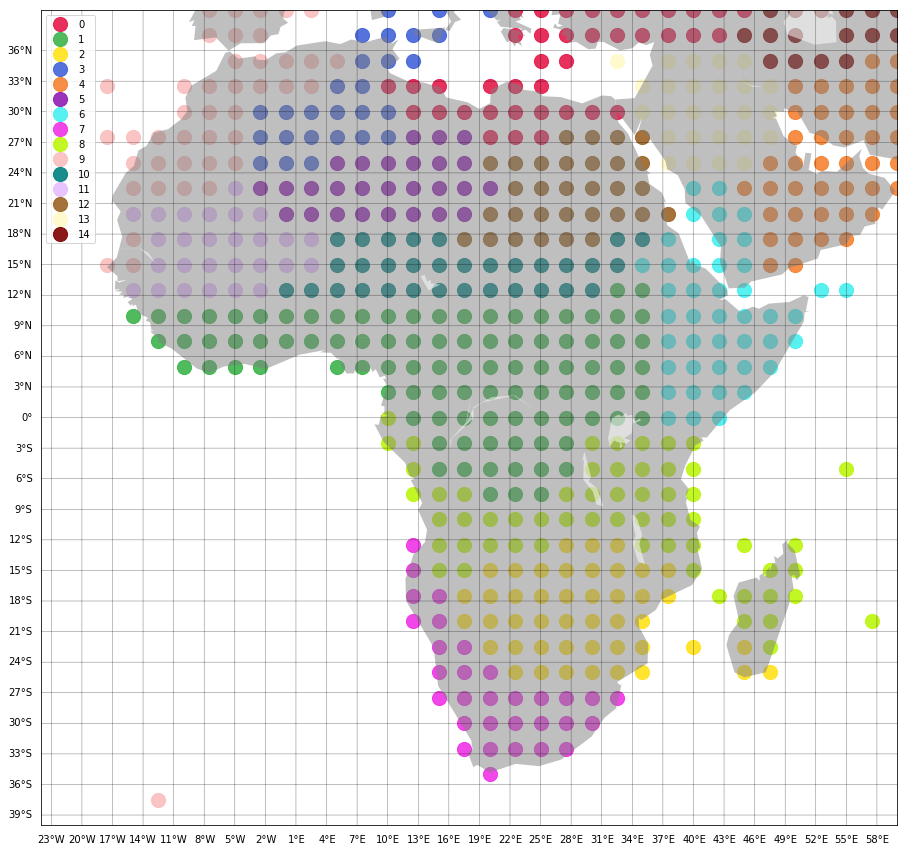

In [117]:
df_list = []
for j in range(len(set(clusters_air))):
    df_list.append(pd.DataFrame(columns=df_air.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
#m.drawcoastlines()
#colors = pf.random_color_1(n_components)
colors = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', 
'#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', 
'#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000']

i = 0
for j in set(clusters_air):
    values = df_air["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df_air.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=200, label = i, c = colors[i] )
    i+=1

    
plt.legend()
plt.show()

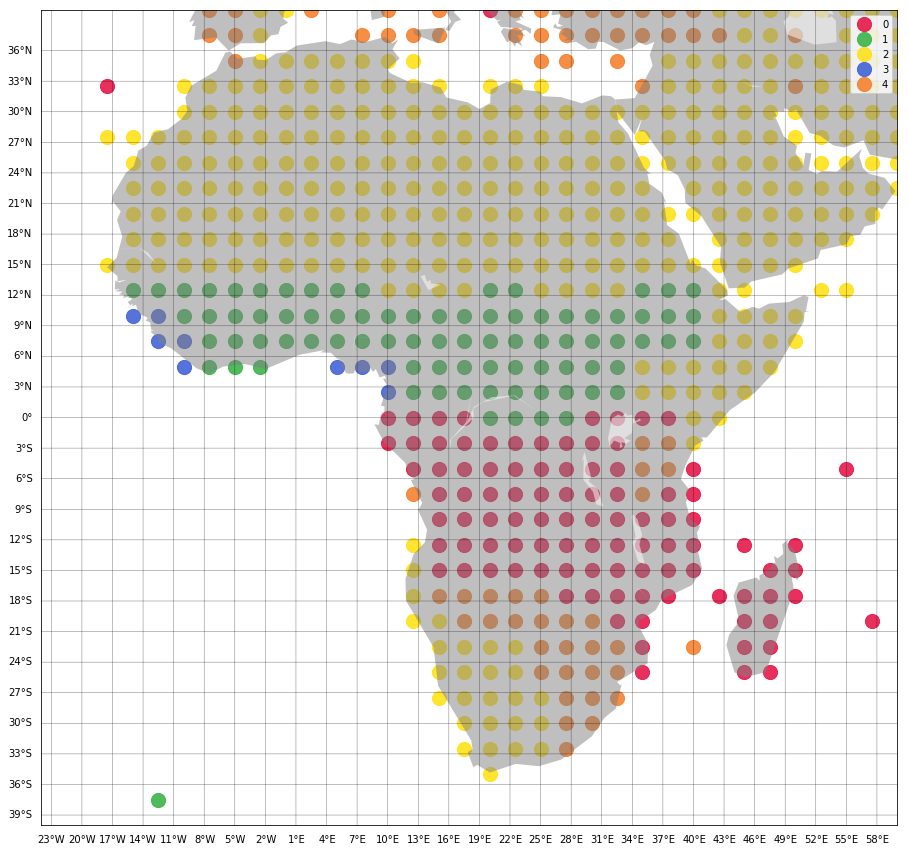

In [156]:
df_list = []
for j in range(len(set(clusters_air))):
    df_list.append(pd.DataFrame(columns=df_air.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
#m.drawcoastlines()
#colors = pf.random_color_1(n_components)
colors = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', 
'#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', 
'#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000']

i = 0
for j in set(clusters_air):
    values = df_air["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df_air.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=200, label = i, c = colors[i] )
    i+=1

    
plt.legend()
plt.show()

In [144]:
metrics.calinski_harabaz_score(X, clusters_air)

20.274960563616848

In [142]:
X = combined_vertically.transpose()



AttributeError: module 'sklearn.metrics' has no attribute 'calinski_harabasz_score'

In [148]:
X = combined_vertically.transpose()
range_n_clusters = np.arange(2,19)
ch = []

for n_clusters in range_n_clusters:
    clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(X)
    ch.append(metrics.calinski_harabaz_score(X, clustering.labels_))

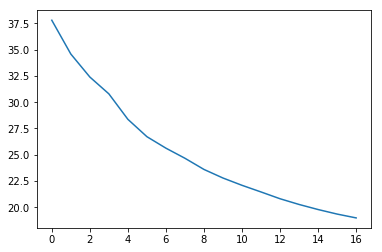

In [149]:
plt.plot(ch)

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.05997496756917936
For n_clusters = 3 The average silhouette_score is : 0.07177192971431832
For n_clusters = 4 The average silhouette_score is : 0.08581181603717364
For n_clusters = 5 The average silhouette_score is : 0.08842933538845053
For n_clusters = 6 The average silhouette_score is : 0.08894474218209873
For n_clusters = 7 The average silhouette_score is : 0.08472678336379036
For n_clusters = 8 The average silhouette_score is : 0.08921122565904122
For n_clusters = 9 The average silhouette_score is : 0.08218109480730389
For n_clusters = 10 The average silhouette_score is : 0.08311380936198566
For n_clusters = 11 The average silhouette_score is : 0.08349842703700544
For n_clusters = 12 The average silhouette_score is : 0.08692287009433967
For n_clusters = 13 The average silhouette_score is : 0.08389705519502207
For n_clusters = 14 The average silhouette_score is : 0

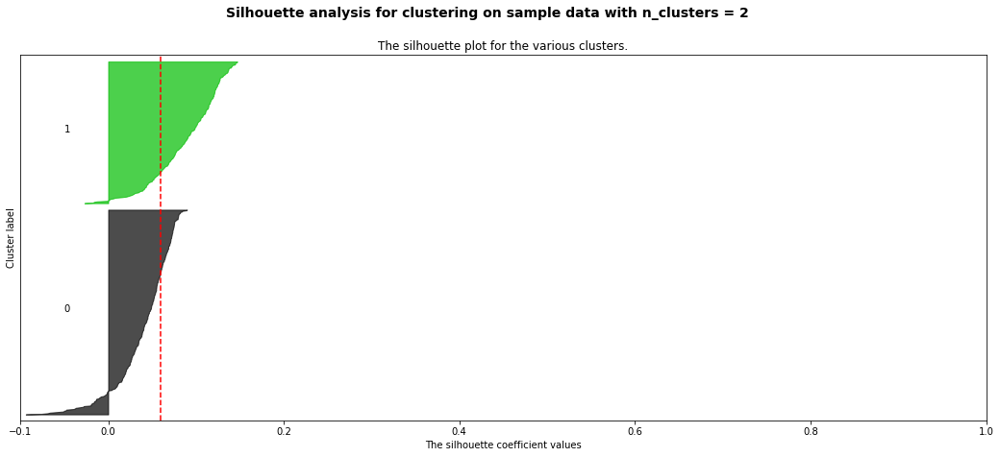

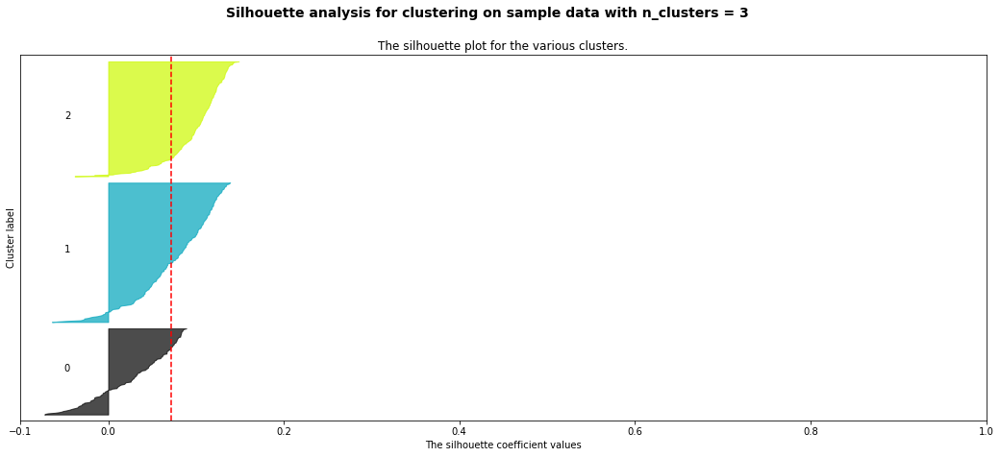

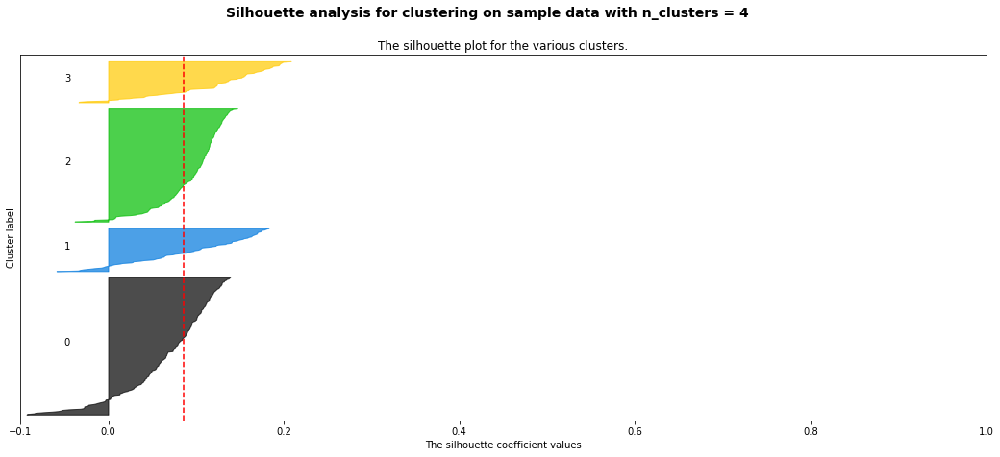

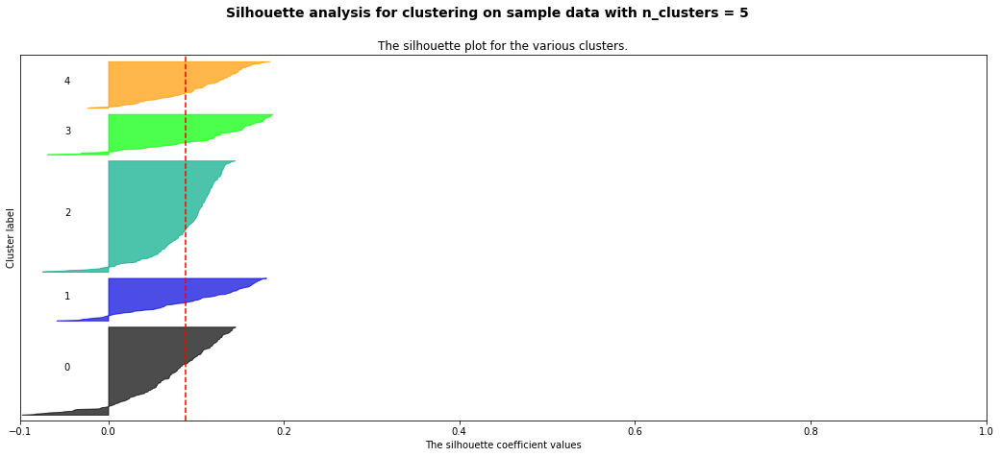

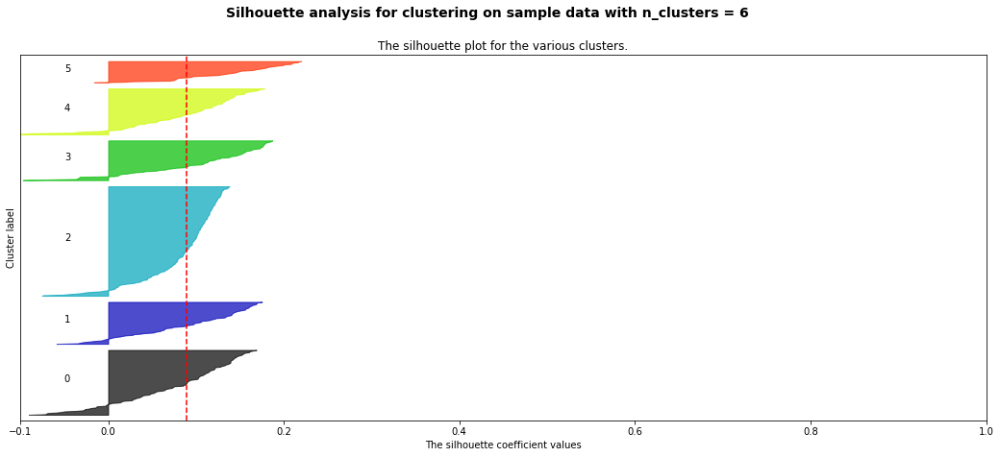

...

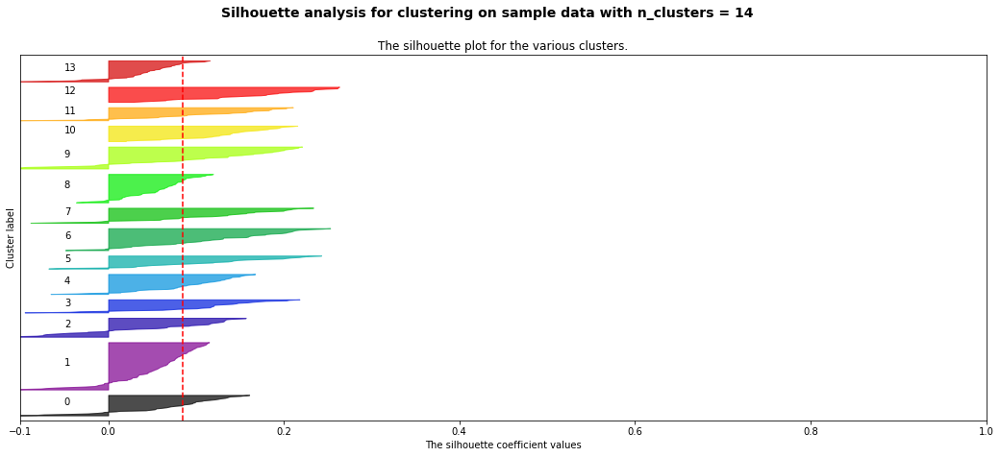

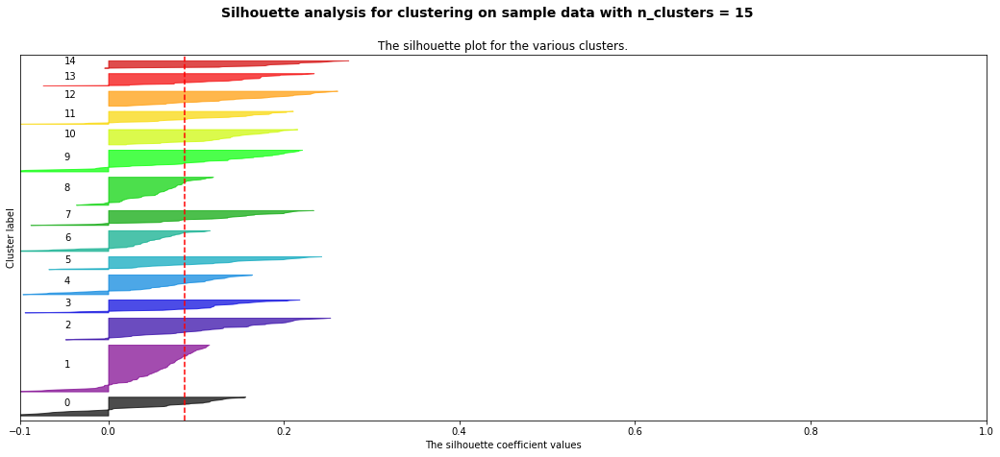

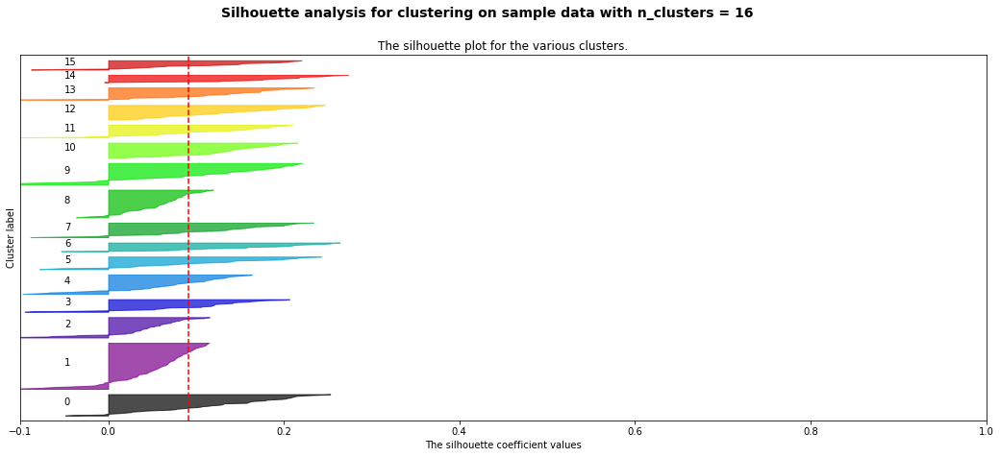

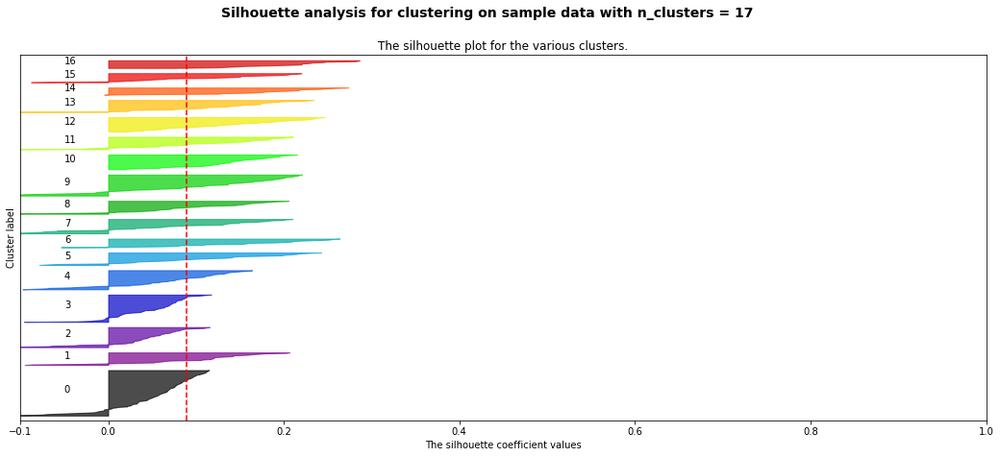

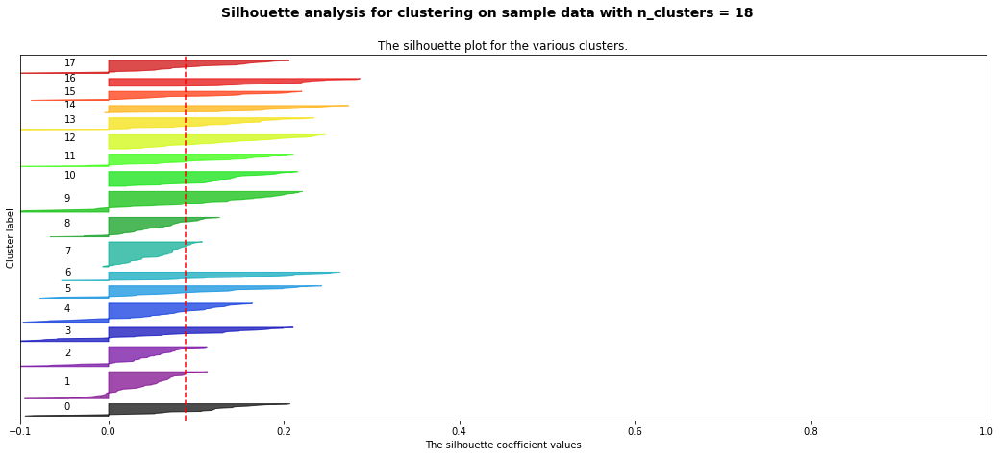

In [137]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X, y = make_blobs(n_samples=500,
                  n_features=2,
                  centers=4,
                  cluster_std=1,
                  center_box=(-10.0, 10.0),
                  shuffle=True,
                  random_state=1)  # For reproducibility

X = combined_vertically.transpose()

range_n_clusters = np.arange(2,19)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    #clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    clusterer = AgglomerativeClustering(n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(X)

    
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    #ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
    #            c=colors, edgecolor='k')

    # Labeling the clusters
   # centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    #ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
    #            c="white", alpha=1, s=200, edgecolor='k')

    #for i, c in enumerate(centers):
    #    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
    #                s=50, edgecolor='k')

    #ax2.set_title("The visualization of the clustered data.")
    #ax2.set_xlabel("Feature space for the 1st feature")
    #ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [122]:
cluster_data = []
for i in range(n_components):
    Idx = np.where((df_air.clusters == i).values)[0]
    temp = temperature.iloc[:,Idx]
    pre = precipitation.iloc[:,Idx]
    #r = pf.deseasonalize(np.array(r))
    combined_horizontally = pd.concat([temp,pre],ignore_index=True,sort=False, axis=1)
    scale = StandardScaler()
    scaled_data = scale.fit_transform(combined_horizontally)
    pca = PCA(n_components=n_components)
    pca_model = pca.fit(combined_horizontally)
    #print(pca_model.explained_variance_ratio_[0])
    pca_data = pca_model.transform(combined_horizontally)
    cluster_data.append(pca_data[:,0])

df_cluster = pd.DataFrame(np.transpose(np.matrix(cluster_data)))

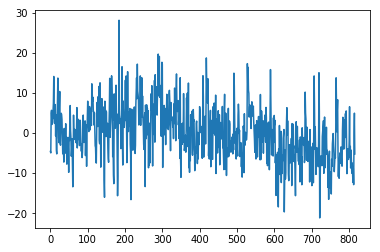

In [126]:
plt.plot(df_cluster.iloc[:,4])

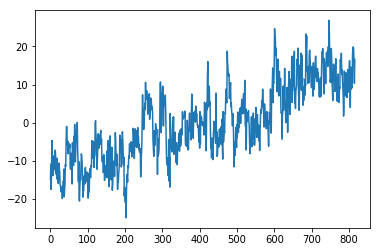

In [124]:
plt.plot(df_cluster.iloc[:,3])

In [123]:
adfuller(df_cluster.iloc[:,3])

(-22.744609362520546,
 0.0,
 0,
 816,
 {'1%': -3.4383892038884722,
  '10%': -2.568659512747501,
  '5%': -2.8650884667384955},
 4502.985409578847)

In [124]:
df_cluster

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,11.095269,-8.688882,9.258493,2.989490,-0.299553,1.131230,-8.318324,1.839973,-9.416621,-0.622667,0.592595,-3.699940,-4.511527,-5.561192,4.178651
1,1.935026,-7.402742,5.312279,2.709291,-2.589497,0.259576,-2.636499,0.169518,-7.379666,-5.383481,1.009921,0.471046,-2.432014,-2.243890,4.697618
2,-8.868347,-12.315302,8.084396,-3.013809,0.684885,-6.539915,-6.319068,6.723040,-10.490398,-4.140387,4.212294,-2.175696,5.468570,5.821059,-0.306743
3,-2.025046,-8.285004,4.691675,1.915516,2.786779,5.045677,-3.372384,-1.729809,-10.201284,3.904356,-4.859817,-1.119582,-6.472062,3.172785,-4.820771
4,3.528405,-2.094042,3.061621,1.425424,1.136137,5.187007,0.452905,0.417487,-5.829139,4.358691,-4.590282,1.995100,-2.538425,3.502314,4.115672
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
812,11.013766,14.406520,-4.504210,4.035229,-1.063051,7.748294,10.698081,-3.080065,9.905147,-0.721067,-4.848179,3.668825,-9.669742,-10.438135,1.678916
813,6.875735,12.543598,-5.934260,5.370444,-9.242473,4.654571,12.971507,-9.203795,9.163278,-4.999727,-4.630402,6.449069,-4.068056,-8.578472,0.102707
814,4.883930,9.753888,-1.030312,1.165488,-1.094708,-4.218207,9.191927,0.996310,8.386061,-4.485951,1.733843,-1.169990,1.508085,-1.254908,-1.418055
815,0.406320,-0.013032,-7.725345,3.793431,2.040850,-7.980926,8.290617,-10.375205,11.092730,-10.505501,12.697660,-3.132039,8.483377,3.129503,-0.958410


In [130]:
var_names = df_cluster.columns

#pca_data = pca_model.transform(data)
#pca_data = result.dot(loading)
pca_data = np.matrix(df_cluster)

dataframe = pp.DataFrame(pca_data,var_names=var_names)
cond_ind_test = ParCorr()
pcmci = PCMCI(dataframe=dataframe, cond_ind_test=cond_ind_test)

In [131]:
results = pcmci.run_pcmci(tau_max=2, pc_alpha=None)
pcmci.print_significant_links(p_matrix=results['p_matrix'],
                                     val_matrix=results['val_matrix'],
                                     alpha_level=0.05)


## Significant links at alpha = 0.05:

    Variable 0 has 11 link(s):
        (13 0): pval = 0.00000 | val = -0.631
        (12 0): pval = 0.00000 | val = -0.601
        (5 0): pval = 0.00000 | val = 0.495
        (3 0): pval = 0.00000 | val = 0.424
        (14 0): pval = 0.00000 | val = 0.340
        (0 -1): pval = 0.00000 | val = 0.272
        (10 0): pval = 0.00000 | val = -0.252
        (11 0): pval = 0.00000 | val = 0.176
        (9 -1): pval = 0.00003 | val = -0.148
        (4 0): pval = 0.00434 | val = -0.101
        (1 -1): pval = 0.01358 | val = -0.087

    Variable 1 has 14 link(s):
        (1 -1): pval = 0.00000 | val = 0.494
        (8 0): pval = 0.00000 | val = 0.329
        (11 0): pval = 0.00000 | val = 0.279
        (6 0): pval = 0.00000 | val = 0.218
        (10 0): pval = 0.00000 | val = -0.210
        (2 0): pval = 0.00008 | val = -0.139
        (4 0): pval = 0.00085 | val = -0.118
        (13 -1): pval = 0.00318 | val = 0.104
        (8 -2): pval = 0.01616 | val = 

(<Figure size 2160x1080 with 3 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f95f530cb38>)

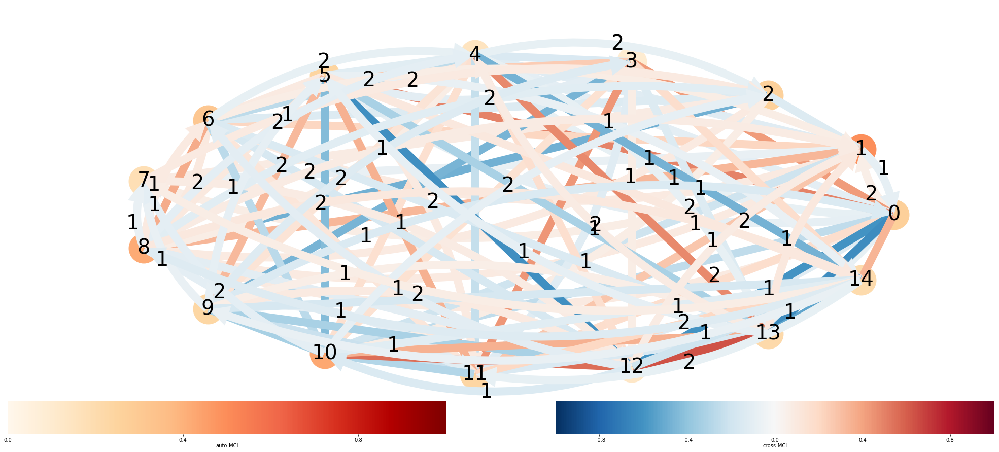

In [132]:
link_matrix = pcmci.return_significant_parents(pq_matrix=results['p_matrix'],
                        val_matrix=results['val_matrix'], alpha_level=0.05)['link_matrix']


tp.plot_graph(
    val_matrix=results['val_matrix'],
    link_matrix=link_matrix,
    link_colorbar_label='cross-MCI',
    node_colorbar_label='auto-MCI',figsize=(30,15),
    node_label_size=40,
    link_label_fontsize = 40,
    node_size = 60,
    arrow_linewidth = 80
    )

In [135]:
q_matrix = pcmci.get_corrected_pvalues(p_matrix=results['p_matrix'], fdr_method='fdr_bh')
pcmci.print_significant_links(
        p_matrix = results['p_matrix'], 
        q_matrix = q_matrix,
        val_matrix = results['val_matrix'],
        alpha_level = 0.01)

link_matrix = pcmci.return_significant_parents(pq_matrix=q_matrix,
                        val_matrix=results['val_matrix'], alpha_level=0.01)['link_matrix']




## Significant links at alpha = 0.01:

    Variable 0 has 10 link(s):
        (13 0): pval = 0.00000 | qval = 0.00000 | val = -0.631
        (12 0): pval = 0.00000 | qval = 0.00000 | val = -0.601
        (5 0): pval = 0.00000 | qval = 0.00000 | val = 0.495
        (3 0): pval = 0.00000 | qval = 0.00000 | val = 0.424
        (14 0): pval = 0.00000 | qval = 0.00000 | val = 0.340
        (0 -1): pval = 0.00000 | qval = 0.00000 | val = 0.272
        (10 0): pval = 0.00000 | qval = 0.00000 | val = -0.252
        (11 0): pval = 0.00000 | qval = 0.00000 | val = 0.176
        (9 -1): pval = 0.00003 | qval = 0.00084 | val = -0.148
        (4 0): pval = 0.00434 | qval = 0.00434 | val = -0.101

    Variable 1 has 7 link(s):
        (1 -1): pval = 0.00000 | qval = 0.00000 | val = 0.494
        (8 0): pval = 0.00000 | qval = 0.00000 | val = 0.329
        (11 0): pval = 0.00000 | qval = 0.00000 | val = 0.279
        (6 0): pval = 0.00000 | qval = 0.00000 | val = 0.218
        (10 0): pval = 0.00000

(<Figure size 2160x1080 with 3 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f95f4eb86a0>)

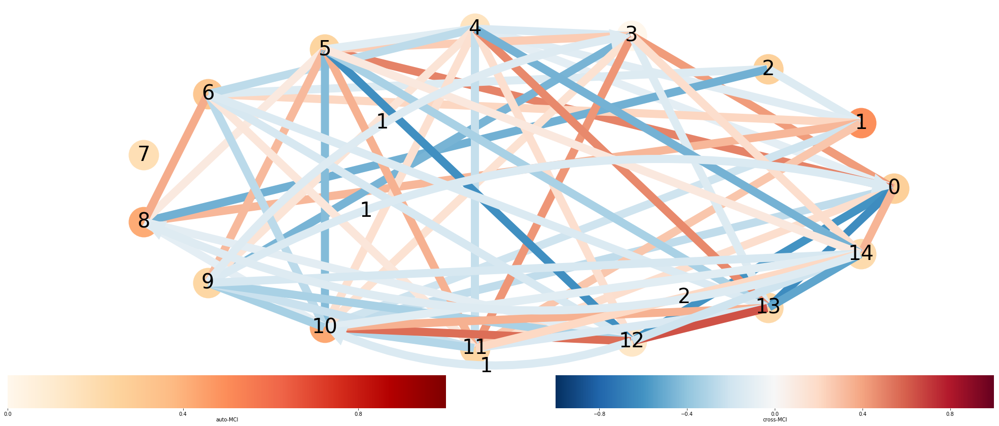

In [136]:
tp.plot_graph(
    val_matrix=results['val_matrix'],
    link_matrix=link_matrix,
    link_colorbar_label='cross-MCI',
    node_colorbar_label='auto-MCI',figsize=(30,15),
    node_label_size=40,
    link_label_fontsize = 40,
    node_size = 60,
    arrow_linewidth = 80
    )

In [14]:
#temp = pf.deseasonalize(np.transpose(result))
temp = np.array(result_air)
#temp = pf.deseasonalize(result)
clustering_air = AgglomerativeClustering(n_clusters=n_components).fit(np.transpose(temp))

In [17]:
clusters_air = clustering_air.labels_

In [15]:
df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clustering_air.labels_})

lon_temp = df_air["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_air["lons"] = lon_temp

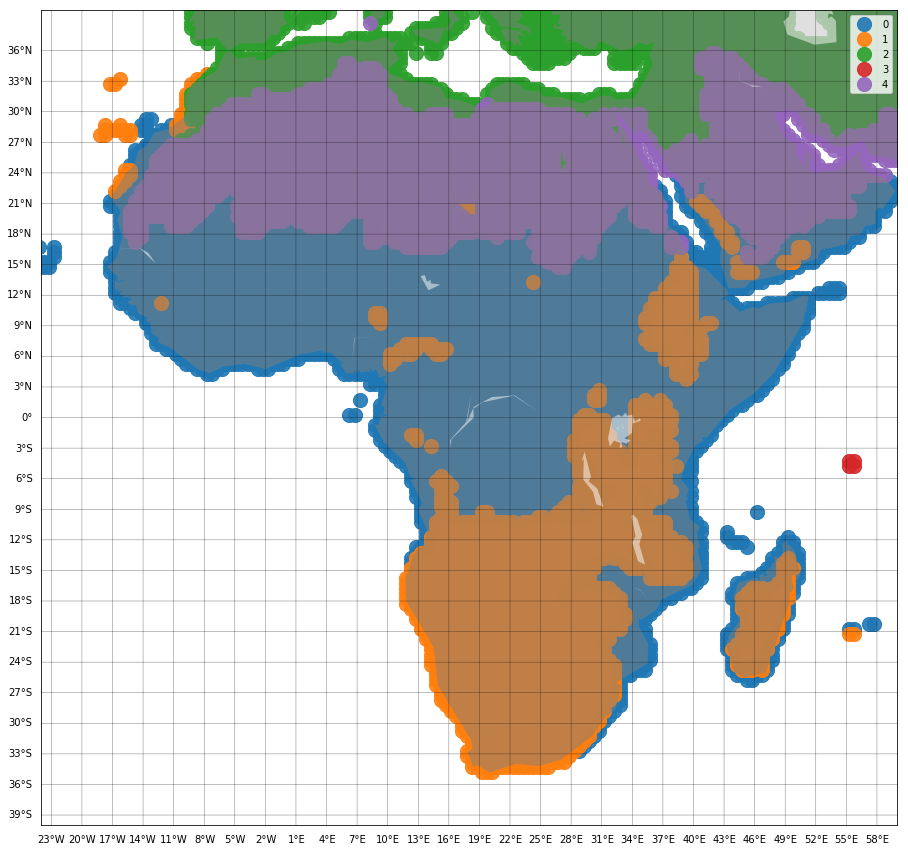

In [18]:
df_list = []
for j in range(len(set(clusters_air))):
    df_list.append(pd.DataFrame(columns=df_air.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
#m.drawcoastlines()
#colors = pf.random_color_1(n_components)

i = 0
for j in set(clusters_air):
    values = df_air["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df_air.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=200, label = i)
    i+=1

    
plt.legend()
plt.show()

In [ ]:
data = np.zeros((result_air.shape[0],result_air.shape[1],2))

N = result_air.shape[1]

for i in range(len(air_list)):
    if air_list[i] in pre_list:
        j = pre_list.index(air_list[i])
        data[:,i,1] = np.squeeze(result_air[:,i] - 273.15)
        data[:,i,0] = np.squeeze(result[:,j])

In [41]:
air_list = list(zip(lon_list_air,lat_list_air))

In [42]:
pre_list = list(zip(lon_list,lat_list))

In [43]:
clean_list = []
index = []
for i in range(len(air_list)):
    temp = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])
    if temp.shape:
    #if not np.isnan(temp):
        clean_list.append(temp)
        index.append(i)
    #data[:,i,1] = np.squeeze(result_air[:,i])
    #data[:,i,0] = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])

# First Version:

In [22]:
data = np.zeros((result_air.shape[0],len(clean_list),2))

for i in range(len(clean_list)):

    data[:,i,1] = np.squeeze(result_air[:,index[i]])
    data[:,i,0] = clean_list[i]

In [23]:
distance = np.zeros((data.shape[1],data.shape[1]))

In [24]:
for i in range(data.shape[1]):
    for j in range(data.shape[1]):
        distance[i,j] = LA.norm(data[:,i,:]-data[:,j,:])

In [25]:
clustering = AgglomerativeClustering(n_clusters=15,affinity="precomputed",linkage="complete").fit(distance)

In [26]:
clusters_air = np.zeros(len(lon_list_air))
clusters_air.fill(-1)

In [27]:
clusters_air[index] = clustering.labels_ 

In [28]:
index = np.argwhere(clusters_air == -1)

clusters_air = np.delete(clusters_air, index)
lat_list_air = np.delete(lat_list_air, index)
lon_list_air = np.delete(lon_list_air, index)

df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clusters_air})

lon_temp = df_air["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_air["lons"] = lon_temp

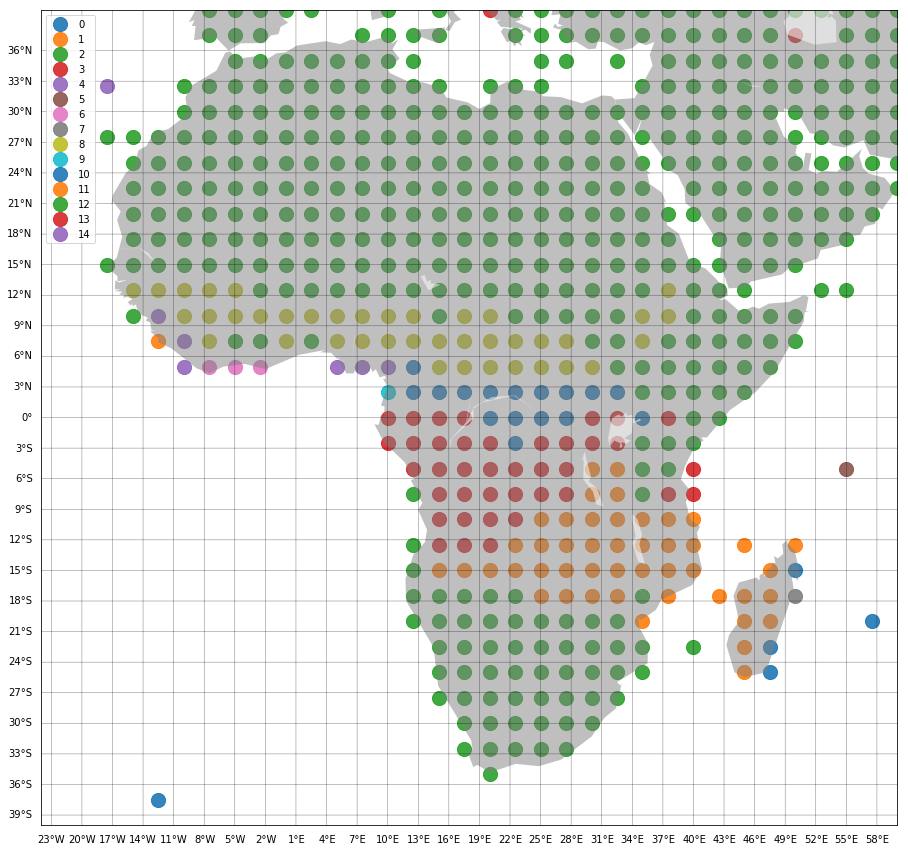

In [29]:
df_list = []
for j in range(len(set(clusters_air))):
    df_list.append(pd.DataFrame(columns=df_air.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
#m.drawcoastlines()
#colors = pf.random_color_1(n_components)

i = 0
for j in set(clusters_air):
    values = df_air["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df_air.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=200, label = i)
    i+=1

    
plt.legend()
plt.show()

# Second Version

In [56]:
air_list = list(zip(lon_list_air,lat_list_air))

pre_list = list(zip(lon_list,lat_list))

clean_list = []
Idx = []
for i in range(len(air_list)):
    temp = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])
    if temp.shape:
    #if not np.isnan(temp):
        clean_list.append(temp)
        Idx.append(i)
    #data[:,i,1] = np.squeeze(result_air[:,i])
    #data[:,i,0] = neighbour_average(pre_list,pd.DataFrame(result),air_list[i][0], air_list[i][1])

In [57]:
precipitation = np.array(clean_list)/np.array(clean_list).std()
precipitation = pd.DataFrame(np.transpose(precipitation))

In [58]:
result_air = pd.DataFrame(result_air)
temperature = result_air.iloc[:,Idx]

In [59]:
temperature = temperature/temperature.stack().std()

In [60]:
precipitation.columns = temperature.columns

In [61]:
combined_vertically = pd.concat([temperature,precipitation],ignore_index=True,sort=False, axis=0)

In [171]:
data = np.zeros((result_air.shape[0] * 2,len(clean_list)))
result = pd.DataFrame(result_air)
first = result.iloc[:,index].values
for i in range(len(clean_list)):
    first = result.iloc[:,i].values
    second = clean_list[i,:]
    first /= first.std()
    second /= second.std()
    data[:,i] = np.array(list(first) + list(second))

In [62]:
#temp = pf.deseasonalize(np.transpose(result))
#temp = np.array(data)
#temp = pf.deseasonalize(result)
clustering = AgglomerativeClustering(n_clusters=5).fit(combined_vertically.transpose())

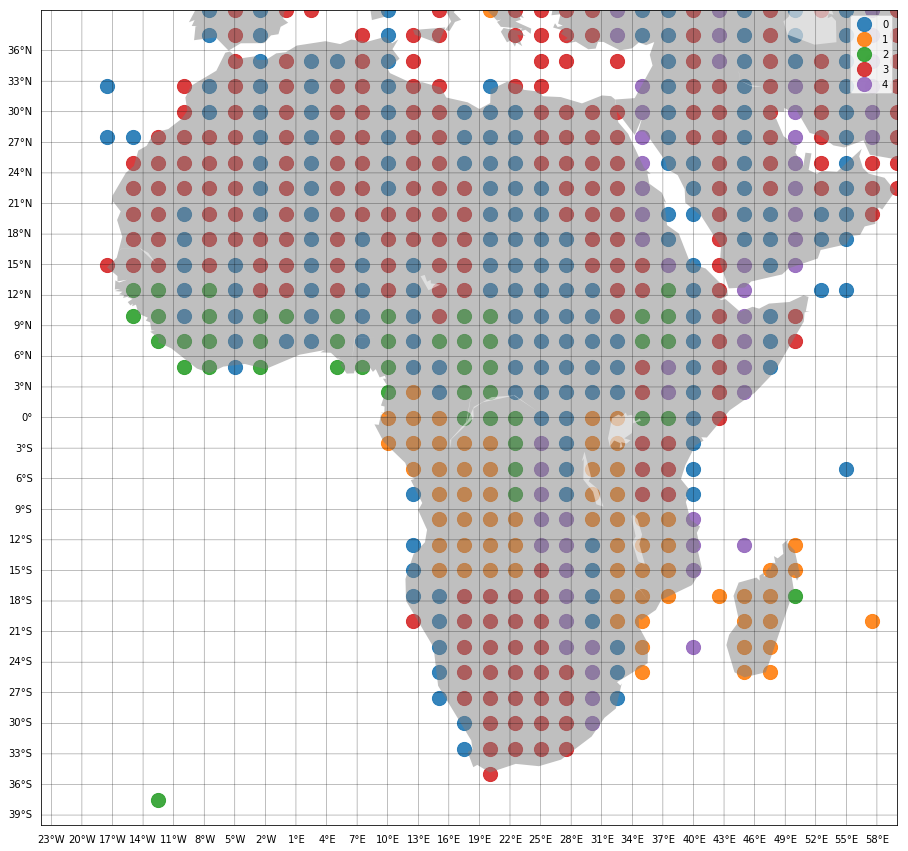

In [63]:
clusters_air = np.zeros(len(lon_list_air))
clusters_air.fill(-1)

clusters_air[Idx] = clustering.labels_ 

index = np.argwhere(clusters_air == -1)

clusters_air = np.delete(clusters_air, index)
lat_list_air = np.delete(lat_list_air, index)
lon_list_air = np.delete(lon_list_air, index)

df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clusters_air})

lon_temp = df_air["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_air["lons"] = lon_temp

df_list = []
for j in range(len(set(clusters_air))):
    df_list.append(pd.DataFrame(columns=df_air.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
#m.drawcoastlines()
#colors = pf.random_color_1(n_components)

i = 0
for j in set(clusters_air):
    values = df_air["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df_air.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=200, label = i)
    i+=1

    
plt.legend()
plt.show()

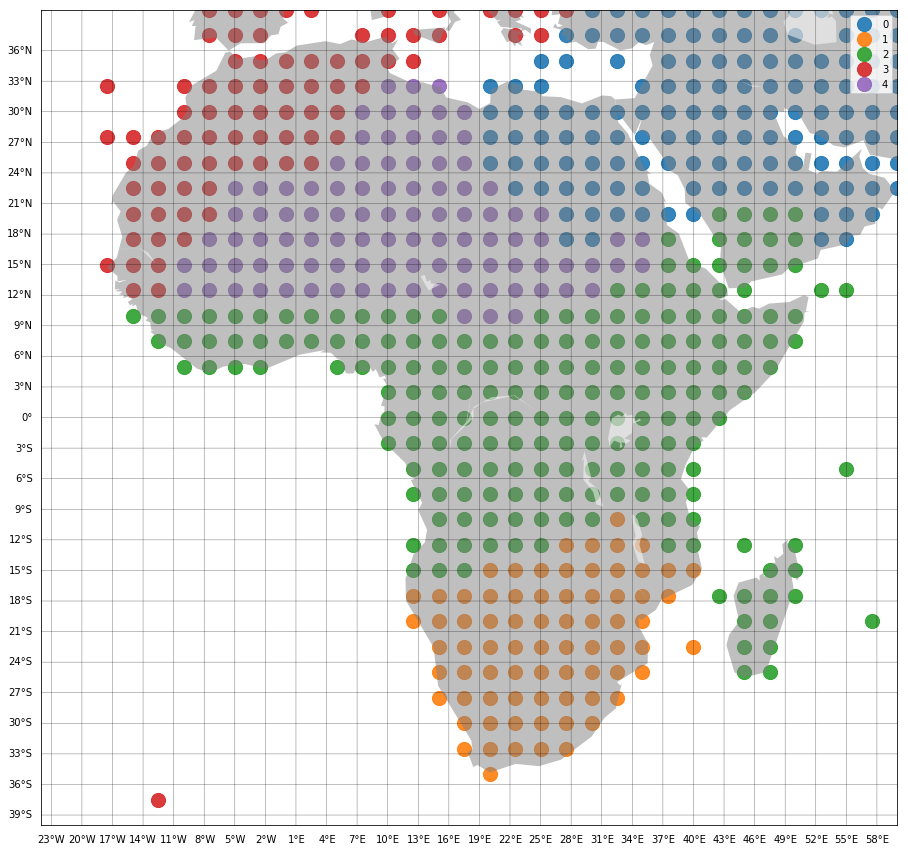

In [59]:
clusters_air = np.zeros(len(lon_list_air))
clusters_air.fill(-1)

clusters_air[Idx] = clustering.labels_ 

index = np.argwhere(clusters_air == -1)

clusters_air = np.delete(clusters_air, index)
lat_list_air = np.delete(lat_list_air, index)
lon_list_air = np.delete(lon_list_air, index)

df_air = pd.DataFrame({"lons":lon_list_air,"lats":lat_list_air,"clusters":clusters_air})

lon_temp = df_air["lons"].values
lon_temp[lon_temp > 180] = lon_temp[lon_temp > 180] -360
df_air["lons"] = lon_temp

df_list = []
for j in range(len(set(clusters_air))):
    df_list.append(pd.DataFrame(columns=df_air.columns))

#lon = np.arange(-23.75,60.0,2.5)

fig, ax = plt.subplots(figsize=(30,15))
#fig = plt.figure(figsize=(30,15))
#ax = fig.add_subplot(111)
m = Basemap(llcrnrlon=-24, llcrnrlat=-40,urcrnrlon=60,urcrnrlat=40)
m.fillcontinents(color='grey', alpha=0.5)
m.drawparallels(np.arange(int(-39.75),int(39.75),3),labels=[1,0,0,0],linewidth=0.5)
m.drawmeridians(np.arange(int(-29.75),int(59.75),3),labels=[0,0,0,1],linewidth=0.5)
#m.drawcoastlines()
#colors = pf.random_color_1(n_components)

i = 0
for j in set(clusters_air):
    values = df_air["clusters"].values  
    Idx = np.where(values == j)[0]
    df_list[i] = df_air.iloc[Idx,:]
    df_list[i]["values"] = values[Idx]

    lons = df_list[i]["lons"].values
    lats = df_list[i]["lats"].values
    x,y = m(lons, lats)
    ax.scatter(x, y, alpha=0.9, s=200, label = i)
    i+=1

    
plt.legend()
plt.show()

In [277]:
cluster_data = []
for i in range(n_components):
    Idx = np.where((df_air.clusters == i).values)[0]
    r = result[:,Idx]
    #r = pf.deseasonalize(np.array(r))
    data = pd.DataFrame(r)
    scale = StandardScaler()
    scaled_data = scale.fit_transform(data)
    pca = PCA(n_components=n_components)
    pca_model = pca.fit(scaled_data)
    pca_data = pca_model.transform(data)
    cluster_data.append(pca_data[:,0])

df_cluster = pd.DataFrame(np.transpose(np.matrix(cluster_data)))

In [52]:
cluster_data = []
for i in range(n_components):
    Idx = np.where((df_air.clusters == i).values)[0]
    temp = temperature.iloc[:,Idx]
    pre = precipitation.iloc[:,Idx]
    #r = pf.deseasonalize(np.array(r))
    combined_horizontally = pd.concat([temp,pre],ignore_index=True,sort=False, axis=1)
    scale = StandardScaler()
    scaled_data = scale.fit_transform(combined_horizontally)
    pca = PCA(n_components=n_components)
    pca_model = pca.fit(scaled_data)
    #print(pca_model.explained_variance_ratio_[0])
    pca_data = pca_model.transform(combined_horizontally)
    cluster_data.append(pca_data[:,0])

df_cluster = pd.DataFrame(np.transpose(np.matrix(cluster_data)))

In [53]:
df_cluster

,0,1,2,3,4
0,26.716413,8.807068,-7.726505,-9.596606,-26.210198
1,23.745345,8.602925,-7.877650,-11.109390,-30.363576
2,23.784784,10.188236,-6.889619,-11.692042,-33.343005
3,16.353373,9.937492,-4.986229,-16.323541,-40.602769
4,12.327790,3.943645,-3.224294,-23.124211,-44.106870
...,...,...,...,...,...
812,12.678161,2.348101,-1.603799,-25.832025,-45.455672
813,15.063120,7.073794,-1.281526,-21.315841,-41.237192
814,18.814404,13.598173,-5.939408,-14.179298,-32.654971
815,25.079144,12.267530,-8.448399,-9.562395,-25.848150


In [62]:
var_names = df_cluster.columns

#pca_data = pca_model.transform(data)
#pca_data = result.dot(loading)
pca_data = np.matrix(df_cluster)

dataframe = pp.DataFrame(pca_data,var_names=var_names)
cond_ind_test = ParCorr()
pcmci = PCMCI(dataframe=dataframe, cond_ind_test=cond_ind_test)

In [88]:
results = pcmci.run_pcmci(tau_max=12, pc_alpha=None)
pcmci.print_significant_links(p_matrix=results['p_matrix'],
                                     val_matrix=results['val_matrix'],
                                     alpha_level=0.05)

link_matrix = pcmci.return_significant_parents(pq_matrix=results['p_matrix'],
                        val_matrix=results['val_matrix'], alpha_level=0.05)['link_matrix']



## Significant links at alpha = 0.05:

    Variable 0 has 10 link(s):
        (4 0): pval = 0.00000 | val = -0.504
        (0 -1): pval = 0.00000 | val = 0.280
        (2 0): pval = 0.00050 | val = -0.125
        (3 -1): pval = 0.00240 | val = -0.109
        (0 -10): pval = 0.00835 | val = 0.095
        (3 -10): pval = 0.01115 | val = -0.091
        (0 -4): pval = 0.01246 | val = 0.090
        (1 -4): pval = 0.01371 | val = 0.089
        (3 0): pval = 0.02655 | val = -0.080
        (0 -12): pval = 0.03482 | val = -0.076

    Variable 1 has 4 link(s):
        (2 0): pval = 0.00000 | val = -0.314
        (1 -1): pval = 0.00000 | val = 0.306
        (1 -11): pval = 0.00410 | val = 0.103
        (2 -2): pval = 0.02517 | val = -0.081

    Variable 2 has 12 link(s):
        (2 -1): pval = 0.00000 | val = 0.503
        (1 0): pval = 0.00000 | val = -0.314
        (4 0): pval = 0.00000 | val = 0.237
        (2 -2): pval = 0.00000 | val = 0.200
        (0 0): pval = 0.00050 | val = -0.125
    

(<Figure size 2160x1080 with 3 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fa7a7223198>)

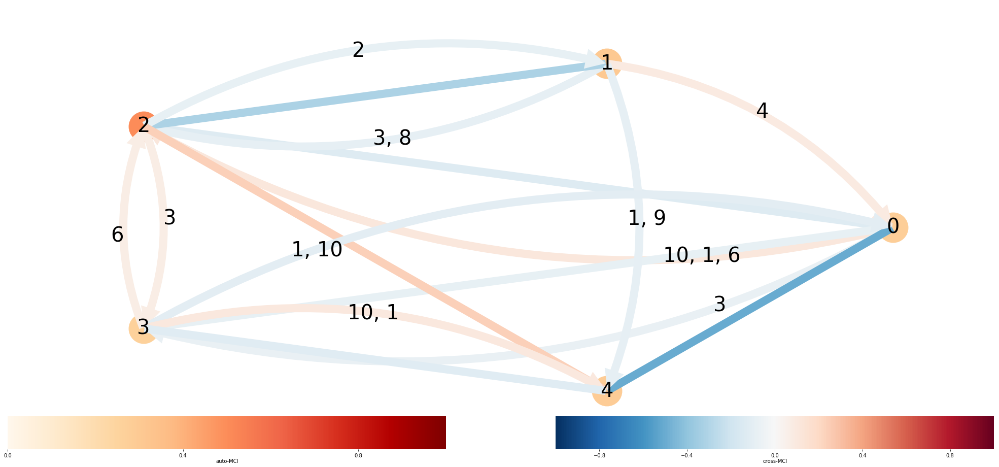

In [89]:
tp.plot_graph(
    val_matrix=results['val_matrix'],
    link_matrix=link_matrix,
    link_colorbar_label='cross-MCI',
    node_colorbar_label='auto-MCI',figsize=(30,15),
    node_label_size=40,
    link_label_fontsize = 40,
    node_size = 60,
    arrow_linewidth = 80
    )


In [90]:
q_matrix = pcmci.get_corrected_pvalues(p_matrix=results['p_matrix'], fdr_method='fdr_bh')
pcmci.print_significant_links(
        p_matrix = results['p_matrix'], 
        q_matrix = q_matrix,
        val_matrix = results['val_matrix'],
        alpha_level = 0.01)

link_matrix = pcmci.return_significant_parents(pq_matrix=q_matrix,
                        val_matrix=results['val_matrix'], alpha_level=0.01)['link_matrix']


## Significant links at alpha = 0.01:

    Variable 0 has 3 link(s):
        (4 0): pval = 0.00000 | qval = 0.00000 | val = -0.504
        (0 -1): pval = 0.00000 | qval = 0.00000 | val = 0.280
        (2 0): pval = 0.00050 | qval = 0.00050 | val = -0.125

    Variable 1 has 2 link(s):
        (2 0): pval = 0.00000 | qval = 0.00000 | val = -0.314
        (1 -1): pval = 0.00000 | qval = 0.00000 | val = 0.306

    Variable 2 has 5 link(s):
        (2 -1): pval = 0.00000 | qval = 0.00000 | val = 0.503
        (1 0): pval = 0.00000 | qval = 0.00000 | val = -0.314
        (4 0): pval = 0.00000 | qval = 0.00000 | val = 0.237
        (2 -2): pval = 0.00000 | qval = 0.00000 | val = 0.200
        (0 0): pval = 0.00050 | qval = 0.00050 | val = -0.125

    Variable 3 has 2 link(s):
        (3 -1): pval = 0.00000 | qval = 0.00000 | val = 0.268
        (4 0): pval = 0.00061 | qval = 0.00061 | val = -0.123

    Variable 4 has 4 link(s):
        (0 0): pval = 0.00000 | qval = 0.00000 | val = -0.504
 

(<Figure size 2160x1080 with 3 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fa7a70eb7f0>)

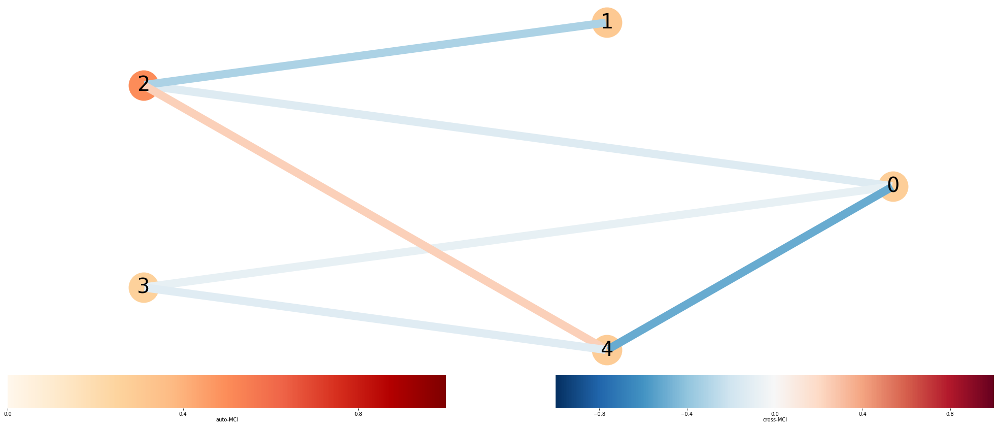

In [87]:
tp.plot_graph(
    val_matrix=results['val_matrix'],
    link_matrix=link_matrix,
    link_colorbar_label='cross-MCI',
    node_colorbar_label='auto-MCI',figsize=(30,15),
    node_label_size=40,
    link_label_fontsize = 40,
    node_size = 60,
    arrow_linewidth = 80
    )

In [ ]:
lon1 = np.arange(-40,60.0,2.5)

deg = np.zeros((len(lat_air),len(lon1)))

lat_number = deg.shape[0]
lon_number = deg.shape[1]

for i in range(lat_number):
    for j in range(lon_number):
        if not df_air[(df_air.lats == lat_air[i]) & (df_air.lons == lon1[j])].clusters.values.size == 0:
            
            deg[i,j] = df_air[(df_air.lats == lat_air[i]) & (df_air.lons == lon1[j])].clusters.values
        else:
            deg[i,j]=np.nan

In [61]:
air_list[726]

(25.0, 40.0)

In [64]:
air_list.index((22.5, -30))

721

In [68]:
neighbour_average(pre_list,pd.DataFrame(result),22.5, -30)

(-30.25, 22.25)
(-30.25, 22.5)
(-30.25, 22.75)
(-30, 22.25)
(-30, 22.75)
(-29.75, 22.25)
(-29.75, 22.5)
(-29.75, 22.75)


nan

In [60]:
index

[396,
 397,
 398,
 399,
 400,
 401,
 402,
 403,
 404,
 405,
 406,
 407,
 408,
 429,
 430,
 431,
 432,
 433,
 434,
 435,
 436,
 437,
 438,
 439,
 440,
 441,
 462,
 463,
 464,
 465,
 466,
 467,
 468,
 469,
 470,
 471,
 472,
 473,
 474,
 475,
 476,
 495,
 496,
 497,
 498,
 499,
 500,
 501,
 502,
 503,
 504,
 505,
 506,
 507,
 508,
 509,
 510,
 511,
 528,
 529,
 530,
 531,
 532,
 533,
 534,
 535,
 536,
 537,
 538,
 539,
 540,
 541,
 542,
 543,
 544,
 561,
 562,
 563,
 564,
 565,
 566,
 567,
 568,
 569,
 570,
 571,
 572,
 573,
 574,
 575,
 576,
 577,
 594,
 595,
 596,
 597,
 598,
 599,
 600,
 601,
 602,
 603,
 604,
 605,
 606,
 607,
 608,
 609,
 610,
 628,
 629,
 630,
 631,
 632,
 633,
 634,
 635,
 636,
 637,
 638,
 639,
 640,
 641,
 642,
 643,
 660,
 661,
 662,
 663,
 664,
 665,
 666,
 667,
 668,
 669,
 670,
 671,
 672,
 673,
 674,
 675,
 676,
 693,
 695,
 696,
 697,
 698,
 699,
 700,
 701,
 702,
 703,
 704,
 705,
 706,
 707,
 708,
 709,
 726,
 727,
 728,
 729,
 730,
 731,
 732,
 733,
 734

In [273]:
(22.5,12.5) in air_list

True

In [270]:
air_list

[(330.0, 40.0),
 (330.0, 37.5),
 (330.0, 35.0),
 (330.0, 32.5),
 (330.0, 30.0),
 (330.0, 27.5),
 (330.0, 25.0),
 (330.0, 22.5),
 (330.0, 20.0),
 (330.0, 17.5),
 (330.0, 15.0),
 (330.0, 12.5),
 (330.0, 10.0),
 (330.0, 7.5),
 (330.0, 5.0),
 (330.0, 2.5),
 (330.0, 0.0),
 (330.0, -2.5),
 (330.0, -5.0),
 (330.0, -7.5),
 (330.0, -10.0),
 (330.0, -12.5),
 (330.0, -15.0),
 (330.0, -17.5),
 (330.0, -20.0),
 (330.0, -22.5),
 (330.0, -25.0),
 (330.0, -27.5),
 (330.0, -30.0),
 (330.0, -32.5),
 (330.0, -35.0),
 (330.0, -37.5),
 (330.0, -40.0),
 (332.5, 40.0),
 (332.5, 37.5),
 (332.5, 35.0),
 (332.5, 32.5),
 (332.5, 30.0),
 (332.5, 27.5),
 (332.5, 25.0),
 (332.5, 22.5),
 (332.5, 20.0),
 (332.5, 17.5),
 (332.5, 15.0),
 (332.5, 12.5),
 (332.5, 10.0),
 (332.5, 7.5),
 (332.5, 5.0),
 (332.5, 2.5),
 (332.5, 0.0),
 (332.5, -2.5),
 (332.5, -5.0),
 (332.5, -7.5),
 (332.5, -10.0),
 (332.5, -12.5),
 (332.5, -15.0),
 (332.5, -17.5),
 (332.5, -20.0),
 (332.5, -22.5),
 (332.5, -25.0),
 (332.5, -27.5),
 (332.5, -3

In [329]:
air_list.index((330.0, -25.0))

26

In [339]:
np.argwhere(np.isnan(data[:,:,0]))

array([[   0,    0],
       [   0,    1],
       [   0,    2],
       ...,
       [ 816, 1218],
       [ 816, 1219],
       [ 816, 1220]])

In [338]:
data[:,700,0]

array([0.00000000e+00, 2.06500006e+00, 1.95000008e-01, 2.10000008e-01,
       2.95000017e-01, 0.00000000e+00, 0.00000000e+00, 4.09999967e-01,
       9.99999978e-03, 1.02500007e-01, 0.00000000e+00, 1.24999993e-01,
       0.00000000e+00, 1.72499999e-01, 1.14249992e+00, 2.10000008e-01,
       1.61750007e+00, 0.00000000e+00, 8.74999985e-02, 4.17500019e-01,
       9.99999978e-03, 1.02500007e-01, 0.00000000e+00, 1.02749991e+00,
       0.00000000e+00, 3.52749991e+00, 1.95000008e-01, 2.10000008e-01,
       1.23000002e+00, 0.00000000e+00, 0.00000000e+00, 2.69500017e+00,
       2.49999985e-02, 1.02500007e-01, 0.00000000e+00, 1.24999993e-01,
       0.00000000e+00, 1.72499999e-01, 1.95000008e-01, 2.10000008e-01,
       3.92499983e-01, 0.00000000e+00, 0.00000000e+00, 2.49999994e-03,
       2.02500001e-01, 1.02500007e-01, 8.47499967e-01, 1.24999993e-01,
       0.00000000e+00, 1.72499999e-01, 1.95000008e-01, 2.10000008e-01,
       3.92499983e-01, 0.00000000e+00, 0.00000000e+00, 1.06949997e+01,
      

In [279]:
air_list.index((22.5,22.5))

700

In [301]:
data[:,700,0]

array([0.00000000e+00, 2.06500006e+00, 1.95000008e-01, 2.10000008e-01,
       2.95000017e-01, 0.00000000e+00, 0.00000000e+00, 4.09999967e-01,
       9.99999978e-03, 1.02500007e-01, 0.00000000e+00, 1.24999993e-01,
       0.00000000e+00, 1.72499999e-01, 1.14249992e+00, 2.10000008e-01,
       1.61750007e+00, 0.00000000e+00, 8.74999985e-02, 4.17500019e-01,
       9.99999978e-03, 1.02500007e-01, 0.00000000e+00, 1.02749991e+00,
       0.00000000e+00, 3.52749991e+00, 1.95000008e-01, 2.10000008e-01,
       1.23000002e+00, 0.00000000e+00, 0.00000000e+00, 2.69500017e+00,
       2.49999985e-02, 1.02500007e-01, 0.00000000e+00, 1.24999993e-01,
       0.00000000e+00, 1.72499999e-01, 1.95000008e-01, 2.10000008e-01,
       3.92499983e-01, 0.00000000e+00, 0.00000000e+00, 2.49999994e-03,
       2.02500001e-01, 1.02500007e-01, 8.47499967e-01, 1.24999993e-01,
       0.00000000e+00, 1.72499999e-01, 1.95000008e-01, 2.10000008e-01,
       3.92499983e-01, 0.00000000e+00, 0.00000000e+00, 1.06949997e+01,
      

In [348]:
r = neighbour_average(pre_list,pd.DataFrame(result),air_list[26][0], air_list[26][1])

In [350]:
np.isnan(r)

True

In [325]:
np.average(r,axis=0)

array([0.00000000e+00, 2.06500006e+00, 1.95000008e-01, 2.10000008e-01,
       2.95000017e-01, 0.00000000e+00, 0.00000000e+00, 4.09999967e-01,
       9.99999978e-03, 1.02500007e-01, 0.00000000e+00, 1.24999993e-01,
       0.00000000e+00, 1.72499999e-01, 1.14249992e+00, 2.10000008e-01,
       1.61750007e+00, 0.00000000e+00, 8.74999985e-02, 4.17500019e-01,
       9.99999978e-03, 1.02500007e-01, 0.00000000e+00, 1.02749991e+00,
       0.00000000e+00, 3.52749991e+00, 1.95000008e-01, 2.10000008e-01,
       1.23000002e+00, 0.00000000e+00, 0.00000000e+00, 2.69500017e+00,
       2.49999985e-02, 1.02500007e-01, 0.00000000e+00, 1.24999993e-01,
       0.00000000e+00, 1.72499999e-01, 1.95000008e-01, 2.10000008e-01,
       3.92499983e-01, 0.00000000e+00, 0.00000000e+00, 2.49999994e-03,
       2.02500001e-01, 1.02500007e-01, 8.47499967e-01, 1.24999993e-01,
       0.00000000e+00, 1.72499999e-01, 1.95000008e-01, 2.10000008e-01,
       3.92499983e-01, 0.00000000e+00, 0.00000000e+00, 1.06949997e+01,
      

In [316]:
pre_list.index((22.25,22.75))

6173

In [317]:
result[:,6173]

matrix([[0.000e+00],
        [2.060e+00],
        [2.200e-01],
        [2.400e-01],
        [3.000e-01],
        [0.000e+00],
        [0.000e+00],
        [3.500e-01],
        [1.000e-02],
        [1.200e-01],
        [0.000e+00],
        [1.600e-01],
        [0.000e+00],
        [1.700e-01],
        [1.160e+00],
        [2.400e-01],
        [1.530e+00],
        [0.000e+00],
        [7.000e-02],
        [3.500e-01],
        [1.000e-02],
        [1.200e-01],
        [0.000e+00],
        [1.000e+00],
        [0.000e+00],
        [3.400e+00],
        [2.200e-01],
        [2.400e-01],
        [1.260e+00],
        [0.000e+00],
        [0.000e+00],
        [2.250e+00],
        [1.000e-02],
        [1.200e-01],
        [0.000e+00],
        [1.600e-01],
        [0.000e+00],
        [1.700e-01],
        [2.200e-01],
        [2.400e-01],
        [4.000e-01],
        [0.000e+00],
        [0.000e+00],
        [0.000e+00],
        [1.500e-01],
        [1.200e-01],
        [8.700e-01],
        [1.60